# IMDB Dataset - Capstone Project

## Phase 3

### 1) Now make only 1 data frame of two CSV files using the join operation of pandas and start doing EDA.

### 2) Do the complete EDA in detail to explore the insights of data and write detailed observations of each analysis.

## Phase:4

### 1) Write the complete Machine learning code to make predictions of votes and gross collection. Use appropriate models on their label basis. Remember you need to make 2 different predictions: vote and gross collection.

### 2) Apply all the best techniques of scaling, and hyperparameter tuning, and avoid underfitting or overfitting (bias/variance)

### 3) At the end save the best model and convey on which basis you have chosen that model

In [602]:
# Importing libraries

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

import sklearn
from sklearn import preprocessing

import warnings
warnings.filterwarnings('ignore')

In [603]:
# Importing the IMDB_Dataset1

imdb_1 = pd.read_csv("IMDB_dataset1.csv",skipinitialspace = True)

In [604]:
# Importing the IMDB_Dataset2

imdb_2 = pd.read_csv("IMDB_dataset2.csv",skipinitialspace = True)

In [605]:
# Merging IMDB_Dataset1 and IMDB_Dataset2 by Movie_Name

pd.set_option("Display.max_columns",None)
pd.set_option("Display.max_rows",None)

imdb = pd.merge(imdb_1,imdb_2, on = 'Movie_Name')
imdb.head(5)

,Sno,Movie_Name,Director_Name,Director_1,Director_2,Duration,Year,Ratings,Metascore,Popularity,Stars,Star_1,Star_2,Star_3,Star_4,Votes,Genre,Genre_1,Genre_2,Genre_3,Gross_Collection_$M,Certification
0,1,Fast X,Louis Leterrier,Louis Leterrier,NaN,141 min,2023,6.3,55.0,1,"Vin Diesel, Michelle Rodriguez, Jason Statham,...",Vin Diesel,Michelle Rodriguez,Jason Statham,Jordana Brewster,34473,"Action, Adventure, Crime",Action,Adventure,Crime,NaN,PG-13
1,2,Guardians of the Galaxy Vol. 3,James Gunn,James Gunn,NaN,150 min,2023,8.2,64.0,2,"Chris Pratt, Chukwudi Iwuji, Bradley Cooper, P...",Chris Pratt,Chukwudi Iwuji,Bradley Cooper,Pom Klementieff,151932,"Action, Adventure, Comedy",Action,Adventure,Comedy,NaN,PG-13
2,3,John Wick: Chapter 4,Chad Stahelski,Chad Stahelski,NaN,169 min,2023,8.0,78.0,3,"Keanu Reeves, Laurence Fishburne, George Georg...",Keanu Reeves,Laurence Fishburne,George Georgiou,Lance Reddick,184574,"Action, Crime, Thriller",Action,Crime,Thriller,NaN,R
3,4,Dungeons & Dragons: Honor Among Thieves,"John Francis Daley, Jonathan Goldstein",John Francis Daley,Jonathan Goldstein,134 min,2023,7.3,72.0,4,"Chris Pine, Michelle Rodriguez, Regé-Jean Page...",Chris Pine,Michelle Rodriguez,Regé-Jean Page,Justice Smith,116875,"Action, Adventure, Comedy",Action,Adventure,Comedy,NaN,PG-13
4,5,Ant-Man and the Wasp: Quantumania,Peyton Reed,Peyton Reed,NaN,124 min,2023,6.1,48.0,5,"Paul Rudd, Evangeline Lilly, Michael Douglas, ...",Paul Rudd,Evangeline Lilly,Michael Douglas,Michelle Pfeiffer,163120,"Action, Adventure, Comedy",Action,Adventure,Comedy,NaN,PG-13


# Exploratory Data Analysis (EDA)

# Data Preprocessing

In [606]:
# Checking the shape of the dataset

imdb.shape

(1750, 22)

In [607]:
# Checking the information of the dataset

imdb.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1750 entries, 0 to 1749
Data columns (total 22 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Sno                  1750 non-null   int64  
 1   Movie_Name           1750 non-null   object 
 2   Director_Name        1750 non-null   object 
 3   Director_1           1750 non-null   object 
 4   Director_2           112 non-null    object 
 5   Duration             1750 non-null   object 
 6   Year                 1750 non-null   int64  
 7   Ratings              1750 non-null   float64
 8   Metascore            1566 non-null   float64
 9   Popularity           1750 non-null   int64  
 10  Stars                1750 non-null   object 
 11  Star_1               1750 non-null   object 
 12  Star_2               1749 non-null   object 
 13  Star_3               1749 non-null   object 
 14  Star_4               1748 non-null   object 
 15  Votes                1750 non-null   i

In [608]:
# Checking for null values in the dataset

imdb.isnull().sum()

Sno                       0
Movie_Name                0
Director_Name             0
Director_1                0
Director_2             1638
Duration                  0
Year                      0
Ratings                   0
Metascore               184
Popularity                0
Stars                     0
Star_1                    0
Star_2                    1
Star_3                    1
Star_4                    2
Votes                     0
Genre                     0
Genre_1                   0
Genre_2                   2
Genre_3                 144
Gross_Collection_$M     279
Certification            10
dtype: int64

In [609]:
# Checking the missing ratio of the dataset 

missing_ratio = imdb.isnull().sum() / len(imdb) * 100
missing_ratio.sort_values(ascending=False)

Director_2             93.600000
Gross_Collection_$M    15.942857
Metascore              10.514286
Genre_3                 8.228571
Certification           0.571429
Genre_2                 0.114286
Star_4                  0.114286
Star_2                  0.057143
Star_3                  0.057143
Genre_1                 0.000000
Genre                   0.000000
Votes                   0.000000
Sno                     0.000000
Movie_Name              0.000000
Stars                   0.000000
Popularity              0.000000
Ratings                 0.000000
Year                    0.000000
Duration                0.000000
Director_1              0.000000
Director_Name           0.000000
Star_1                  0.000000
dtype: float64

In [610]:
# Checking on the unique values present in the dataset

imdb.nunique()

Sno                    1750
Movie_Name             1750
Director_Name           949
Director_1              928
Director_2               88
Duration                119
Year                     74
Ratings                  66
Metascore                86
Popularity             1750
Stars                  1729
Star_1                  723
Star_2                 1162
Star_3                 1327
Star_4                 1444
Votes                  1746
Genre                    80
Genre_1                   2
Genre_2                  15
Genre_3                  18
Gross_Collection_$M    1358
Certification            16
dtype: int64

In [611]:
# Checking the count of values present in the dataset

for i in imdb.columns:
    print(imdb[i].value_counts())
    print("*"*75)

1       1
1164    1
1175    1
1174    1
1173    1
1172    1
1171    1
1170    1
1169    1
1168    1
1167    1
1166    1
1165    1
1163    1
1150    1
1162    1
1161    1
1160    1
1159    1
1158    1
1157    1
1156    1
1155    1
1154    1
1153    1
1152    1
1176    1
1177    1
1178    1
1179    1
1202    1
1201    1
1200    1
1199    1
1198    1
1197    1
1196    1
1195    1
1194    1
1193    1
1192    1
1191    1
1190    1
1189    1
1188    1
1187    1
1186    1
1185    1
1184    1
1183    1
1182    1
1181    1
1180    1
1151    1
1149    1
1095    1
1109    1
1120    1
1119    1
1118    1
1117    1
1116    1
1115    1
1114    1
1113    1
1112    1
1111    1
1110    1
1108    1
1148    1
1107    1
1106    1
1105    1
1104    1
1103    1
1102    1
1101    1
1100    1
1099    1
1098    1
1097    1
1121    1
1122    1
1123    1
1124    1
1147    1
1146    1
1145    1
1144    1
1143    1
1142    1
1141    1
1140    1
1139    1
1138    1
1137    1
1136    1
1135    1
1134    1
1133    1


In [612]:
# Dropping columns Sno and Popularity

imdb.drop(['Sno','Popularity'],axis=1,inplace=True)
imdb.shape

(1750, 20)

In [613]:
# Checking the features present in the dataset after dropping 'Sno' and 'Popularity'

imdb.columns

Index(['Movie_Name', 'Director_Name', 'Director_1', 'Director_2', 'Duration',
       'Year', 'Ratings', 'Metascore', 'Stars', 'Star_1', 'Star_2', 'Star_3',
       'Star_4', 'Votes', 'Genre', 'Genre_1', 'Genre_2', 'Genre_3',
       'Gross_Collection_$M', 'Certification'],
      dtype='object')

In [614]:
# Removing 'min' from 'Duration' and converting the feature to integer

imdb['Duration'] = [int(value.replace('min', '')) if value is not None else None for value in imdb['Duration']]

In [615]:
# Checking the datatypes present in the dataset

imdb.dtypes

Movie_Name              object
Director_Name           object
Director_1              object
Director_2              object
Duration                 int64
Year                     int64
Ratings                float64
Metascore              float64
Stars                   object
Star_1                  object
Star_2                  object
Star_3                  object
Star_4                  object
Votes                    int64
Genre                   object
Genre_1                 object
Genre_2                 object
Genre_3                 object
Gross_Collection_$M    float64
Certification           object
dtype: object

### Observations

Imported required libraries for Data Preprocessing and Visualization

Imported and merged IMDB_dataset1 and IMDB_dataset2 as imdb using pandas merge

imdb dataset contains 1750 rows and 22 columns

Data types present in the dataset are float64 – 3, int64 – 4 and object -15

Null values are present in the dataset, and the features with the highest missing ratios are as follows: Director_2 with 93.6%, Gross_Collection_$M with 15.9%, Metascore with 10.5%, Genre_3 with 8.2%, Certification with 0.5%, Genre_2 with 0.1%, Star_4 with 0.1%, Star_2 with 0.05%, and Star_3 with 0.05%

Examined each features by checking the count of values to verify if there are any abnormal or unknown values present in the features

Dropped Sno and Popularity as it contains 1750 unique values which is equivalent to the rows and it wont be much relevant in model prediciton, moreover data has been extracted based on popularity from 1 to 1750

Removed 'min' from 'Duration' and converted the feature to integer

Initially Gross_Collection data type is object and it has been converted into float after removing '$' and 'M' during web scraping

Dataset contains 1750 rows and 20 columns after dropping Sno and Popularity

After preprocesing the Data types present in the dataset are float64 – 3, int64 – 3 and object -14

Treating Null values and further dropping of features will be done after data visualization analysis

Votes and Gross_Collection are the two target variables for Prediction

Here I’m going to use Regression and Classification algorithm for both the Target Variables, for classification the features will be categorized into multi-class based on 'Gross_Collection' and 'Votes'

# Data Visualization

## Univariate Analysis

<Axes: >

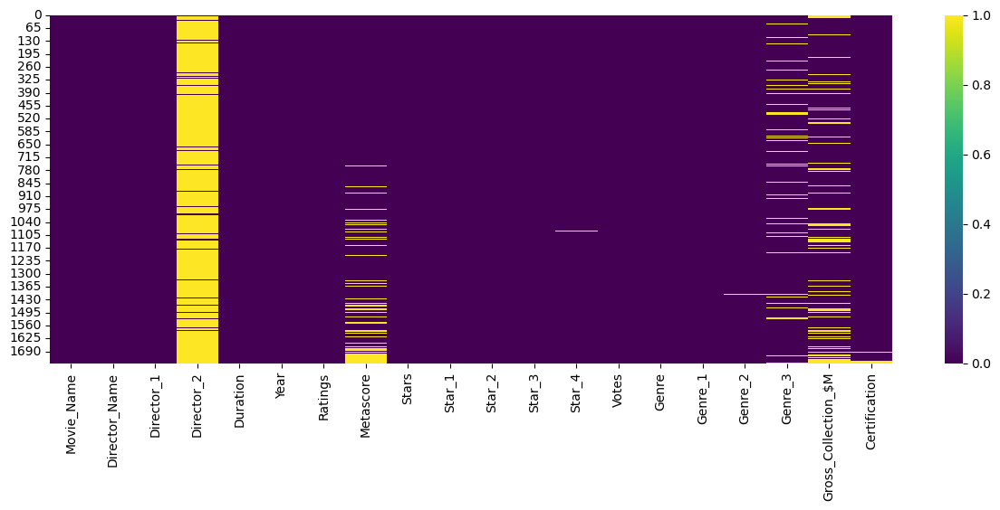

In [616]:
# Visualizing the dataset in heatmap for null values


plt.figure(figsize=(15,5))
sns.heatmap(imdb.isnull(),cmap='viridis')

### Observations

Above heatmap shows presence of null values present in the dataset

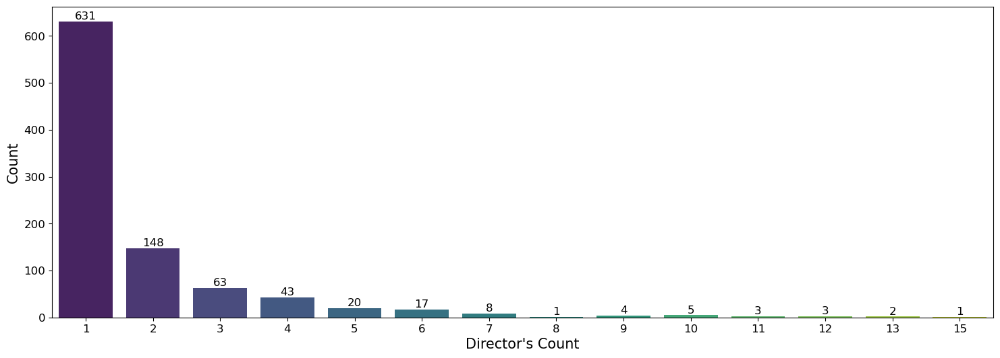

In [617]:
# Visualizing count of Director's in countplot

director_counts = imdb['Director_Name'].value_counts()

plt.figure(figsize=(18,6))
rx = sns.countplot(data = imdb,x=director_counts, palette='viridis')
plt.xlabel("Director's Count",fontsize=15)
plt.xticks(fontsize=12) 
plt.yticks(fontsize=12) 
plt.ylabel('Count',fontsize=15)
for i in rx.containers:
    rx.bar_label(i,fontsize=12)
plt.show()

### Observations

In above countplot, we can observe director's count based on how many movies directed by them

631 director's have directed 1 movie, director's with 2 movies are 148 and with 3 movies are 63

Count of director with 15 movies is 1, followed by 13 movies are 2 and 12 movies are 3

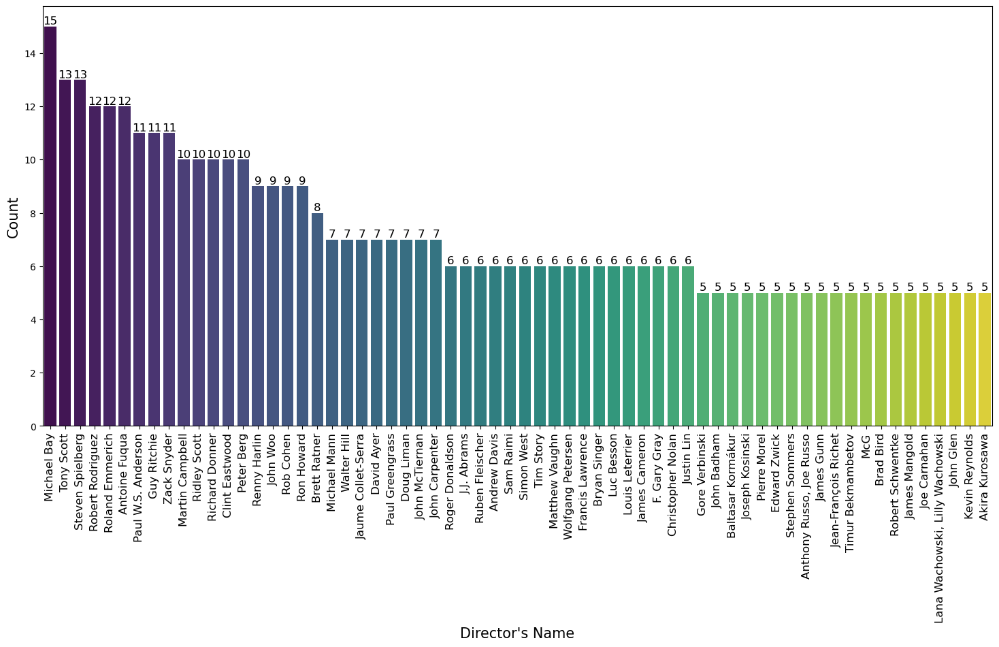

In [618]:
# Visualizing Director_Name in countplot who have directed more than 5 movies

director_counts = imdb['Director_Name'].value_counts()
director_more_than_5_movies = director_counts[director_counts >= 5]

plt.figure(figsize=(18,8))
rx = sns.countplot(data = imdb,x='Director_Name', order=director_more_than_5_movies.index, palette='viridis')
plt.xlabel("Director's Name",fontsize=15)
plt.xticks(rotation = 90,fontsize=12) 
plt.ylabel('Count',fontsize=15)
for i in rx.containers:
    rx.bar_label(i,fontsize=12)
plt.show()

### Observations

Above countplot shows the list of director's name who have directed more than 5 movies

Michael Bay is the director with the most number of movies directed and below is the list of directors who have directed more than 10 movies

Michael Bay - 15,
Tony Scott - 13,
Steven Spielberg - 13,
Robert Rodriguez - 12,
Roland Emmerich - 12,
Antoine Fuqua - 12,
Paul W.S. Anderson - 11,
Guy Ritchie - 11,
Zack Snyder - 11,
Martin Campbell - 10,
Ridley Scott - 10,
Richard Donner - 10,
Clint Eastwood - 10,
Peter Berg - 10,

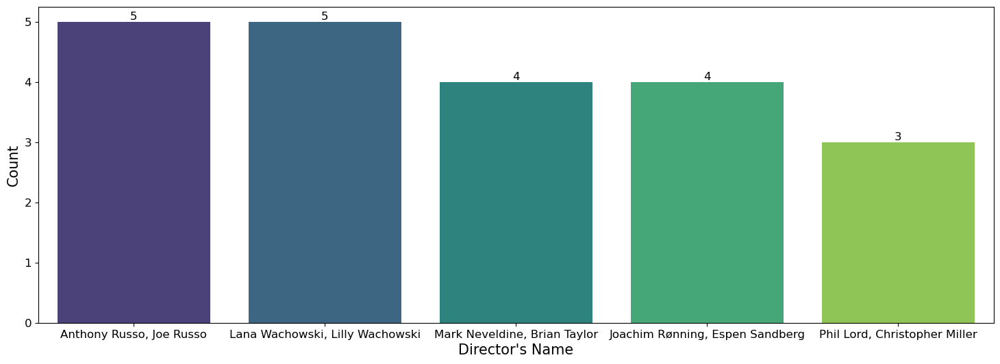

In [619]:
# Visualizing count of Dual Director's who directed 3 or more movies together

dir_2 = []
count = 0
for director in imdb['Director_Name']:
    if ',' in director:
        dir_2.append(director)
        count += 1
        
director2_count = pd.Series(dir_2).value_counts()
director2_more_than_3movies = director2_count[director2_count >= 3]

plt.figure(figsize=(18,6))
rx = sns.countplot(data = imdb,x='Director_Name', order = director2_more_than_3movies.index, palette='viridis')
plt.xlabel("Director's Name",fontsize=15)
plt.xticks(fontsize=12) 
plt.yticks(fontsize=12) 
plt.ylabel('Count',fontsize=15)
for i in rx.containers:
    rx.bar_label(i,fontsize=12)
plt.show()

### Observations

Above countplot shows the list of Director's who directed 3 or more movies together.

Anthony Russo, Joe Russo - 5,
Lana Wachowski, Lilly Wachowski - 5,
Mark Neveldine, Brian Taylor - 4,
Joachim Rønning, Espen Sandberg - 4,
Phil Lord, Christopher Miller - 3

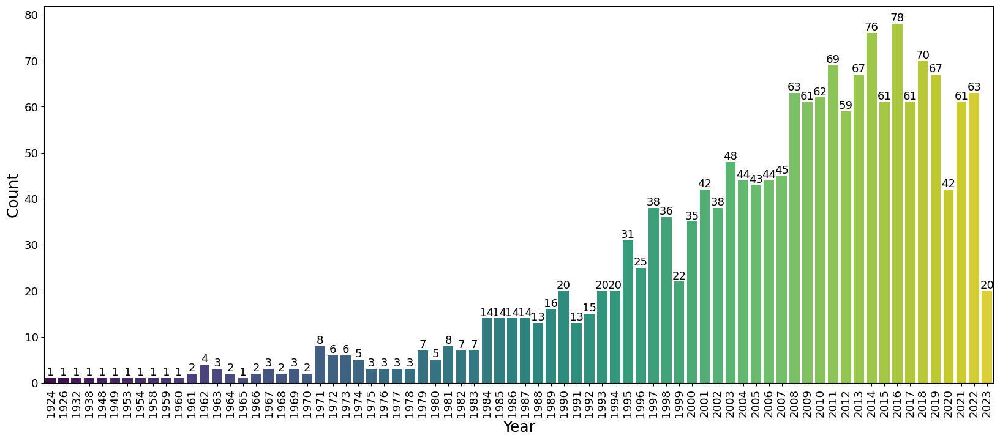

In [620]:
# Visualizing year in histplot

plt.figure(figsize=(20,8))
rx = sns.countplot(x=imdb['Year'],palette="viridis")
plt.xlabel('Year',fontsize=18)
plt.xticks(fontsize=13,rotation=90) 
plt.ylabel('Count',fontsize=18)
plt.yticks(fontsize=13)

for i in rx.containers:
    rx.bar_label(i,fontsize=13)
plt.show()

### Observations

Above histplot for Year shows

Dataset contains movie's from the year 1924 to 2023 which is almost 100 years

Most of the movies release years are in between 2000 to 2022 and 2016 recorded maximum releases with 78 count

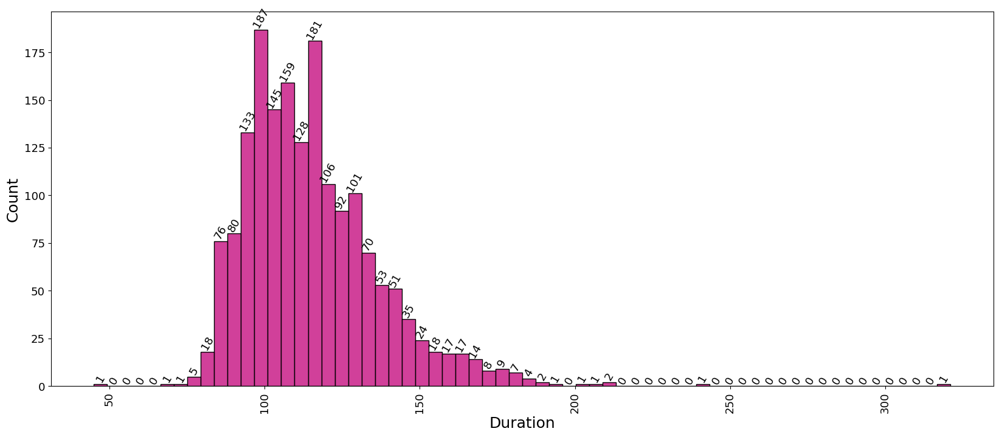

In [621]:
# Visualizing Duration in histplot

plt.figure(figsize=(20,8))
rx = sns.histplot(imdb['Duration'],color="#c20078")
plt.xlabel('Duration',fontsize=18)
plt.xticks(fontsize=13,rotation=90) 
plt.ylabel('Count',fontsize=18)
plt.yticks(fontsize=13)

for i in rx.containers:
    rx.bar_label(i,fontsize=13,rotation=60)
plt.show()

### Observations

Based on above histplot, we can observe

Duration of the movies are mostly between 90 mins to 135 mins

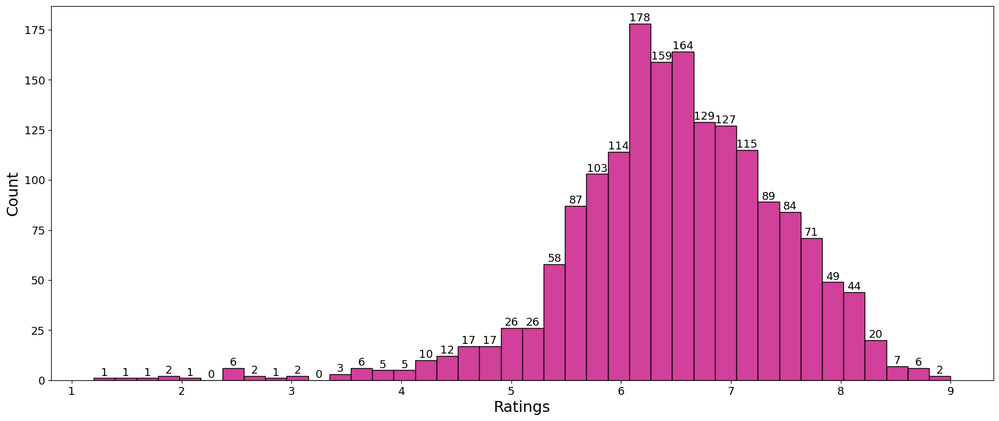

In [622]:
# Visualizing Ratings in histplot

plt.figure(figsize=(20,8))
rx = sns.histplot(imdb['Ratings'],color="#c20078")
plt.xlabel('Ratings',fontsize=18)
plt.xticks(fontsize=13) 
plt.ylabel('Count',fontsize=18)
plt.yticks(fontsize=13)

for i in rx.containers:
    rx.bar_label(i,fontsize=13)
plt.show()

### Observations

Based on above histplot, we can observe

Ratings of the movies are mostly between 5.6 to 7.6

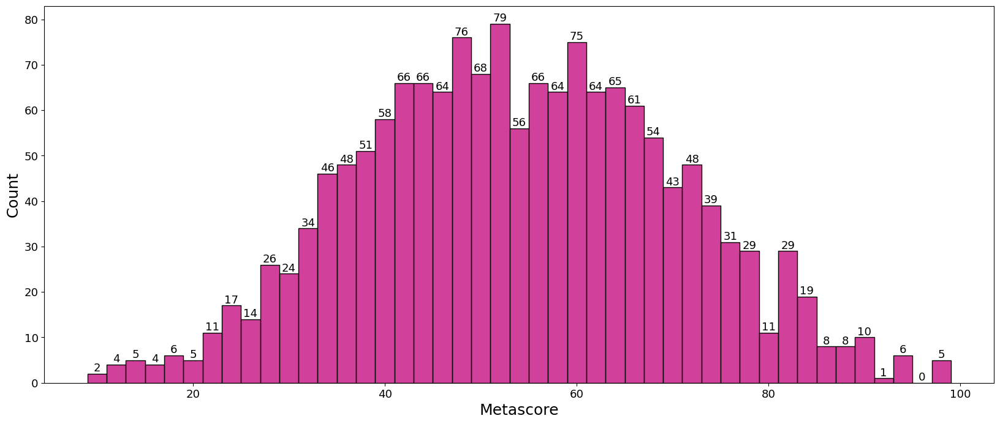

In [623]:
# Visualizing Metascore in histplot

plt.figure(figsize=(20,8))
rx = sns.histplot(imdb['Metascore'],binwidth=2,color="#c20078")
plt.xlabel('Metascore',fontsize=18)
plt.xticks(fontsize=13) 
plt.ylabel('Count',fontsize=18)
plt.yticks(fontsize=13)

for i in rx.containers:
    rx.bar_label(i,fontsize=13)
plt.show()

### Observations

Based on above histplot, we can observe

Metascore of the movies are mostly ranges between 35 to 75

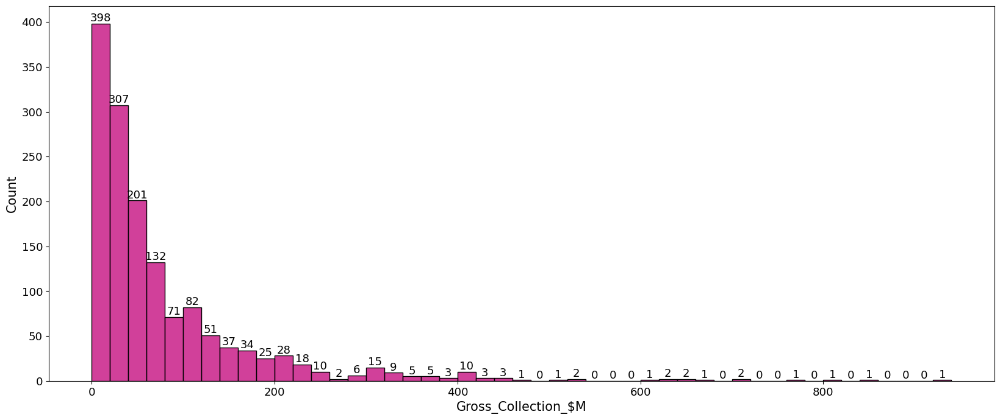

In [624]:
# Visualizing Gross_Collection_$M in histplot

plt.figure(figsize=(20,8))
rx = sns.histplot(data = imdb,x='Gross_Collection_$M', binwidth = 20, color ='#c20078')
plt.xlabel("Gross_Collection_$M",fontsize=15)
plt.ylabel("Count",fontsize=15)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)

for i in rx.containers:
    rx.bar_label(i,fontsize=13)
plt.show()

### Observation

Based on Gross_Collection we can observe, almost 75% of the data contains movies which have Gross_Collection below 100 Million Dollars and remaining are above 100 Million Dollars

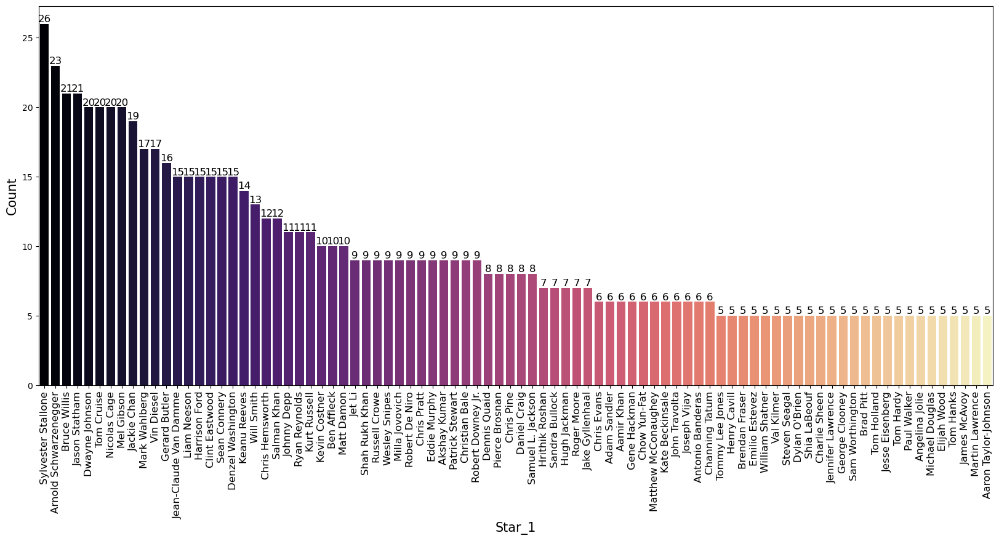

In [625]:
# Visualizing Star_1 in countplot who have appeared in more than 5 movies

star1_counts = imdb['Star_1'].value_counts()
Star1_acted_morethan_5_movies = star1_counts[star1_counts >= 5]

plt.figure(figsize=(20,8))
rx = sns.countplot(data = imdb,x='Star_1', order=Star1_acted_morethan_5_movies.index, palette='magma')
plt.xlabel("Star_1",fontsize=15)
plt.xticks(rotation = 90,fontsize=12) 
plt.ylabel('Count',fontsize=15)
for i in rx.containers:
    rx.bar_label(i,fontsize=12)
plt.show()

### Observation

Above countplot shows, actors(star_1) who has acted more than 5 movies in this dataset and below is the list of actors
with more than 20 movies

Sylvester Stallone,
Arnold Schwarzenegger,
Bruce Willis,
Jason Statham,
Dwayne Johnson,
Mel Gibson,
Nicolas Cage and
Tom Cruise

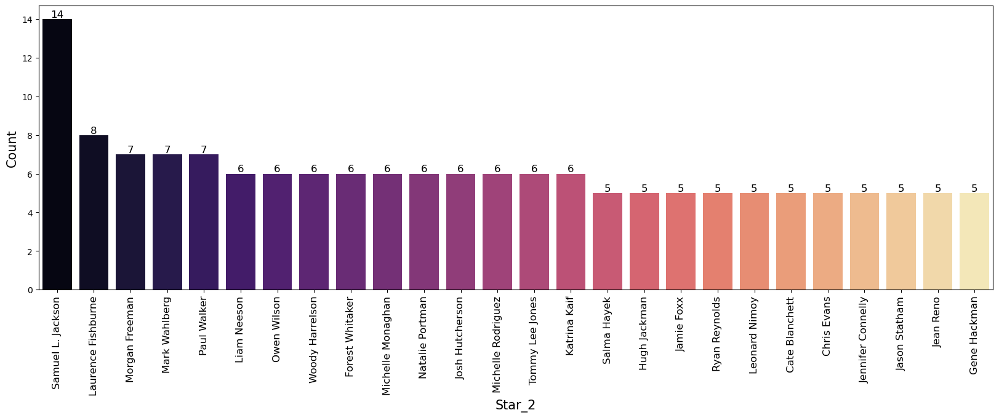

In [626]:
# Visualizing Star_2 in countplot who have appeared in more than 5 movies

star2_counts = imdb['Star_2'].value_counts()
Star2_acted_morethan_5_movies = star2_counts[star2_counts >= 5]

plt.figure(figsize=(20,6))
rx = sns.countplot(data = imdb,x='Star_2', order=Star2_acted_morethan_5_movies.index, palette='magma')
plt.xlabel("Star_2",fontsize=15)
plt.xticks(rotation = 90,fontsize=12) 
plt.ylabel('Count',fontsize=15)
for i in rx.containers:
    rx.bar_label(i,fontsize=12)
plt.show()

### Observation

Above countplot shows, actors(star_2) who has acted more than 5 movies in this dataset and below is the list of actors
with more than 6 movies

Samuel L. Jackson,
Laurence Fishburne,
Mark Wahlberg,
Morgan Freeman,
Paul Walker,
Forest Whitaker,
Josh Hutcherson,
Katrina Kaif,
Liam Neeson,
Michelle Monaghan,
Michelle Rodriguez,
Natalie Portman,
Owen Wilson,
Tommy Lee Jones and
Woody Harrelson

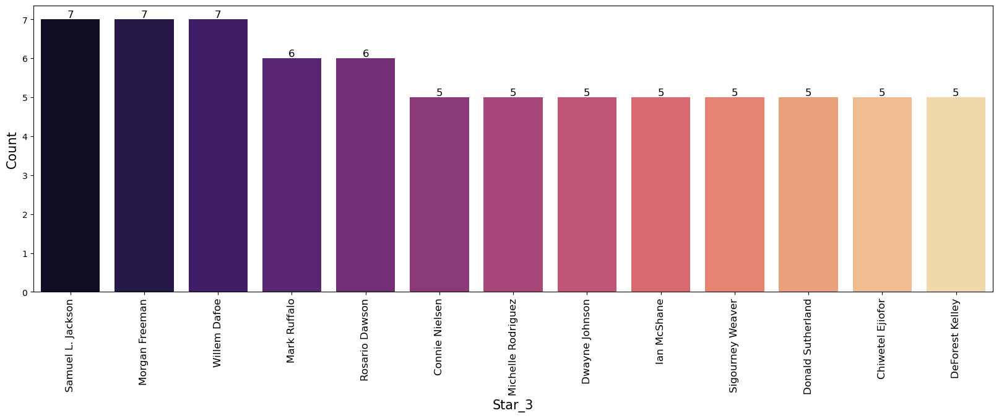

In [627]:
# Visualizing Star_3 in countplot who have appeared in more than 5 movies

star3_counts = imdb['Star_3'].value_counts()
Star3_acted_morethan_5_movies = star3_counts[star3_counts >= 5]

plt.figure(figsize=(20,6))
rx = sns.countplot(data = imdb,x='Star_3', order=Star3_acted_morethan_5_movies.index, palette='magma')
plt.xlabel("Star_3",fontsize=15)
plt.xticks(rotation = 90,fontsize=12) 
plt.ylabel('Count',fontsize=15)
for i in rx.containers:
    rx.bar_label(i,fontsize=12)
plt.show()

### Observation

Above countplot shows, actors(star_3) who has acted more than 5 movies in this dataset and below is the list of actors with more than 6 movies

Morgan Freeman,
Samuel L. Jackson,
Willem Dafoe,
Mark Ruffalo and
Rosario Dawson

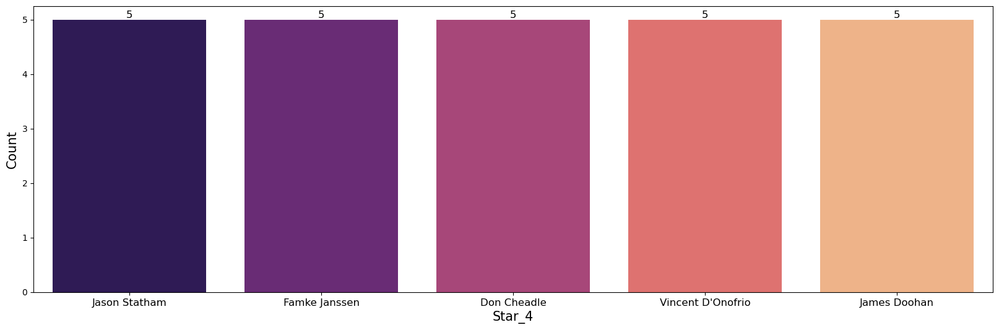

In [628]:
# Visualizing Star_4 in countplot who have appeared in more than 5 movies

star4_counts = imdb['Star_4'].value_counts()
Star4_acted_morethan_5_movies = star4_counts[star4_counts >= 5]

plt.figure(figsize=(20,6))
rx = sns.countplot(data = imdb,x='Star_4', order=Star4_acted_morethan_5_movies.index, palette='magma')
plt.xlabel("Star_4",fontsize=15)
plt.xticks(fontsize=12) 
plt.ylabel('Count',fontsize=15)
for i in rx.containers:
    rx.bar_label(i,fontsize=12)
plt.show()

### Observation

Above countplot shows, actors(star_4) who has acted more than 5 movies in this dataset

Don Cheadle,
Famke Janssen,
James Doohan,
Jason Statham and
Vincent D'Onofrio

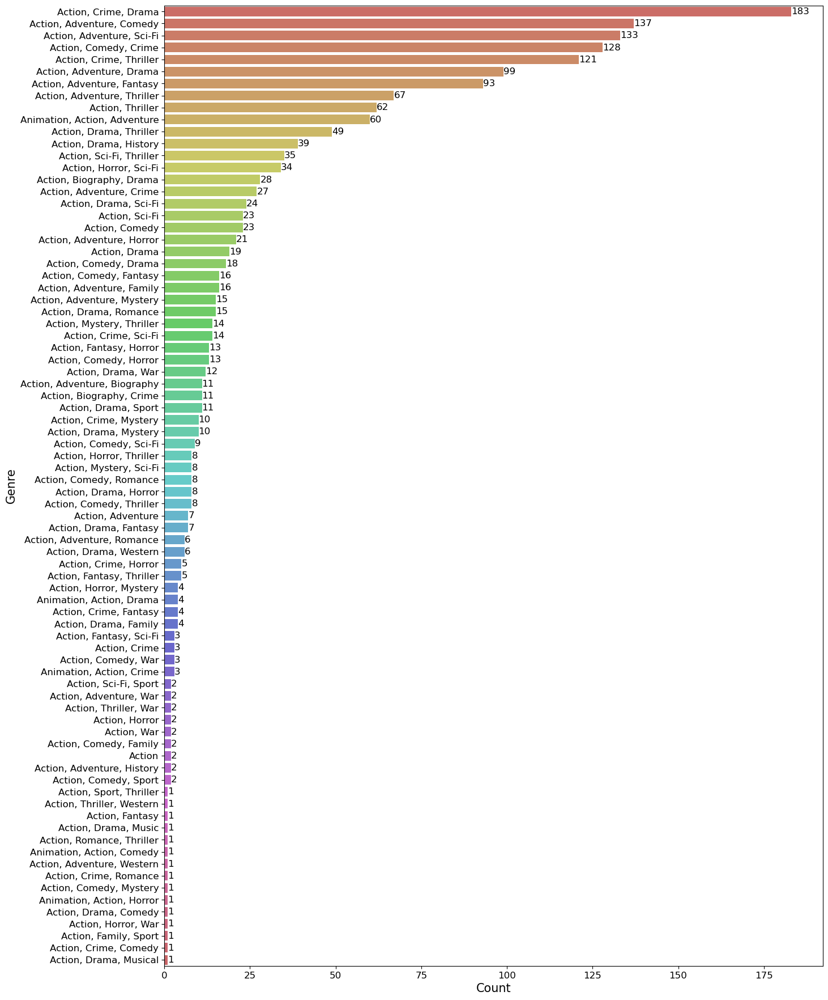

In [629]:
# Visualizing Genre in countplot

sort = imdb['Genre'].value_counts().sort_values(ascending = False)

plt.figure(figsize=(15,22))
rx = sns.countplot(data = imdb,y='Genre',order = sort.index, palette='hls')
plt.xlabel("Count",fontsize=15)
plt.ylabel("Genre",fontsize=15)
plt.xticks(fontsize=12) 
plt.yticks(fontsize=12)

for i in rx.containers:
    rx.bar_label(i,fontsize=12)
plt.show()

### Observations

Below are the Top 10 Genre's based on their total count

Action, Crime, Drama	183

Action, Adventure, Comedy	137

Action, Adventure, Sci-Fi	133

Action, Comedy, Crime	128

Action, Crime, Thriller	121

Action, Adventure, Drama	99

Action, Adventure, Fantasy	93

Action, Adventure, Thriller	67

Action, Thriller	62

Animation, Action, Adventure	60

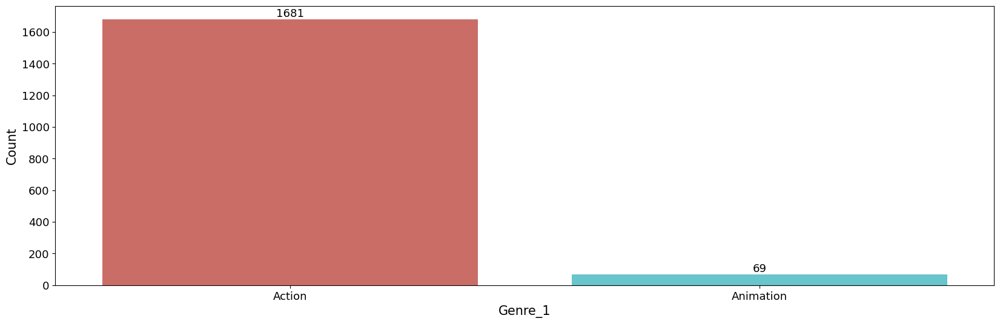

In [630]:
# Visualizing Genre_1 in countplot

plt.figure(figsize=(20,6))
rx = sns.countplot(data = imdb,x='Genre_1',palette='hls')
plt.xlabel("Genre_1",fontsize=15)
plt.ylabel("Count",fontsize=15)
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)

for i in rx.containers:
    rx.bar_label(i,fontsize=13)
plt.show()

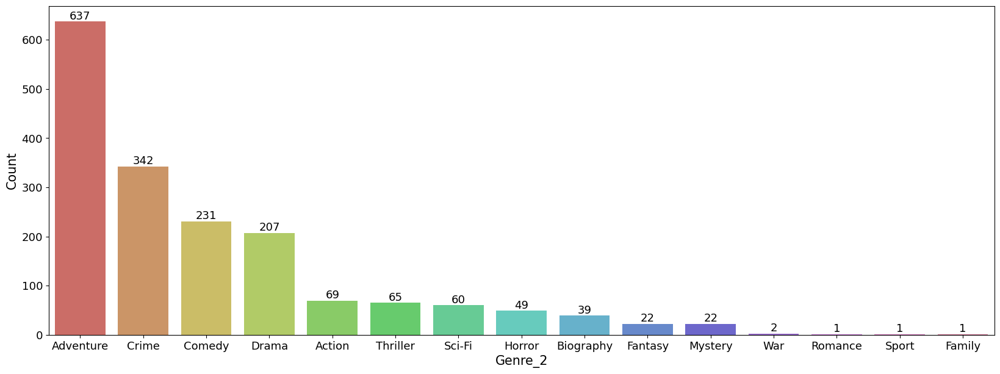

In [631]:
# Visualizing Genre_2 in countplot

sort = imdb['Genre_2'].value_counts().sort_values(ascending = False)

plt.figure(figsize=(20,7))
rx = sns.countplot(data = imdb,x='Genre_2',order = sort.index, palette='hls')
plt.xlabel("Genre_2",fontsize=15)
plt.ylabel("Count",fontsize=15)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)

for i in rx.containers:
    rx.bar_label(i,fontsize=13)
plt.show()

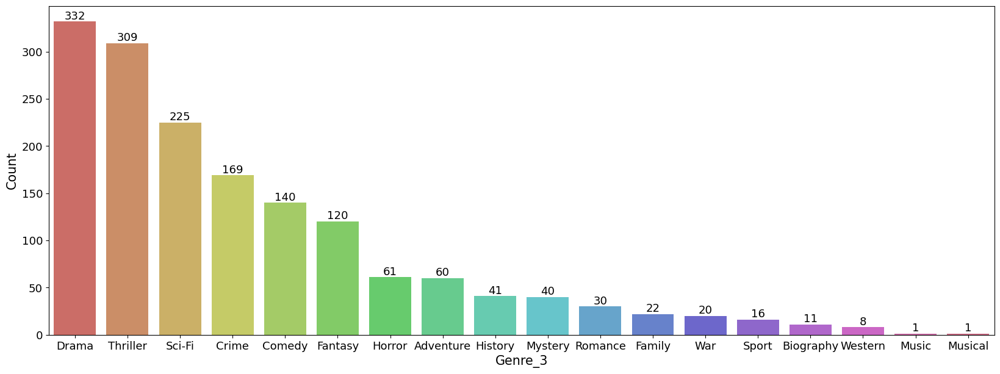

In [632]:
# Visualizing Genre_3 in countplot

sort = imdb['Genre_3'].value_counts().sort_values(ascending = False)

plt.figure(figsize=(20,7))
rx = sns.countplot(data = imdb,x='Genre_3',order = sort.index, palette='hls')
plt.xlabel("Genre_3",fontsize=15)
plt.ylabel("Count",fontsize=15)
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)

for i in rx.containers:
    rx.bar_label(i,fontsize=13)
plt.show()

### Observations

Below are the Top 5 Genre's based on their count

Genre_1
Action	1681 and
Animation	69

Genre_2:
Adventure	637,
Crime	342,
Comedy	231,
Drama	207 and
Action	69

Genre_3:
Drama	332,
Thriller	309,
Sci-Fi	225,
Crime	169 and
Comedy	140



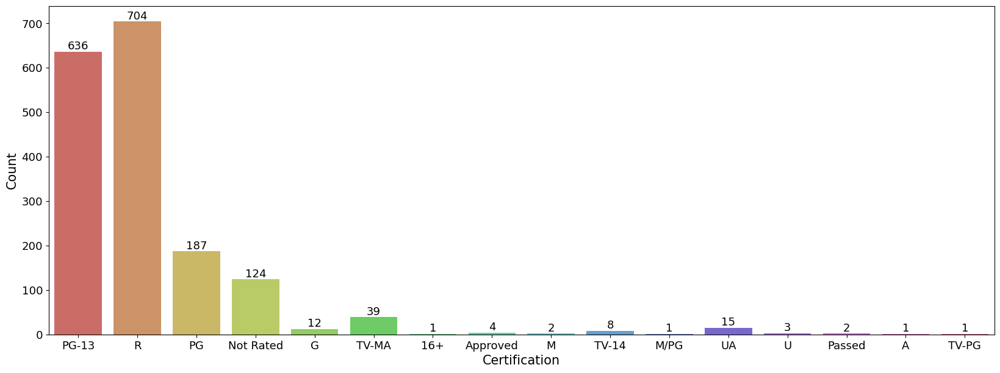

In [633]:
# Visualizing Certification in countplot

plt.figure(figsize=(20,7))
rx = sns.countplot(data = imdb,x='Certification', palette='hls')
plt.xlabel("Certification",fontsize=15)
plt.ylabel("Count",fontsize=15)
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)

for i in rx.containers:
    rx.bar_label(i,fontsize=13)
plt.show()

### Observations

PG-13 and R rated movies count are high and 75% of the movies are falling under these two categories

## Bivariate and Multivariate Analysis

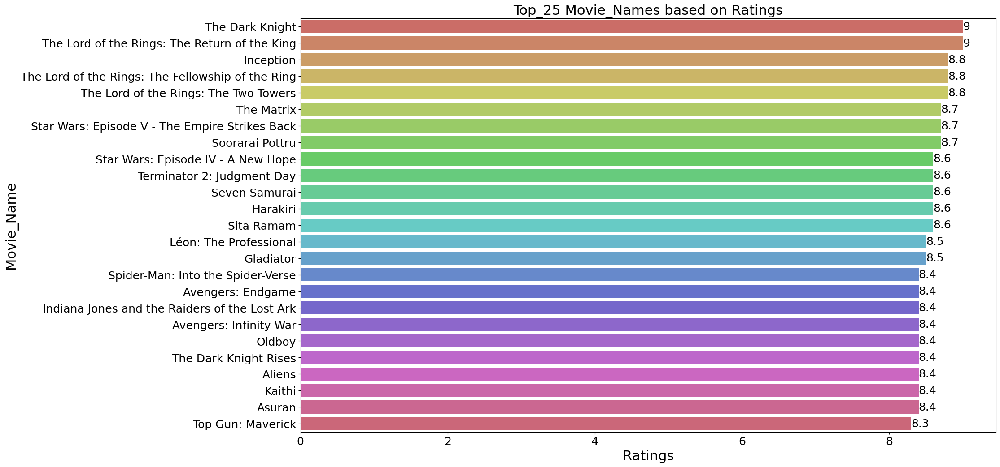

In [634]:
# Visualizing Top_25 Movie_Names Vs Ratings in barplot

tx = imdb.nlargest(25, 'Ratings')

plt.figure(figsize=(20,12))
rx = sns.barplot(data=tx, y ='Movie_Name', x ='Ratings', palette="hls")
plt.xlabel('Ratings',fontsize=22)
plt.xticks(fontsize=18)
plt.ylabel('Movie_Name',fontsize=22)
plt.yticks(fontsize=18)
plt.title("Top_25 Movie_Names based on Ratings",fontsize=22)

for i in rx.containers:
    rx.bar_label(i,fontsize=18)
    
plt.show()

### Observations

Above barplot shows the Top 25 movies with highest rating and below is the list of movies which has rating above 8.5

The Dark Knight - 9,
The Lord of the Rings: The Return of the King-9,
Inception-8.8,
The Lord of the Rings: The Fellowship of the Ring-8.8,
The Lord of the Rings: The Two Towers-8.8,
Soorarai Pottru-8.7,
Star Wars: Episode V - The Empire Strikes Back-8.7,
The Matrix-8.7,
Harakiri-8.6,
Seven Samurai-8.6,
Sita Ramam-8.6,
Star Wars: Episode IV - A New Hope-8.6,
Terminator 2: Judgment Day-8.6,
Gladiator-8.5 and
Léon: The Professional-8.5


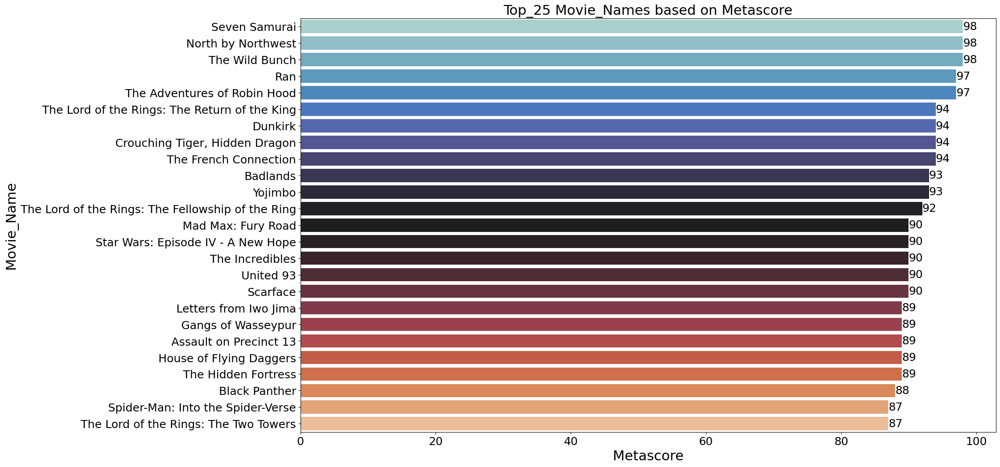

In [635]:
# Visualizing Top_25 Movie_Names Vs Metascore in barplot

tx = imdb.nlargest(25, 'Metascore')

plt.figure(figsize=(20,12))
rx = sns.barplot(data=tx, y ='Movie_Name', x ='Metascore', palette="icefire")
plt.xlabel('Metascore',fontsize=22)
plt.xticks(fontsize=18)
plt.ylabel('Movie_Name',fontsize=22)
plt.yticks(fontsize=18)
plt.title("Top_25 Movie_Names based on Metascore",fontsize=22)

for i in rx.containers:
    rx.bar_label(i,fontsize=18)
    
plt.show()

### Observations

Above barplot shows the Top 25 movies with highest metascores and below is the list of movies which has metascores above 90

North by Northwest - 98,
Seven Samurai -	98,
The Wild Bunch-	98,
Ran	-97,
The Adventures of Robin Hood-	97,
Crouching Tiger, Hidden Dragon-	94,
Dunkirk-	94,
The French Connection-	94,
The Lord of the Rings: The Return of the King-	94,
Badlands-	93,
Yojimbo-	93,
The Lord of the Rings: The Fellowship of the Ring-	92,
Mad Max: Fury Road-	90,
Scarface-	90,
Star Wars: Episode IV - A New Hope-	90,
The Incredibles-90 and
United 93-	90


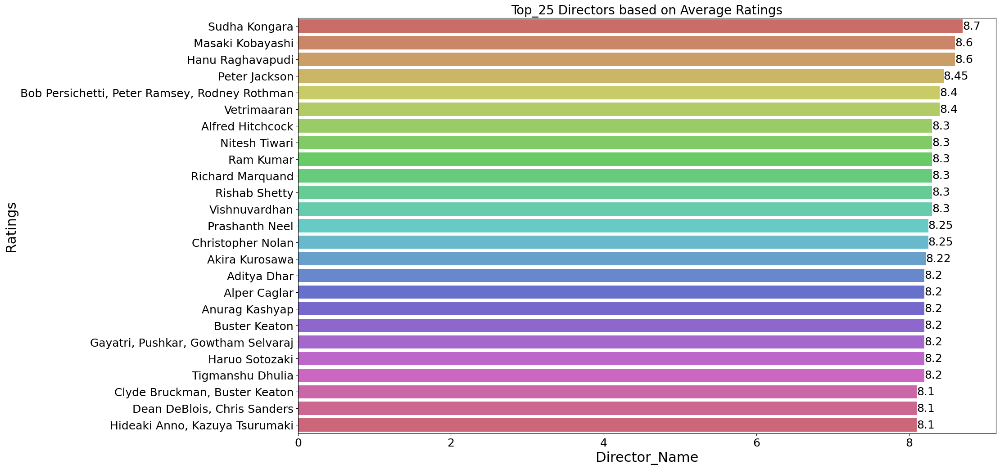

In [636]:
# Visualizing Top_25 Director Vs Ratings in barplot

tx = imdb.groupby('Director_Name')['Ratings'].mean().nlargest(25)
imdb_top_25 = tx.sort_values(ascending=False)

plt.figure(figsize=(20,12))
rx = sns.barplot(data=imdb_top_25.reset_index(), y ='Director_Name', x ='Ratings', palette="hls")
plt.xlabel('Director_Name',fontsize=22)
plt.xticks(fontsize=18)
plt.ylabel('Ratings',fontsize=22)
plt.yticks(fontsize=18)
plt.title("Top_25 Directors based on Average Ratings",fontsize=20)

for i in rx.containers:
    rx.bar_label(i,fontsize=18)
    
plt.show()

### Observations

Above barplot shows the Top_25 Directors based on Average Ratings and below is the list of Directors whose average movie ratings are above 8.3

Sudha Kongara	8.7,
Hanu Raghavapudi	8.6,
Masaki Kobayashi	8.6,
Peter Jackson	8.45,
Bob Persichetti, Peter Ramsey, Rodney Rothman	8.4,
Vetrimaaran	8.4,
Alfred Hitchcock	8.3,
Nitesh Tiwari	8.3,
Ram Kumar	8.3,
Richard Marquand	8.3,
Rishab Shetty	8.3 and
Vishnuvardhan	8.3


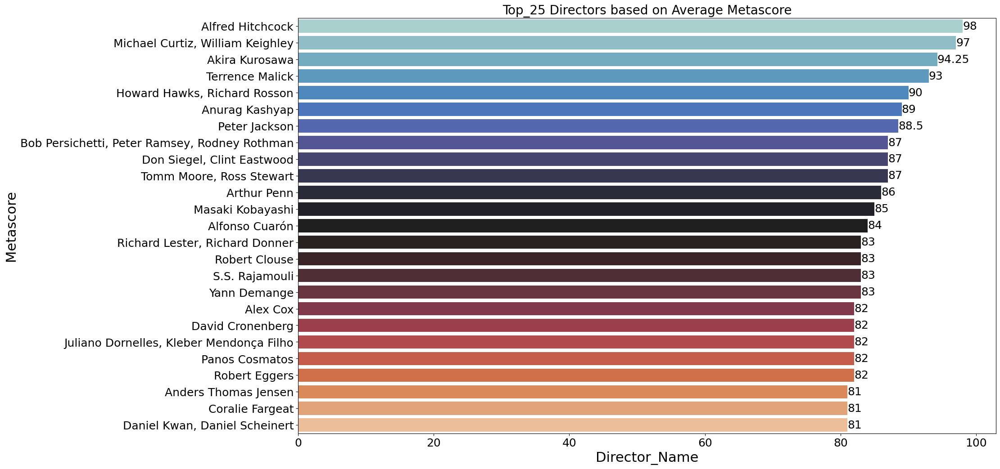

In [637]:
# Visualizing Top_25 Director Vs Metascore in barplot

tx = imdb.groupby('Director_Name')['Metascore'].mean().nlargest(25)
imdb_top_25 = tx.sort_values(ascending=False)


plt.figure(figsize=(20,12))
rx = sns.barplot(data=imdb_top_25.reset_index(), y ='Director_Name', x ='Metascore', palette="icefire")
plt.xlabel('Director_Name',fontsize=22)
plt.xticks(fontsize=18)
plt.ylabel('Metascore',fontsize=22)
plt.yticks(fontsize=18)
plt.title("Top_25 Directors based on Average Metascore",fontsize=20)

for i in rx.containers:
    rx.bar_label(i,fontsize=18)
    
plt.show()

### Observations

Above barplot shows the Top_25 Directors based on Average Metascore and below is the list of Directors whose average movie metascores are above 85

Alfred Hitchcock	98,
Michael Curtiz, William Keighley	97,
Akira Kurosawa	94.25,
Terrence Malick	93,
Howard Hawks, Richard Rosson	90,
Anurag Kashyap	89,
Peter Jackson	88.5,
Bob Persichetti, Peter Ramsey, Rodney Rothman	87,
Don Siegel, Clint Eastwood	87,
Tomm Moore, Ross Stewart	87,
Arthur Penn	86 and
Masaki Kobayashi	85


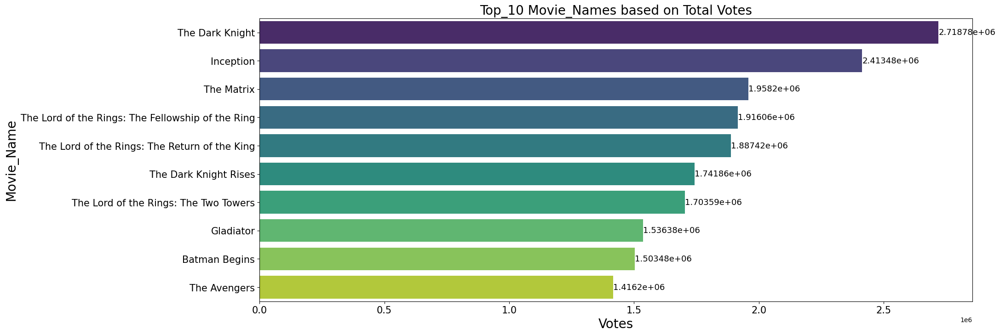

In [638]:
# Visualizing Top_10 Movie_Names Vs Total Votes in barplot

tx = imdb.groupby('Movie_Name')['Votes'].sum().nlargest(10)
imdb_top_10 = tx.sort_values(ascending=False)

plt.figure(figsize=(20,8))
rx = sns.barplot(data=imdb_top_10.reset_index(), y='Movie_Name', x='Votes', palette="viridis")
plt.xlabel('Votes',fontsize=20)
plt.xticks(fontsize=15)
plt.ylabel('Movie_Name',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Top_10 Movie_Names based on Total Votes",fontsize=20)

for i in rx.containers:
    rx.bar_label(i,fontsize=13)
    
plt.show()

### Observations

Top_10 Movie_Names based on Total Votes

The Dark Knight	2718780,
Inception	2413483,
The Matrix	1958202,
The Lord of the Rings: The Fellowship of the Ring	1916063,
The Lord of the Rings: The Return of the King	1887419,
The Dark Knight Rises	1741863,
The Lord of the Rings: The Two Towers	1703586,
Gladiator	1536379,
Batman Begins	1503482 and
The Avengers	1416204


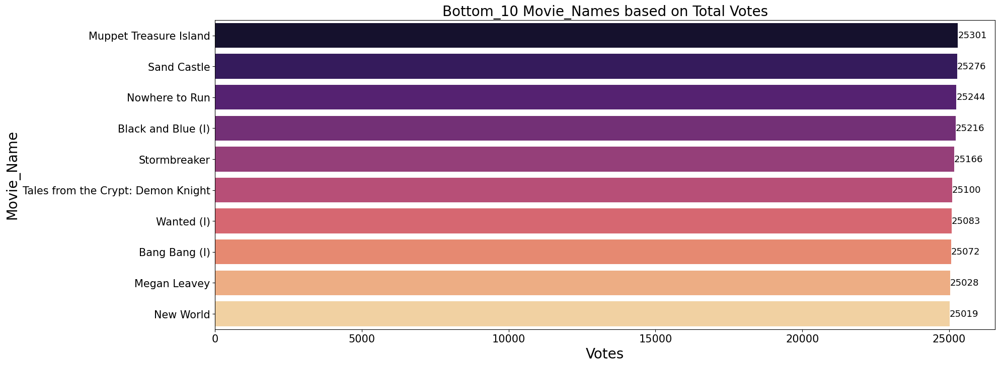

In [639]:
# Visualizing Bottom_10 Movie_Names Vs Total Votes in barplot


bx = imdb.groupby('Movie_Name')['Votes'].sum().nsmallest(10)
imdb_bottom_10 = bx.sort_values(ascending=False)


plt.figure(figsize=(20,8))
rx = sns.barplot(data=imdb_bottom_10.reset_index(), y='Movie_Name', x='Votes', palette="magma")
plt.xlabel('Votes',fontsize=20)
plt.xticks(fontsize=15)
plt.ylabel('Movie_Name',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Bottom_10 Movie_Names based on Total Votes",fontsize=20)

for i in rx.containers:
    rx.bar_label(i,fontsize=13)
    
plt.show()

### Observations

Bottom_10 Movie_Names based on Total Votes

Muppet Treasure Island	25301,
Sand Castle	25276,
Nowhere to Run	25244,
Black and Blue (I)	25216,
Stormbreaker	25166,
Tales from the Crypt: Demon Knight	25100,
Wanted (I)	25083,
Bang Bang (I)	25072,
Megan Leavey	25028 and
New World	25019


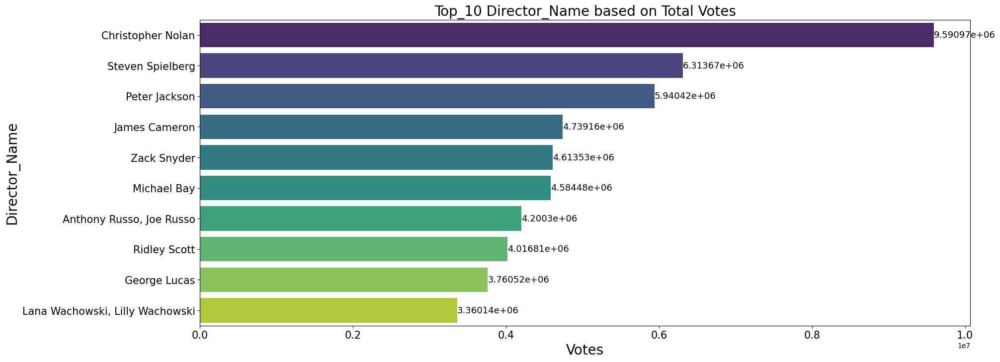

In [640]:
# Visualizing Top_10 Director_Name Vs Total Votes in barplot


tx = imdb.groupby('Director_Name')['Votes'].sum().nlargest(10)
imdb_top_10 = tx.sort_values(ascending=False)


plt.figure(figsize=(20,8))
rx = sns.barplot(data=imdb_top_10.reset_index(), y='Director_Name', x='Votes', palette="viridis")
plt.xlabel('Votes',fontsize=20)
plt.xticks(fontsize=15)
plt.ylabel('Director_Name',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Top_10 Director_Name based on Total Votes",fontsize=20)

for i in rx.containers:
    rx.bar_label(i,fontsize=13)
    
plt.show()

### Observations

Top_10 Director's Vs Total Votes

Based on Total Votes(sum), below is the list of top 10 directors with Total Votes in IMDB dataset

Christopher Nolan	9590971,
Steven Spielberg	6313667,
Peter Jackson	5940425,
James Cameron	4739159,
Zack Snyder	4613530,
Michael Bay	4584475,
Anthony Russo, Joe Russo	4200303,
Ridley Scott	4016811,
George Lucas	3760515 and
Lana Wachowski, Lilly Wachowski	3360142

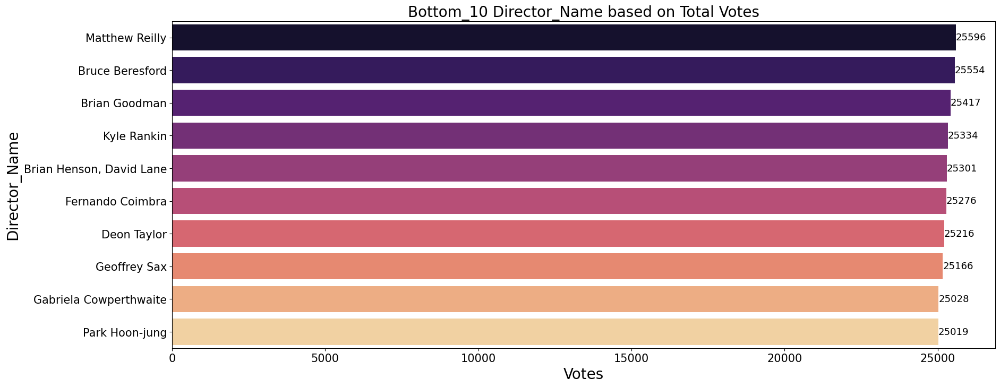

In [641]:
# Visualizing Bottom_10 Director_Name Vs Total Votes in barplot

bx = imdb.groupby('Director_Name')['Votes'].sum().nsmallest(10)
imdb_bottom_10 = bx.sort_values(ascending=False)


plt.figure(figsize=(20,8))
rx = sns.barplot(data=imdb_bottom_10.reset_index(), y='Director_Name', x='Votes', palette="magma")
plt.xlabel('Votes',fontsize=20)
plt.xticks(fontsize=15)
plt.ylabel('Director_Name',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Bottom_10 Director_Name based on Total Votes",fontsize=20)

for i in rx.containers:
    rx.bar_label(i,fontsize=13)
    
plt.show()

### Observations

Bottom_10 Director's Vs Total Votes

Based on Total Votes(sum), below is the list of bottom 10 directors with Total Votes in IMDB dataset

Matthew Reilly	25596,
Bruce Beresford	25554,
Brian Goodman	25417,
Kyle Rankin	25334,
Brian Henson, David Lane	25301,
Fernando Coimbra	25276,
Deon Taylor	25216,
Geoffrey Sax	25166,
Gabriela Cowperthwaite	25028 and
Park Hoon-jung	25019


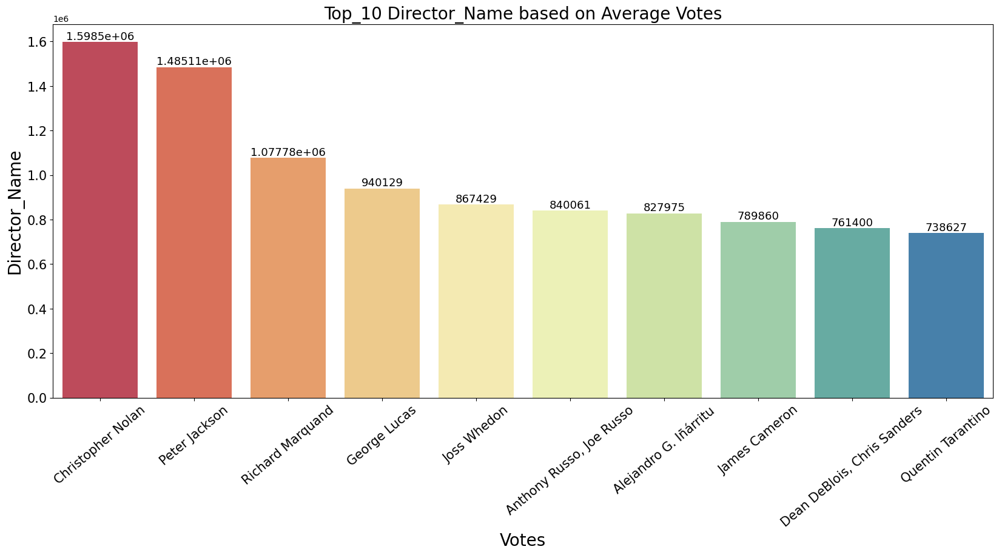

In [642]:
# Visualizing Top_10 Director_Name based on Average Votes in barplot

tx = imdb.groupby('Director_Name')['Votes'].mean().nlargest(10)
imdb_top_10 = tx.sort_values(ascending=False)


plt.figure(figsize=(20,8))
rx = sns.barplot(data=tx.reset_index(), x='Director_Name', y='Votes', palette="Spectral")
plt.xlabel('Votes',fontsize=20)
plt.xticks(fontsize=15,rotation=40)
plt.ylabel('Director_Name',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Top_10 Director_Name based on Average Votes",fontsize=20)

for i in rx.containers:
    rx.bar_label(i,fontsize=13)
    
plt.show()

### Observations

From above barplot we can observe, director's name based on their average votes

Below is the list of Top 10 Director's name with their average Votes for a movie

Christopher Nolan	1598495.16,
Peter Jackson	1485106.25,
Richard Marquand	1077776,
George Lucas	940128.75,
Joss Whedon	867429,
Anthony Russo, Joe Russo	840060.6,
Alejandro G. Iñárritu	827975,
James Cameron	789859.83,
Dean DeBlois, Chris Sanders	761400 and
Quentin Tarantino	738627.33


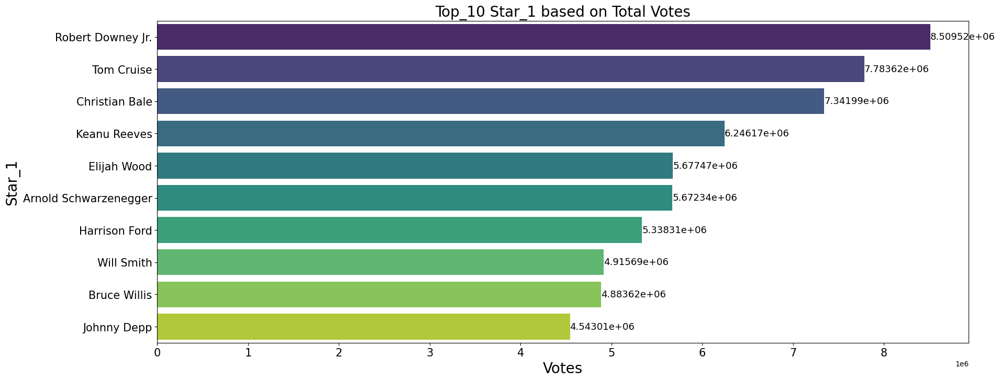

In [643]:
# Visualizing Top_10 Star_1 based on Total Votes in barplot


tx = imdb.groupby('Star_1')['Votes'].sum().nlargest(10)
imdb_top_10 = tx.sort_values(ascending=False)


plt.figure(figsize=(20,8))
rx = sns.barplot(data=imdb_top_10.reset_index(), y='Star_1', x='Votes', palette="viridis")
plt.xlabel('Votes',fontsize=20)
plt.xticks(fontsize=15)
plt.ylabel('Star_1',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Top_10 Star_1 based on Total Votes",fontsize=20)

for i in rx.containers:
     rx.bar_label(i,fontsize=13)
    
plt.show()

### Observations

Above barplot shows Top 10 Actors(Star_1) Vs Total Votes 

Below is the list of Top 10 Actors(Star_1) with their Total Votes in IMDB dataset

Robert Downey Jr.	8509523,
Tom Cruise	7783623,
Christian Bale	7341986,
Keanu Reeves	6246167,
Elijah Wood	5677466,
Arnold Schwarzenegger	5672342,
Harrison Ford	5338313,
Will Smith	4915686,
Bruce Willis	4883623 and
Johnny Depp	4543011

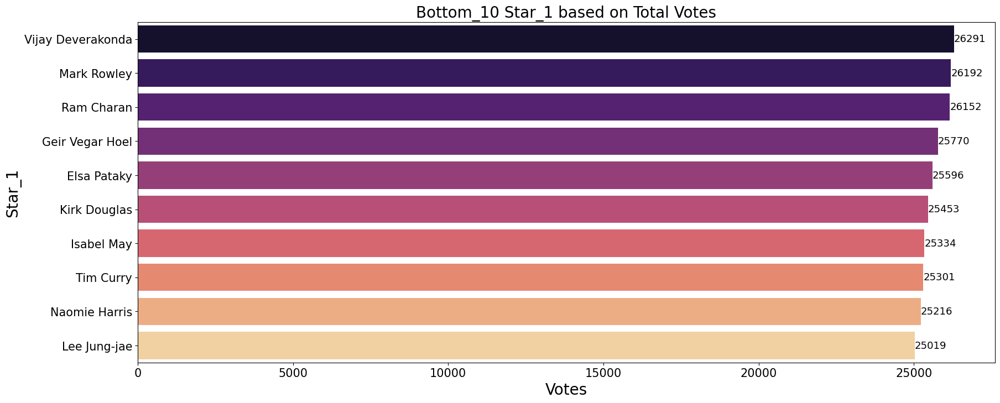

In [644]:
# Visualizing Bottom_10 Star_1 based on Total Votes in barplot

tx = imdb.groupby('Star_1')['Votes'].sum().nsmallest(10)
imdb_bottom_10 = tx.sort_values(ascending=False)


plt.figure(figsize=(20,8))
rx = sns.barplot(data=imdb_bottom_10.reset_index(), y='Star_1', x='Votes', palette="magma")
plt.xlabel('Votes',fontsize=20)
plt.xticks(fontsize=15)
plt.ylabel('Star_1',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Bottom_10 Star_1 based on Total Votes",fontsize=20)

for i in rx.containers:
    rx.bar_label(i,fontsize=13)
    
plt.show()

### Observations

Above barplot shows Bottom 10 Actors(Star_1) Vs Total Votes

Below is the list of Bottom 10 Actors(Star_1) with their Total Votes in IMDB dataset

Vijay Deverakonda	26291,
Mark Rowley	26192,
Ram Charan	26152,
Geir Vegar Hoel	25770,
Elsa Pataky	25596,
Kirk Douglas	25453,
Isabel May	25334,
Tim Curry	25301,
Naomie Harris	25216 and
Lee Jung-jae	25019

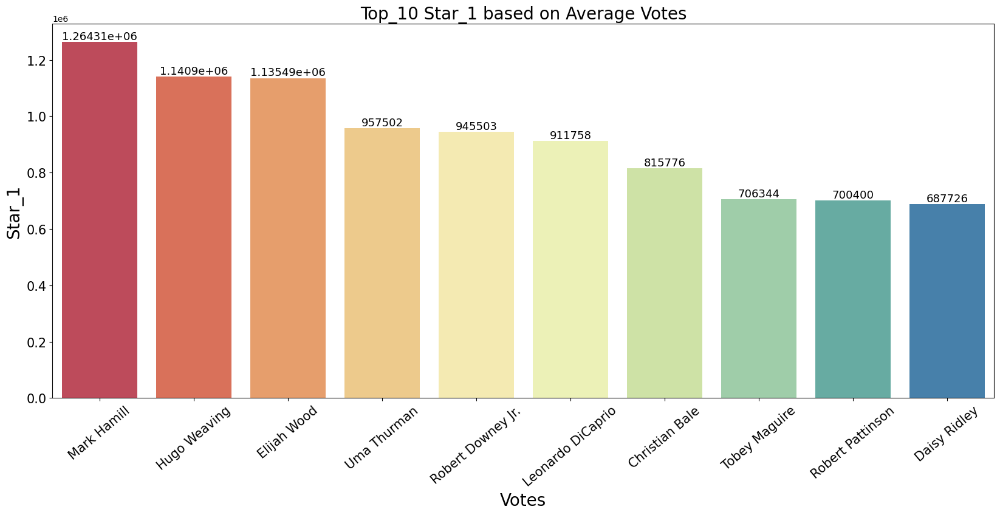

In [645]:
# Visualizing Top_10 Star_1 based on Average Votes in barplot

tx = imdb.groupby('Star_1')['Votes'].mean().nlargest(10)
imdb_top_10 = tx.sort_values(ascending=False)


plt.figure(figsize=(20,8))
rx = sns.barplot(data=tx.reset_index(), x='Star_1', y='Votes', palette="Spectral")
plt.xlabel('Votes',fontsize=20)
plt.xticks(fontsize=15,rotation=40)
plt.ylabel('Star_1',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Top_10 Star_1 based on Average Votes",fontsize=20)

for i in rx.containers:
    rx.bar_label(i,fontsize=13)
    
plt.show()

### Observations

Above barplot shows Top 10 Actors(Star_1) Vs Average Votes

Below is the list of Top 10 Actors(Star_1) with their Average Votes

Mark Hamill	1264307,
Hugo Weaving	1140899,
Elijah Wood	1135493.2,
Uma Thurman	957502.5,
Robert Downey Jr.	945502.5,
Leonardo DiCaprio	911758.5,
Christian Bale	815776.2,
Tobey Maguire	706344.3,
Robert Pattinson	700400 and
Daisy Ridley	687726


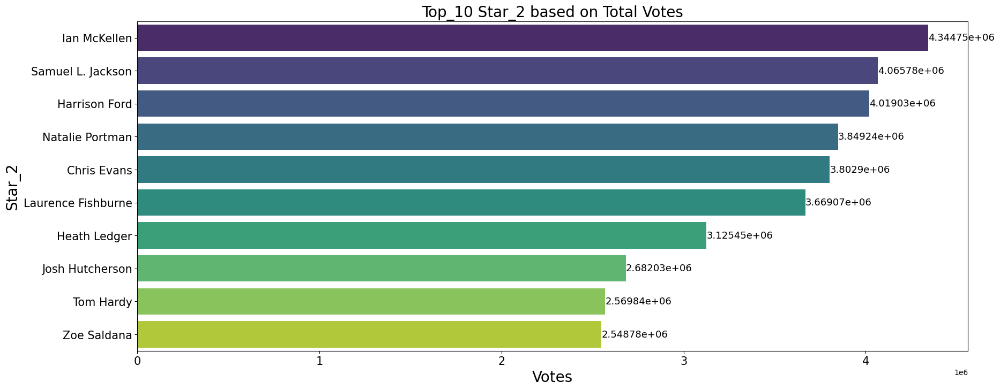

In [646]:
# Visualizing Top_10 Star_2 based on Total Votes in barplot


tx = imdb.groupby('Star_2')['Votes'].sum().nlargest(10)
imdb_top_10 = tx.sort_values(ascending=False)


plt.figure(figsize=(20,8))
rx = sns.barplot(data=imdb_top_10.reset_index(), y='Star_2', x='Votes', palette="viridis")
plt.xlabel('Votes',fontsize=20)
plt.xticks(fontsize=15)
plt.ylabel('Star_2',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Top_10 Star_2 based on Total Votes",fontsize=20)

for i in rx.containers:
     rx.bar_label(i,fontsize=13)
    
plt.show()

### Observations

Above barplot shows Top 10 Actors(Star_2) Vs Total Votes

Below is the list of Top 10 Actors(Star_2) with their Total Votes

Ian McKellen	4344747,
Samuel L. Jackson	4065779,
Harrison Ford	4019033,
Natalie Portman	3849236,
Chris Evans	3802898,
Laurence Fishburne	3669072,
Heath Ledger	3125451,
Josh Hutcherson	2682032,
Tom Hardy	2569838 and
Zoe Saldana	2548784

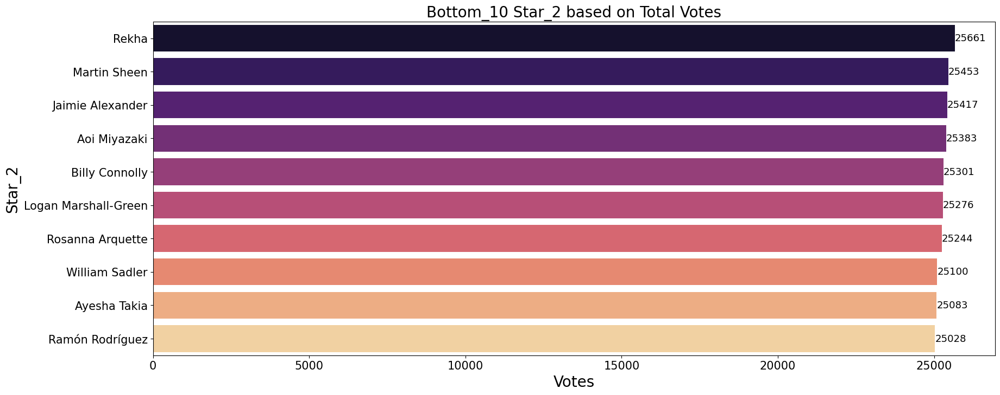

In [647]:
# Visualizing Bottom_10 Star_2 based on Total Votes in barplot

tx = imdb.groupby('Star_2')['Votes'].sum().nsmallest(10)
imdb_bottom_10 = tx.sort_values(ascending=False)


plt.figure(figsize=(20,8))
rx = sns.barplot(data=imdb_bottom_10.reset_index(), y='Star_2', x='Votes', palette="magma")
plt.xlabel('Votes',fontsize=20)
plt.xticks(fontsize=15)
plt.ylabel('Star_2',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Bottom_10 Star_2 based on Total Votes",fontsize=20)

for i in rx.containers:
    rx.bar_label(i,fontsize=13)
    
plt.show()

### Observations

Above barplot is to display bottom 10 Actors(Star_2) Vs Total Votes

Below is the list of bottom 10 Actors(Star_2) with their Total Votes

Rekha	25661,
Martin Sheen	25453,
Jaimie Alexander	25417,
Aoi Miyazaki	25383,
Billy Connolly	25301,
Logan Marshall-Green	25276,
Rosanna Arquette	25244,
William Sadler	25100,
Ayesha Takia	25083 and
Ramón Rodríguez	25028


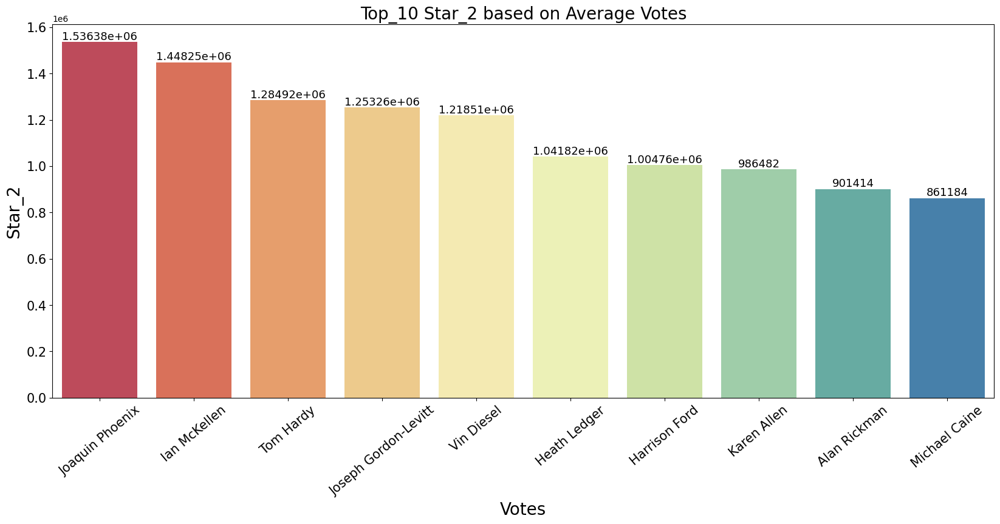

In [648]:
# Visualizing Top_10 Star_2 based on Average Votes in barplot

tx = imdb.groupby('Star_2')['Votes'].mean().nlargest(10)
imdb_top_10 = tx.sort_values(ascending=False)


plt.figure(figsize=(20,8))
rx = sns.barplot(data=tx.reset_index(), x='Star_2', y='Votes', palette="Spectral")
plt.xlabel('Votes',fontsize=20)
plt.xticks(fontsize=15,rotation=40)
plt.ylabel('Star_2',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Top_10 Star_2 based on Average Votes",fontsize=20)

for i in rx.containers:
    rx.bar_label(i,fontsize=13)
    
plt.show()

### Observations

Above barplot is to display Top 10 Actors(Star_2) Vs Average Votes

Below is the list of Top 10 Actors(Star_2) with their Average Votes

Joaquin Phoenix	1536379,
Ian McKellen	1448249,
Tom Hardy	1284919,
Joseph Gordon-Levitt	1253263.5,
Vin Diesel	1218508,
Heath Ledger	1041817,
Harrison Ford	1004758.25,
Karen Allen	986482,
Alan Rickman	901414 and
Michael Caine	861184.5

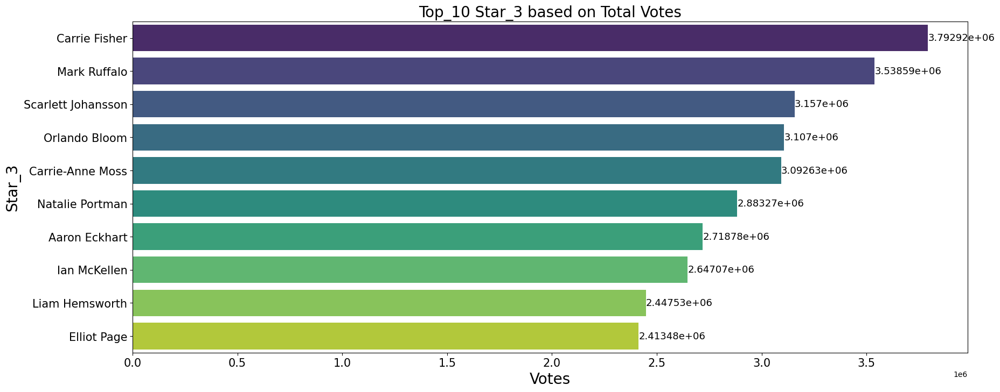

In [649]:
# Visualizing Top_10 Star_3 based on Total Votes in barplot


tx = imdb.groupby('Star_3')['Votes'].sum().nlargest(10)
imdb_top_10 = tx.sort_values(ascending=False)


plt.figure(figsize=(20,8))
rx = sns.barplot(data=imdb_top_10.reset_index(), y='Star_3', x='Votes', palette="viridis")
plt.xlabel('Votes',fontsize=20)
plt.xticks(fontsize=15)
plt.ylabel('Star_3',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Top_10 Star_3 based on Total Votes",fontsize=20)

for i in rx.containers:
     rx.bar_label(i,fontsize=13)
    
plt.show()

### Observations

From above barplot, we can observe Top 10 actors(star_3) based on the Total Votes in IMDB dataset

Carrie Fisher	3792921,
Mark Ruffalo	3538591,
Scarlett Johansson	3156999,
Orlando Bloom	3106996,
Carrie-Anne Moss	3092632,
Natalie Portman	2883267,
Aaron Eckhart	2718780,
Ian McKellen	2647072,
Liam Hemsworth	2447533 and
Elliot Page	2413483


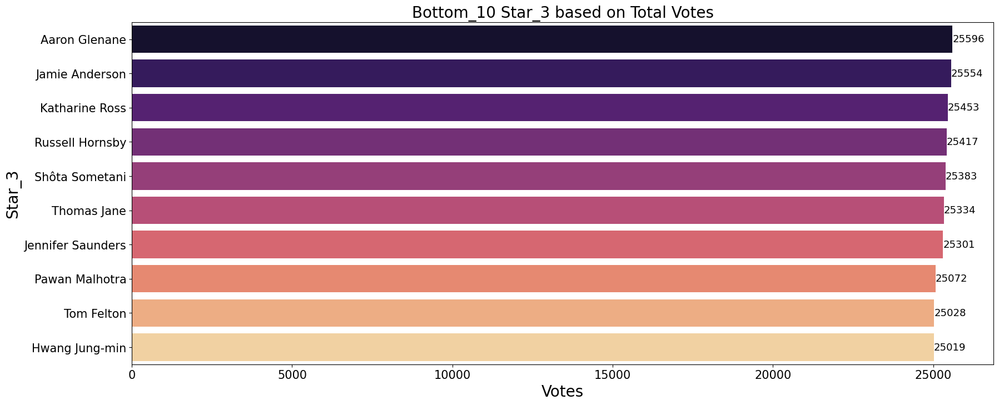

In [650]:
# Visualizing Bottom_10 Star_3 based on Total Votes in barplot

tx = imdb.groupby('Star_3')['Votes'].sum().nsmallest(10)
imdb_bottom_10 = tx.sort_values(ascending=False)


plt.figure(figsize=(20,8))
rx = sns.barplot(data=imdb_bottom_10.reset_index(), y='Star_3', x='Votes', palette="magma")
plt.xlabel('Votes',fontsize=20)
plt.xticks(fontsize=15)
plt.ylabel('Star_3',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Bottom_10 Star_3 based on Total Votes",fontsize=20)

for i in rx.containers:
    rx.bar_label(i,fontsize=13)
    
plt.show()

### Observations

Below is the list of Bottom 10 actors(star_3) based on the Total Votes

Aaron Glenane	25596,
Jamie Anderson	25554,
Katharine Ross	25453,
Russell Hornsby	25417,
Shôta Sometani	25383,
Thomas Jane	25334,
Jennifer Saunders	25301,
Pawan Malhotra	25072,
Tom Felton	25028 and
Hwang Jung-min	25019


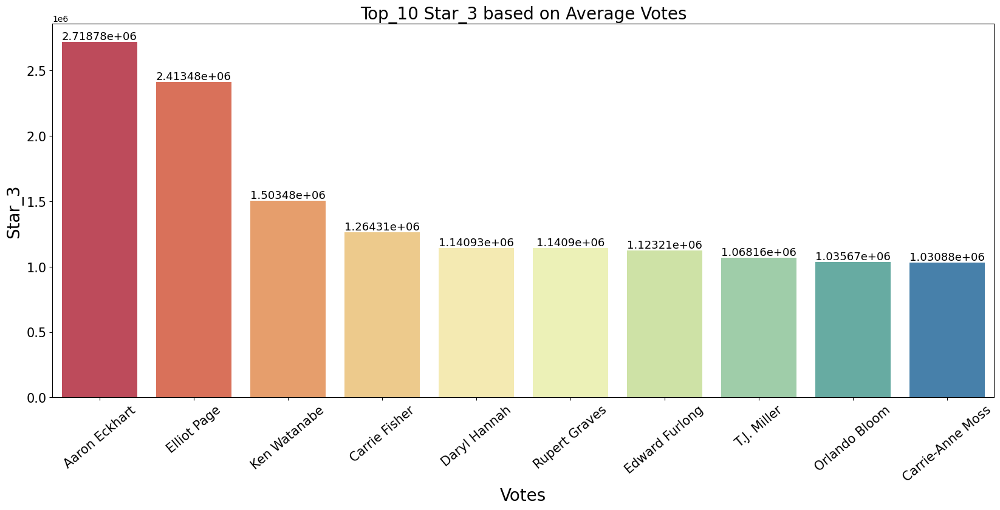

In [651]:
# Visualizing Top_10 Star_3 based on Average Votes in barplot

tx = imdb.groupby('Star_3')['Votes'].mean().nlargest(10)
imdb_top_10 = tx.sort_values(ascending=False)


plt.figure(figsize=(20,8))
rx = sns.barplot(data=tx.reset_index(), x='Star_3', y='Votes', palette="Spectral")
plt.xlabel('Votes',fontsize=20)
plt.xticks(fontsize=15,rotation=40)
plt.ylabel('Star_3',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Top_10 Star_3 based on Average Votes",fontsize=20)

for i in rx.containers:
    rx.bar_label(i,fontsize=13)
    
plt.show()

### Observations

Below is the list of Top 10 actors(star_3) based on the Average Votes from above barplot

Aaron Eckhart	2718780,
Elliot Page	2413483,
Ken Watanabe	1503482,
Carrie Fisher	1264307,
Daryl Hannah	1140927,
Rupert Graves	1140899,
Edward Furlong	1123206,
T.J. Miller	1068156,
Orlando Bloom	1035665.33 and
Carrie-Anne Moss	1030877.33


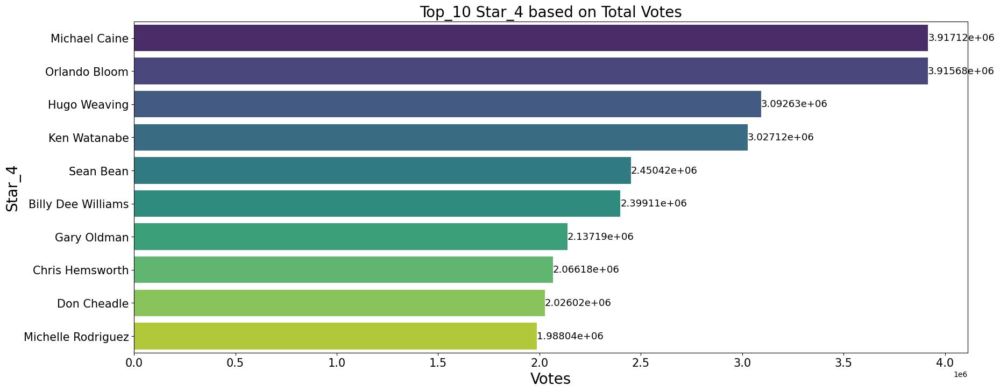

In [652]:
# Visualizing Top_10 Star_4 based on Total Votes in barplot


tx = imdb.groupby('Star_4')['Votes'].sum().nlargest(10)
imdb_top_10 = tx.sort_values(ascending=False)


plt.figure(figsize=(20,8))
rx = sns.barplot(data=imdb_top_10.reset_index(), y='Star_4', x='Votes', palette="viridis")
plt.xlabel('Votes',fontsize=20)
plt.xticks(fontsize=15)
plt.ylabel('Star_4',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Top_10 Star_4 based on Total Votes",fontsize=20)

for i in rx.containers:
     rx.bar_label(i,fontsize=13)
    
plt.show()

### Observations

Below is the list of Top 10 actors(star_4) based on the Total Votes from above barplot

Michael Caine	3917119,
Orlando Bloom	3915683,
Hugo Weaving	3092632,
Ken Watanabe	3027123,
Sean Bean	2450421,
Billy Dee Williams	2399111,
Gary Oldman	2137192,
Chris Hemsworth	2066176,
Don Cheadle	2026021 and
Michelle Rodriguez	1988037

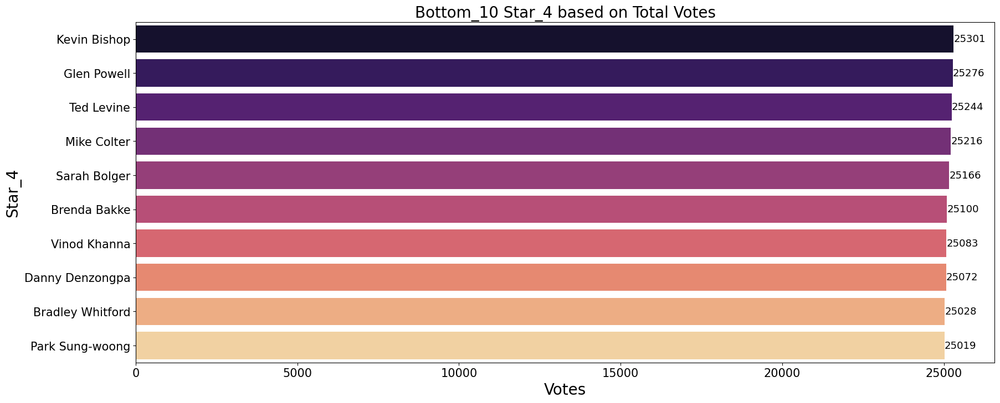

In [653]:
# Visualizing Bottom_10 Star_4 based on Total Votes in barplot

tx = imdb.groupby('Star_4')['Votes'].sum().nsmallest(10)
imdb_bottom_10 = tx.sort_values(ascending=False)


plt.figure(figsize=(20,8))
rx = sns.barplot(data=imdb_bottom_10.reset_index(), y='Star_4', x='Votes', palette="magma")
plt.xlabel('Votes',fontsize=20)
plt.xticks(fontsize=15)
plt.ylabel('Star_4',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Bottom_10 Star_4 based on Total Votes",fontsize=20)

for i in rx.containers:
    rx.bar_label(i,fontsize=13)
    
plt.show()

### Observations

Below is the list of Bottom 10 actors(star_4) based on the Total Votes from above barplot

Kevin Bishop	25301,
Glen Powell	25276,
Ted Levine	25244,
Mike Colter	25216,
Sarah Bolger	25166,
Brenda Bakke	25100,
Vinod Khanna	25083,
Danny Denzongpa	25072,
Bradley Whitford	25028 and
Park Sung-woong	25019


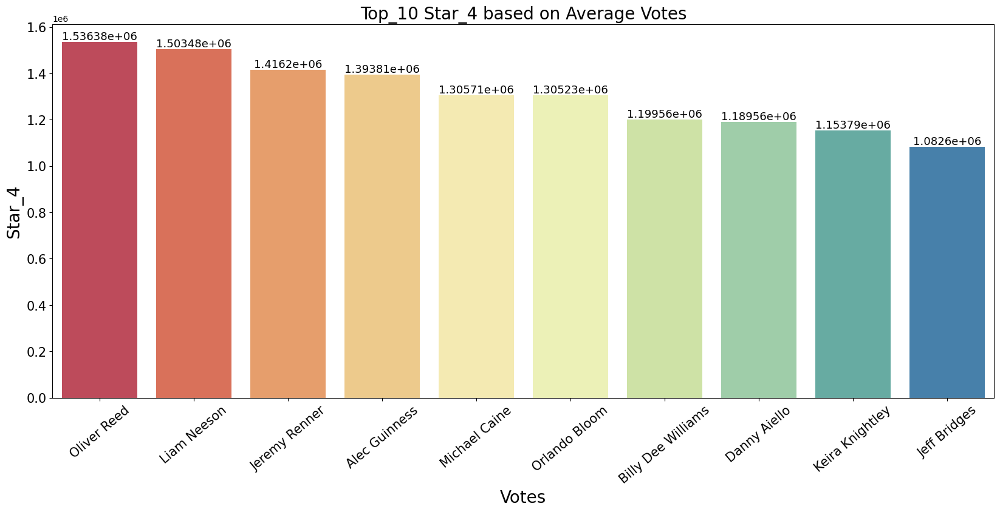

In [654]:
# Visualizing Top_10 Star_4 based on Average Votes in barplot

tx = imdb.groupby('Star_4')['Votes'].mean().nlargest(10)
imdb_top_10 = tx.sort_values(ascending=False)


plt.figure(figsize=(20,8))
rx = sns.barplot(data=tx.reset_index(), x='Star_4', y='Votes', palette="Spectral")
plt.xlabel('Votes',fontsize=20)
plt.xticks(fontsize=15,rotation=40)
plt.ylabel('Star_4',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Top_10 Star_4 based on Average Votes",fontsize=20)

for i in rx.containers:
    rx.bar_label(i,fontsize=13)
    
plt.show()

### Observations

Below is the list of Top 10 actors(star_4) based on the Average Votes from above barplot

Oliver Reed	1536379,
Liam Neeson	1503482,
Jeremy Renner	1416204,
Alec Guinness	1393810,
Michael Caine	1305706.33,
Orlando Bloom	1305227.66,
Billy Dee Williams	1199555.5,
Danny Aiello	1189563, 
Keira Knightley	1153789 and
Jeff Bridges	1082596


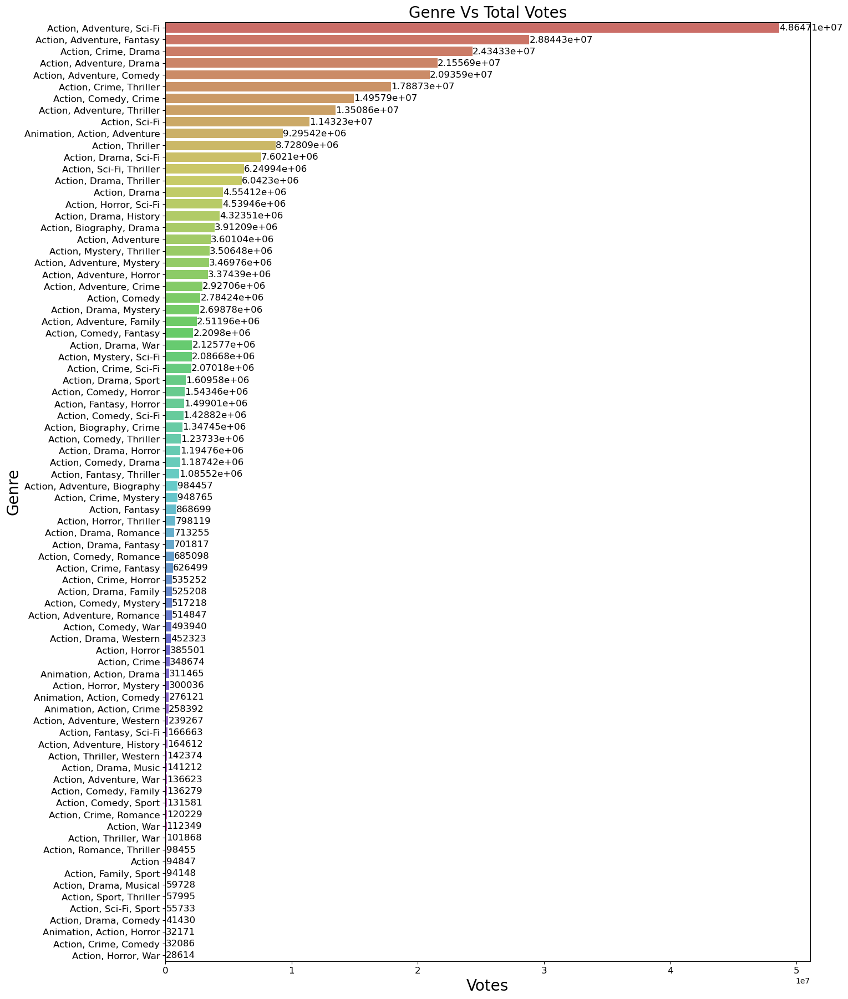

In [655]:
# Visualizing Genre Vs Total Votes in barplot

tx = imdb.groupby('Genre')['Votes'].sum().sort_values(ascending=False)

plt.figure(figsize=(15,22))
rx = sns.barplot(data=tx.reset_index(), y='Genre', x='Votes', palette="hls")
plt.xlabel('Votes',fontsize=20)
plt.xticks(fontsize=12)
plt.ylabel('Genre',fontsize=20)
plt.yticks(fontsize=12)
plt.title("Genre Vs Total Votes",fontsize=20)

for i in rx.containers:
     rx.bar_label(i,fontsize=12)
    
plt.show()

### Observations

Above barplot displays the list of Genre's based on Total Votes from movies and below is the Top 10 list of Genre's

Action, Adventure, Sci-Fi	48647134,
Action, Adventure, Fantasy	28844278,
Action, Crime, Drama	24343256,
Action, Adventure, Drama	21556938,
Action, Adventure, Comedy	20935914,
Action, Crime, Thriller	17887311,
Action, Comedy, Crime	14957865,
Action, Adventure, Thriller	13508621,
Action, Sci-Fi	11432275 and
Animation, Action, Adventure	9295415


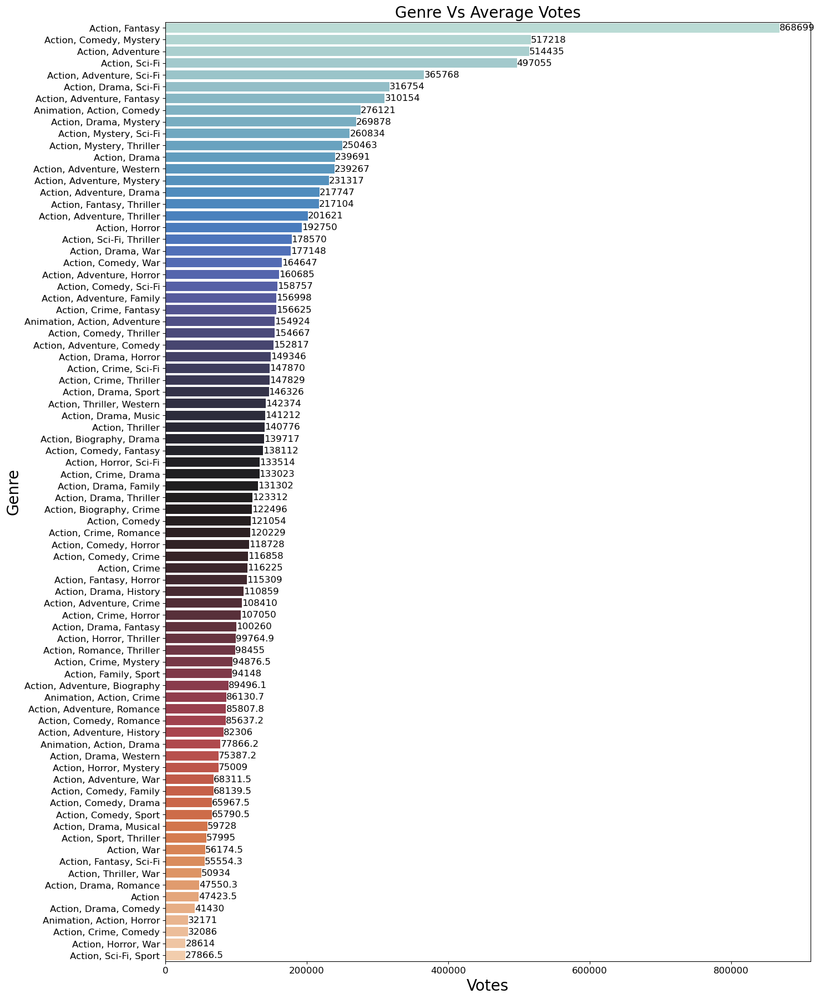

In [656]:
# Visualizing Genre Vs Average Votes in barplot

tx = imdb.groupby('Genre')['Votes'].mean().sort_values(ascending=False)

plt.figure(figsize=(15,22))
rx = sns.barplot(data=tx.reset_index(), y='Genre', x='Votes', palette="icefire")
plt.xlabel('Votes',fontsize=20)
plt.xticks(fontsize=12)
plt.ylabel('Genre',fontsize=20)
plt.yticks(fontsize=12)
plt.title("Genre Vs Average Votes",fontsize=20)

for i in rx.containers:
     rx.bar_label(i,fontsize=12)
    
plt.show()

### Observations

Above barplot displays the list of Genre's based on Average Votes from movies and below is the Top 10 list of Genre's

Action, Fantasy	868699,
Action, Comedy, Mystery	517218,
Action, Adventure	514434.714285714,
Action, Sci-Fi	497055.434782609,
Action, Adventure, Sci-Fi	365767.92481203,
Action, Drama, Sci-Fi	316754.208333333,
Action, Adventure, Fantasy	310153.52688172,
Animation, Action, Comedy	276121,
Action, Drama, Mystery	269877.8 and
Action, Mystery, Sci-Fi	260834.375


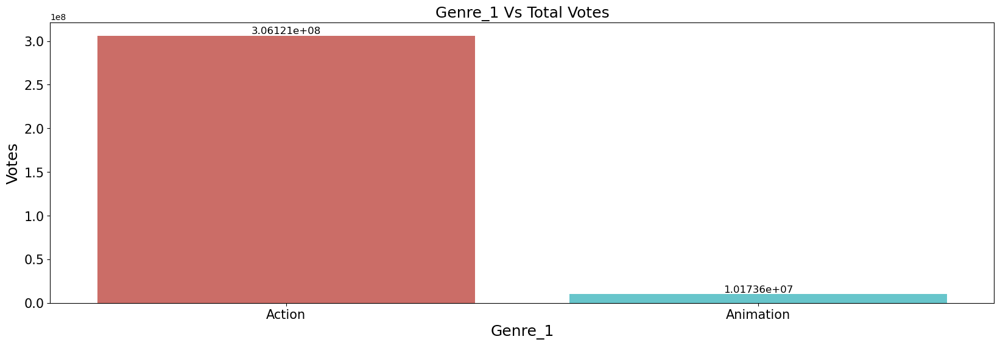

In [657]:
# Visualizing Genre_1 Vs Total Votes in barplot

tx = imdb.groupby('Genre_1')['Votes'].sum().sort_values(ascending=False)


plt.figure(figsize=(20,6))
rx = sns.barplot(data=tx.reset_index(), x='Genre_1', y='Votes', palette="hls")
plt.xlabel('Genre_1',fontsize=18)
plt.xticks(fontsize=15)
plt.ylabel('Votes',fontsize=18)
plt.yticks(fontsize=15)
plt.title("Genre_1 Vs Total Votes",fontsize=18)

for i in rx.containers:
     rx.bar_label(i,fontsize=12)
    
plt.show()

### Observations

Below is the split for Genre_1 based on Total Votes

Action	306120504

Animation	10173564

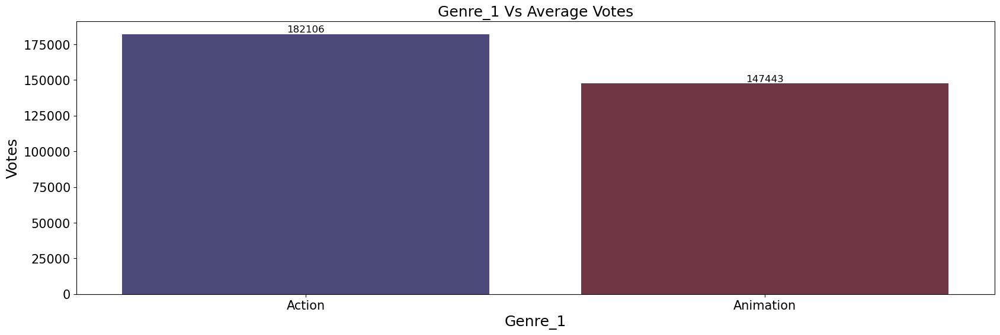

In [658]:
# Visualizing Genre_1 Vs Average Votes in barplot

tx = imdb.groupby('Genre_1')['Votes'].mean().sort_values(ascending=False)


plt.figure(figsize=(20,6))
rx = sns.barplot(data=tx.reset_index(), x='Genre_1', y='Votes', palette="icefire")
plt.xlabel('Genre_1',fontsize=18)
plt.xticks(fontsize=15)
plt.ylabel('Votes',fontsize=18)
plt.yticks(fontsize=15)
plt.title("Genre_1 Vs Average Votes",fontsize=18)

for i in rx.containers:
     rx.bar_label(i,fontsize=12)
    
plt.show()

### Observations

Below is the split for Genre_1 based on Average Votes

Action	182106.18

Animation	147442.95

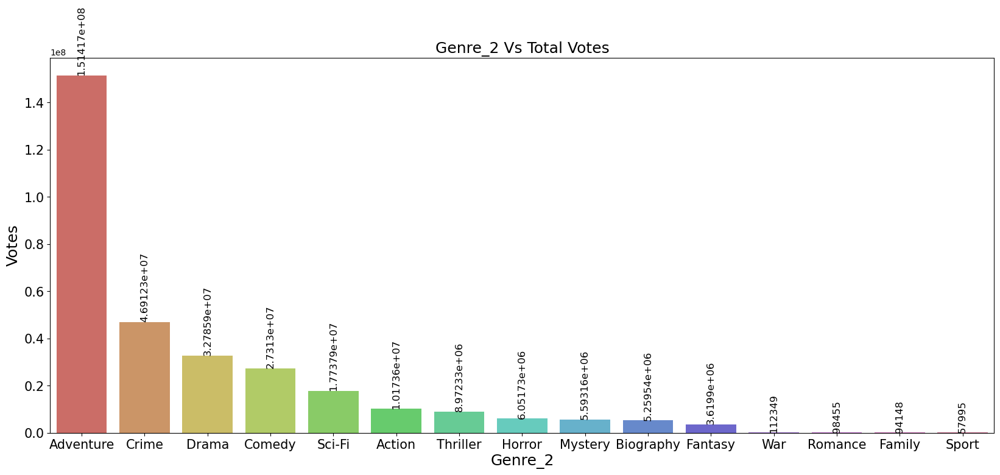

In [659]:
# Visualizing Genre_2 Vs Total Votes in barplot

tx = imdb.groupby('Genre_2')['Votes'].sum().sort_values(ascending=False)


plt.figure(figsize=(20,8))
rx = sns.barplot(data=tx.reset_index(), x='Genre_2', y='Votes', palette="hls")
plt.xlabel('Genre_2',fontsize=18)
plt.xticks(fontsize=15)
plt.ylabel('Votes',fontsize=18)
plt.yticks(fontsize=15)
plt.title("Genre_2 Vs Total Votes",fontsize=18)

for i in rx.containers:
     rx.bar_label(i,fontsize=12,rotation=90)
    
plt.show()

### Observations

From above barplot we can observe Adventure(Genre_2) got more number of Votes in IMDB dataset

Below is list of Top 5 Genre_2 based on Total Votes

Adventure	151416897

Crime	46912257

Drama	32785911

Comedy	27313048

Sci-Fi	17737946

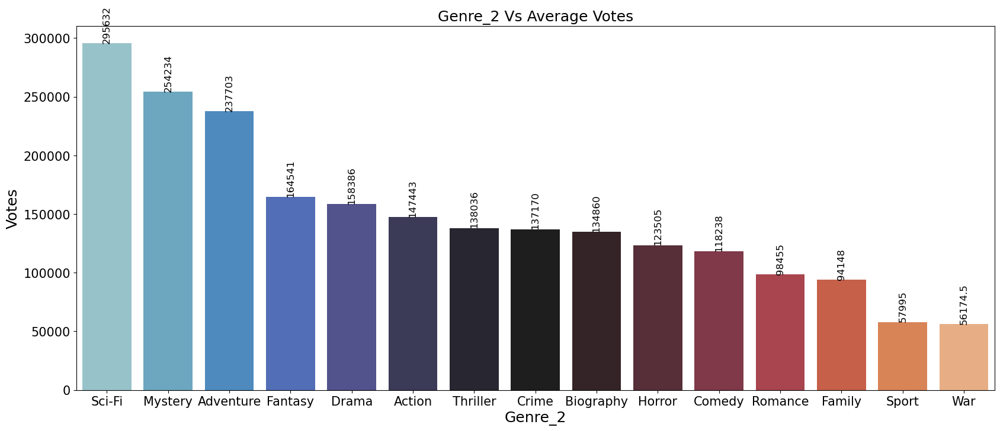

In [660]:
# Visualizing Genre_2 Vs Average Votes in barplot

tx = imdb.groupby('Genre_2')['Votes'].mean().sort_values(ascending=False)


plt.figure(figsize=(20,8))
rx = sns.barplot(data=tx.reset_index(), x='Genre_2', y='Votes', palette="icefire")
plt.xlabel('Genre_2',fontsize=18)
plt.xticks(fontsize=15)
plt.ylabel('Votes',fontsize=18)
plt.yticks(fontsize=15)
plt.title("Genre_2 Vs Average Votes",fontsize=18)

for i in rx.containers:
     rx.bar_label(i,fontsize=12,rotation=90)
    
plt.show()

### Observations

From above barplot we can observe Sci-Fi(Genre_2) got the maximum Average Votes in IMDB dataset

Below is list of Top 5 Genre_2 based on Average Votes

Sci-Fi	295632.43

Mystery	254234.31

Adventure	237703.13

Fantasy	164540.72

Drama	158386.04

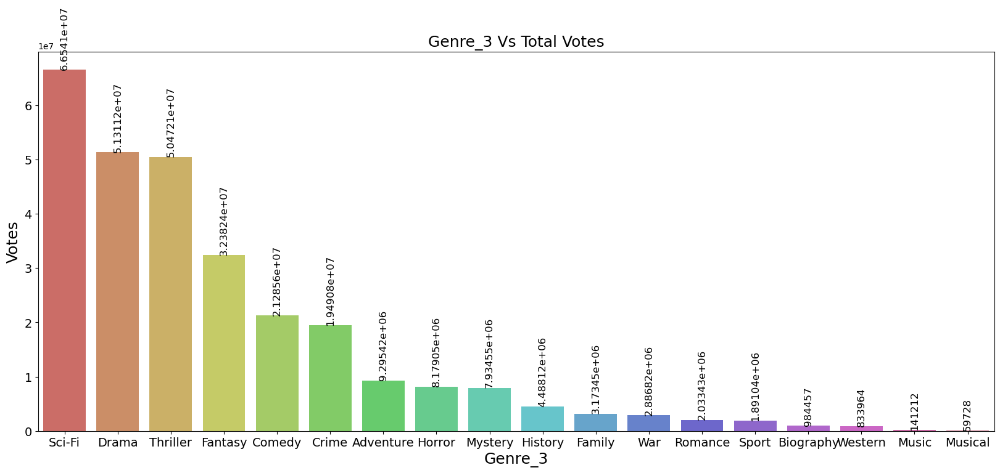

In [661]:
# Visualizing Genre_3 Vs Total Votes in barplot

tx = imdb.groupby('Genre_3')['Votes'].sum().sort_values(ascending=False)


plt.figure(figsize=(20,8))
rx = sns.barplot(data=tx.reset_index(), x='Genre_3', y='Votes', palette="hls")
plt.xlabel('Genre_3',fontsize=18)
plt.xticks(fontsize=14)
plt.ylabel('Votes',fontsize=18)
plt.yticks(fontsize=14)
plt.title("Genre_3 Vs Total Votes",fontsize=18)

for i in rx.containers:
     rx.bar_label(i,fontsize=12,rotation=90)
    
plt.show()

### Observations

From above barplot we can observe Sci-Fi(Genre_3) got more number of Votes in IMDB dataset

Below is list of Top 5 Genre_3 based on Total Votes

Sci-Fi	66541034

Drama	51311160

Thriller	50472079

Fantasy	32382389

Comedy	21285551


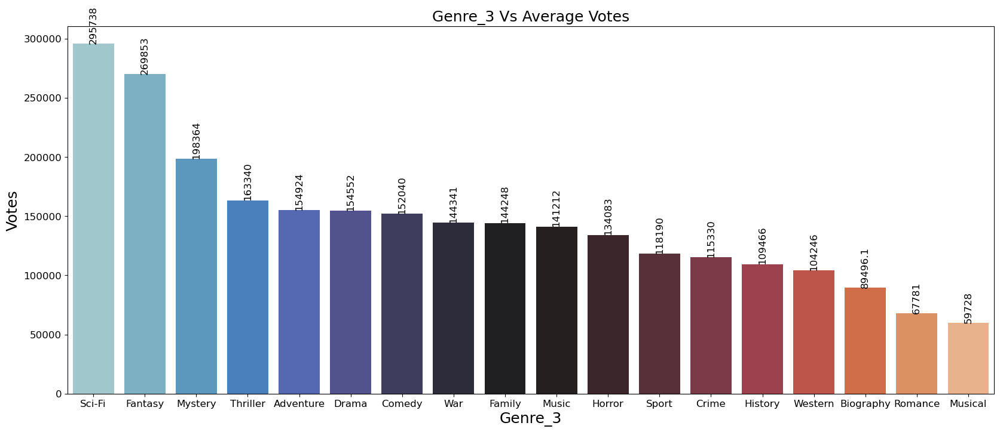

In [662]:
# Visualizing Genre_3 Vs Average Votes in barplot

tx = imdb.groupby('Genre_3')['Votes'].mean().sort_values(ascending=False)


plt.figure(figsize=(20,8))
rx = sns.barplot(data=tx.reset_index(), x='Genre_3', y='Votes', palette="icefire")
plt.xlabel('Genre_3',fontsize=18)
plt.xticks(fontsize=12)
plt.ylabel('Votes',fontsize=18)
plt.yticks(fontsize=12)
plt.title("Genre_3 Vs Average Votes",fontsize=18)

for i in rx.containers:
     rx.bar_label(i,fontsize=12,rotation=90)
    
plt.show()

### Observations

From above barplot we can observe Sci-Fi(Genre_3) got the maximum Average Votes in IMDB dataset

Below is list of Top 5 Genre_3 based on Average Votes

Sci-Fi	295737.92

Fantasy	269853.24

Mystery	198363.80

Thriller	163340.06

Adventure	154923.58


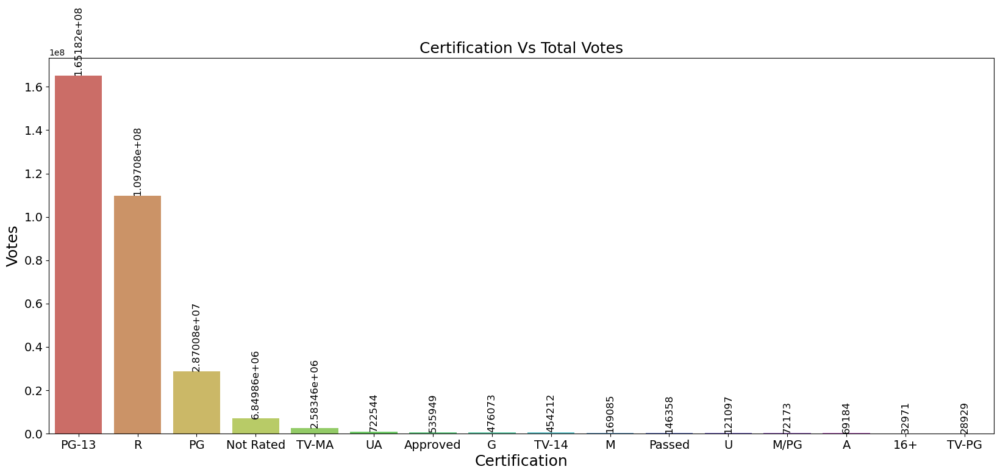

In [663]:
# Visualizing Certification Vs Total Votes in barplot

tx = imdb.groupby('Certification')['Votes'].sum().sort_values(ascending=False)


plt.figure(figsize=(20,8))
rx = sns.barplot(data=tx.reset_index(), x='Certification', y='Votes', palette="hls")
plt.xlabel('Certification',fontsize=18)
plt.xticks(fontsize=14)
plt.ylabel('Votes',fontsize=18)
plt.yticks(fontsize=14)
plt.title("Certification Vs Total Votes",fontsize=18)

for i in rx.containers:
     rx.bar_label(i,fontsize=12,rotation=90)
    
plt.show()

### Observations

From above barplot, 85% of the Total Votes in the IMDB dataset are for movies certified with PG-13 and R

Below is the Top 3 Movie Certification list with Total Votes

PG-13 - 165182407

R - 109708475

PG - 28700846


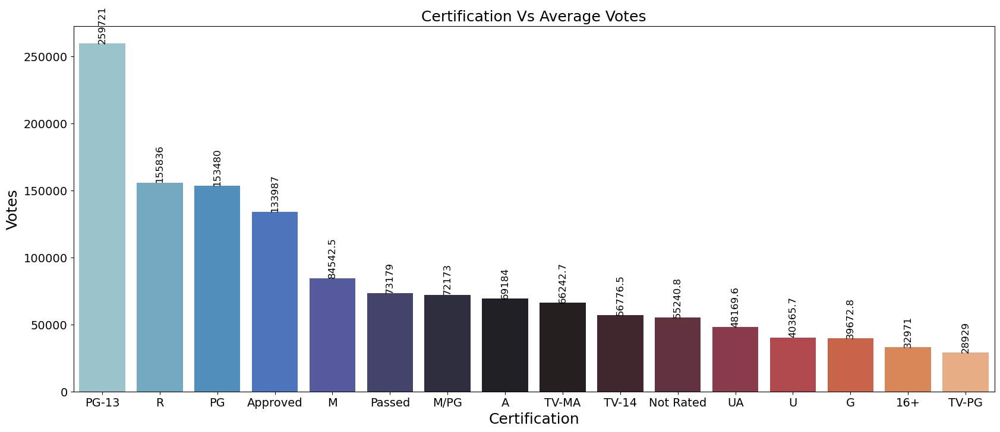

In [664]:
# Visualizing Certification Vs Average Votes in barplot

tx = imdb.groupby('Certification')['Votes'].mean().sort_values(ascending=False)


plt.figure(figsize=(20,8))
rx = sns.barplot(data=tx.reset_index(), x='Certification', y='Votes', palette="icefire")
plt.xlabel('Certification',fontsize=18)
plt.xticks(fontsize=14)
plt.ylabel('Votes',fontsize=18)
plt.yticks(fontsize=14)
plt.title("Certification Vs Average Votes",fontsize=18)

for i in rx.containers:
     rx.bar_label(i,fontsize=12,rotation=90)
    
plt.show()

### Observations

Based on Average Votes, PG -13 got the maximum average followed by R and PG

Below is the Top 3 Movie Certification list with Average Votes

PG-13 - 259720.76572327

R - 155835.901988636

PG - 153480.459893048


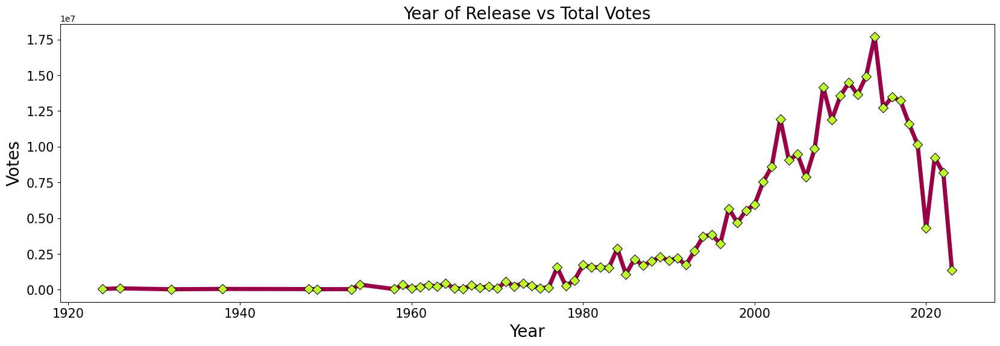

In [665]:
# Visualizing Year Vs Total Votes in lineplot

tx = imdb.groupby('Year')['Votes'].sum().sort_values(ascending=False)

plt.figure(figsize=(20,6))
rx = sns.lineplot(data =tx.reset_index(),x='Year',y='Votes',color="#990147",
            linestyle = 'solid',linewidth=5,marker="D",markersize=8,markerfacecolor="#c0fb2d",markeredgecolor="#000000")
plt.xlabel('Year',fontsize=20)
plt.xticks(fontsize=15)
plt.ylabel('Votes',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Year of Release vs Total Votes",fontsize=20)   
plt.show()

### Observations

Votes for movies are maximum between the years 2000 to 2022

Below is the list of Top 10 Release Year's with Total Votes

2014 - 17705532

2013 - 14929490

2011 - 14493498

2008 - 14173490

2012 - 13649627

2010 - 13551799

2016 - 13470953

2017 - 13226509

2015 - 12725451

2003 - 11941234


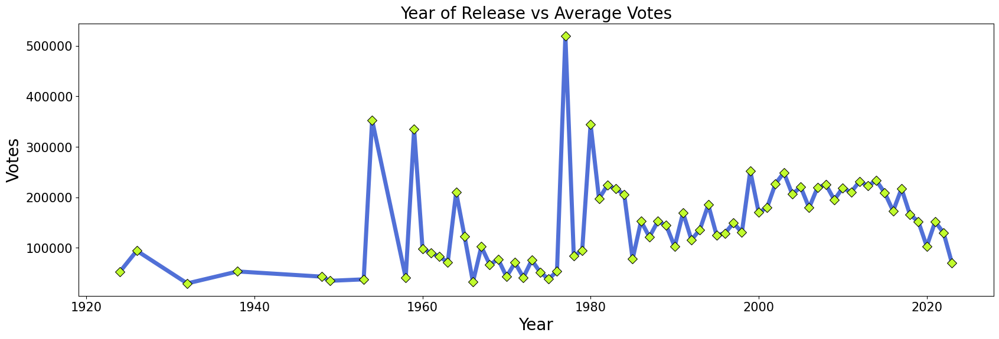

In [666]:
# Visualizing Year Vs Average Votes in lineplot

tx = imdb.groupby('Year')['Votes'].mean().sort_values(ascending=False)

plt.figure(figsize=(20,6))
rx = sns.lineplot(data =tx.reset_index(),x='Year',y='Votes',color="#5170d7",
            linestyle = 'solid',linewidth=5,marker="D",markersize=8,markerfacecolor="#c0fb2d",markeredgecolor="#000000")
plt.xlabel('Year',fontsize=20)
plt.xticks(fontsize=15)
plt.ylabel('Votes',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Year of Release vs Average Votes",fontsize=20)   
plt.show()

### Observations

From above lineplot, Average Votes are high for the movies which released in 1977, 1954, 1980, 1959 and 1999

Below is the Top 5 Release Year's list along with Average Votes

1977 - 520001

1954 - 352881

1980 - 344506.80

1959 - 334651

1999 - 252160.40


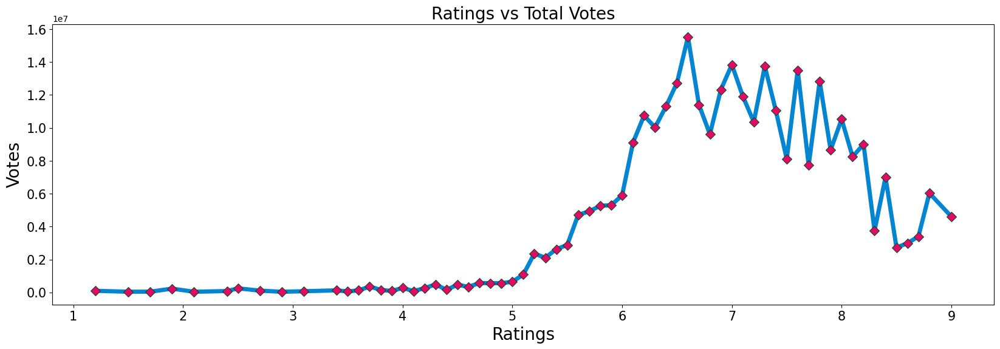

In [667]:
# Visualizing Ratings Vs Total Votes in lineplot

tx = imdb.groupby('Ratings')['Votes'].sum().sort_values(ascending=False)

plt.figure(figsize=(20,6))
rx = sns.lineplot(data =tx.reset_index(),x='Ratings',y='Votes',color="#0485d1",
            linestyle = 'solid',linewidth=5,marker="D",markersize=8,markerfacecolor="#de0c62",markeredgecolor="#05472a")
plt.xlabel('Ratings',fontsize=20)
plt.xticks(fontsize=15)
plt.ylabel('Votes',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Ratings vs Total Votes",fontsize=20)   
plt.show()

### Observations

Total numbers of Votes are higher for movies that typically have ratings between 6 and 8

Below is the Top 5 list of Ratings with Total Votes

6.6 - 15533174

7 - 13843755

7.3 - 13753101

7.6 - 13509773

7.8 - 12833946


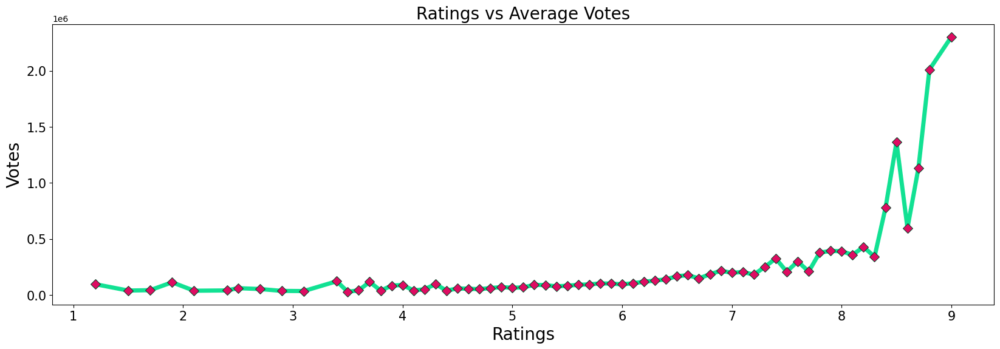

In [668]:
# Visualizing Ratings Vs Average Votes in lineplot

tx = imdb.groupby('Ratings')['Votes'].mean().sort_values(ascending=False)

plt.figure(figsize=(20,6))
rx = sns.lineplot(data =tx.reset_index(),x='Ratings',y='Votes',color="#12e193",
            linestyle = 'solid',linewidth=5,marker="D",markersize=8,markerfacecolor="#de0c62",markeredgecolor="#05472a")
plt.xlabel('Ratings',fontsize=20)
plt.xticks(fontsize=15)
plt.ylabel('Votes',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Ratings vs Average Votes",fontsize=20)   
plt.show()

### Observations

The average number of votes for movies tends to be higher when the movies have higher ratings

Below is the Top 5 list of Ratings with Average Votes

9 - 2303099.50

8.8 - 2011044

8.5 - 1362971

8.7 - 1133015.33

8.4 - 777306


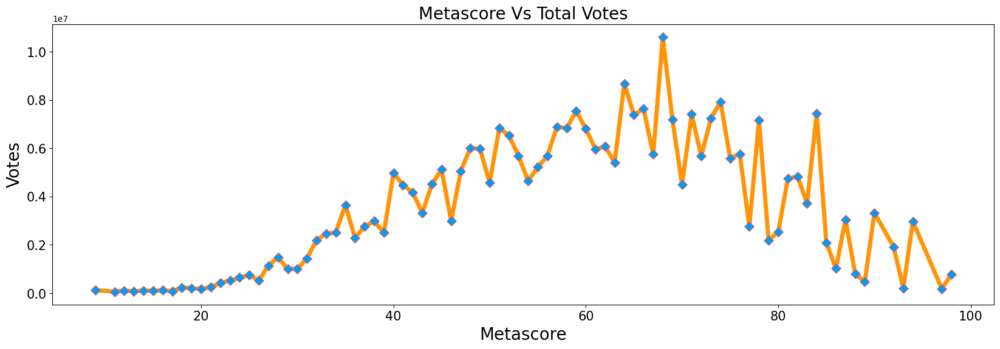

In [669]:
# Visualizing Metascore Vs Total Votes in lineplot


tx = imdb.groupby('Metascore')['Votes'].sum().sort_values(ascending=False)

plt.figure(figsize=(20,6))
rx = sns.lineplot(data =tx.reset_index(),x='Metascore',y='Votes',color="#ff9408",
            linestyle = 'solid',linewidth=5,marker="D",markersize=8,markerfacecolor="#069af3",markeredgecolor="#fc5a50")
plt.xlabel('Metascore',fontsize=20)
plt.xticks(fontsize=15)
plt.ylabel('Votes',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Metascore Vs Total Votes",fontsize=20)
plt.show()

### Observations

Total numbers of Votes are higher for movies that have Metascore between 50 to 80

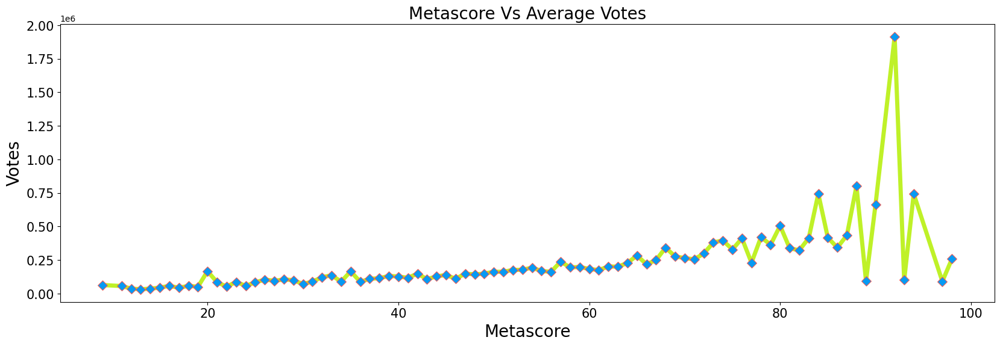

In [670]:
# Visualizing Metascore Vs Average Votes in lineplot

tx = imdb.groupby('Metascore')['Votes'].mean().sort_values(ascending=False)

plt.figure(figsize=(20,6))
rx = sns.lineplot(data =tx.reset_index(),x='Metascore',y='Votes',color="#bff128",
            linestyle = 'solid',linewidth=5,marker="D",markersize=8,markerfacecolor="#069af3",markeredgecolor="#fc5a50")
plt.xlabel('Metascore',fontsize=20)
plt.xticks(fontsize=15)
plt.ylabel('Votes',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Metascore Vs Average Votes",fontsize=20)
plt.show()

### Observations

Average number of votes for movies tends to be higher when the movies have higher Metascores and mostly between the range
80 to 98


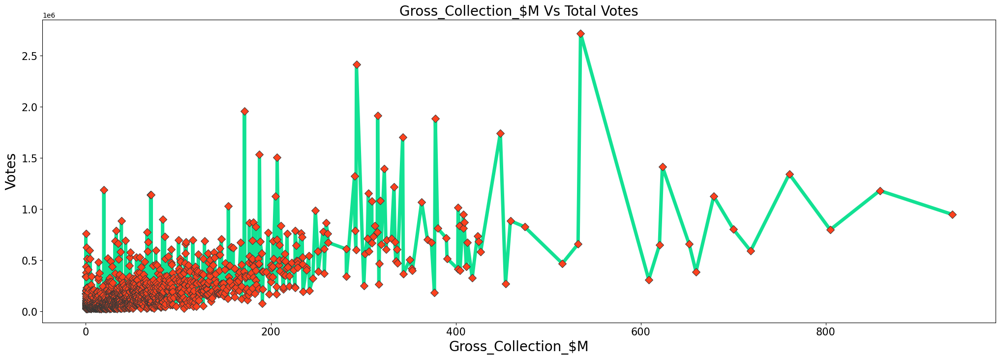

In [671]:
# Visualizing Gross_Collection_$M Vs Total Votes in lineplot

tx = imdb.groupby('Gross_Collection_$M')['Votes'].sum().sort_values(ascending=False)

plt.figure(figsize=(25,8))
rx = sns.lineplot(data =tx.reset_index(),x='Gross_Collection_$M',y='Votes',color="#12e193",
            linestyle = 'solid',linewidth=5,marker="D",markersize=8,markerfacecolor="#fd411e",markeredgecolor="#343837")
plt.xlabel('Gross_Collection_$M',fontsize=20)
plt.xticks(fontsize=15)
plt.ylabel('Votes',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Gross_Collection_$M Vs Total Votes",fontsize=20)   
plt.show()

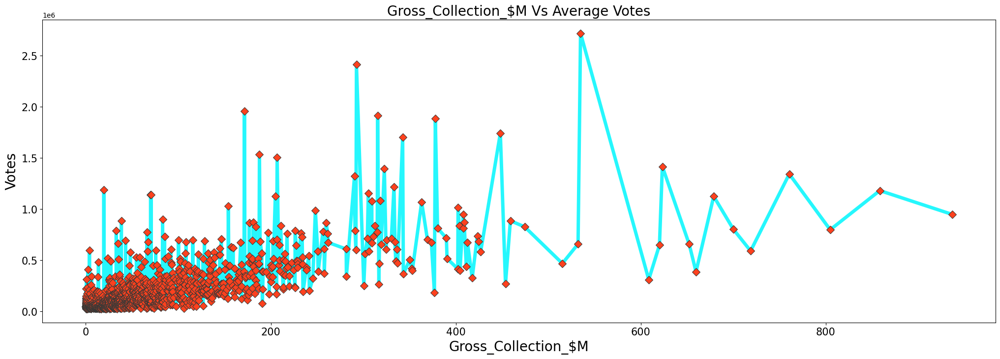

In [672]:
# Visualizing Gross_Collection_$M Vs Average Votes in lineplot

tx = imdb.groupby('Gross_Collection_$M')['Votes'].mean().sort_values(ascending=False)

plt.figure(figsize=(25,8))
rx = sns.lineplot(data =tx.reset_index(),x='Gross_Collection_$M',y='Votes',color="#26f7fd",
            linestyle = 'solid',linewidth=5,marker="D",markersize=8,markerfacecolor="#fd411e",markeredgecolor="#343837")
plt.xlabel('Gross_Collection_$M',fontsize=20)
plt.xticks(fontsize=15)
plt.ylabel('Votes',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Gross_Collection_$M Vs Average Votes",fontsize=20)   
plt.show()

### Observations

Based on Gross_Collection Vs Total and Average Votes, we can observe

Most of the movies with higher Votes tends to have higher Gross_Collection which is above $200M

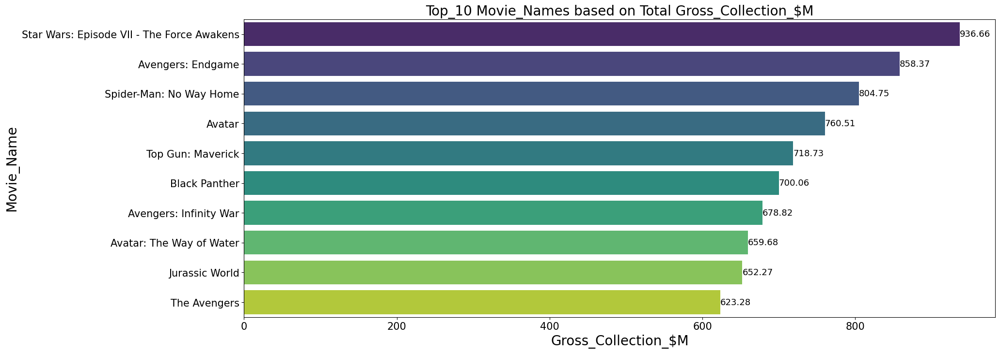

In [673]:
# Visualizing Top_10 Movie_Names based on Total Gross_Collection_$M in barplot


tx = imdb.groupby('Movie_Name')['Gross_Collection_$M'].sum().nlargest(10)
imdb_top_10 = tx.sort_values(ascending=False)


plt.figure(figsize=(20,8))
rx = sns.barplot(data=imdb_top_10.reset_index(), y='Movie_Name', x='Gross_Collection_$M', palette="viridis")
plt.xlabel('Gross_Collection_$M',fontsize=20)
plt.xticks(fontsize=15)
plt.ylabel('Movie_Name',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Top_10 Movie_Names based on Total Gross_Collection_$M",fontsize=20)

for i in rx.containers:
     rx.bar_label(i,fontsize=13)
    
plt.show()

### Observations

Above barplot shows the Top 10 movies with their Gross_Collection and below is the list with Gross Collection

Star Wars: Episode VII - The Force Awakens	936.66,
Avengers: Endgame	858.37,
Spider-Man: No Way Home	804.75,
Avatar	760.51,
Top Gun: Maverick	718.73,
Black Panther	700.06,
Avengers: Infinity War	678.82,
Avatar: The Way of Water	659.68,
Jurassic World	652.27 and 
The Avengers	623.28

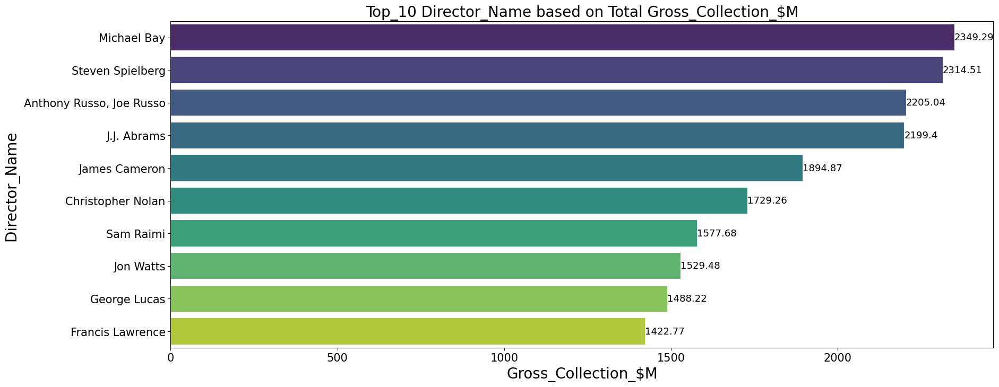

In [674]:
# Visualizing Top_10 Director_Name based on Total Gross_Collection_$M in barplot


tx = imdb.groupby('Director_Name')['Gross_Collection_$M'].sum().nlargest(10)
imdb_top_10 = tx.sort_values(ascending=False)


plt.figure(figsize=(20,8))
rx = sns.barplot(data=imdb_top_10.reset_index(), y='Director_Name', x='Gross_Collection_$M', palette="viridis")
plt.xlabel('Gross_Collection_$M',fontsize=20)
plt.xticks(fontsize=15)
plt.ylabel('Director_Name ',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Top_10 Director_Name based on Total Gross_Collection_$M",fontsize=20)

for i in rx.containers:
    rx.bar_label(i,fontsize=13)
    
plt.show()

### Observations

Above barplot shows the Top 10 Director's with their Total Gross_Collection and below is the list

Michael Bay	2349.29,
Steven Spielberg	2314.51,
Anthony Russo, Joe Russo	2205.04,
J.J. Abrams	2199.4,
James Cameron	1894.87,
Christopher Nolan	1729.26,
Sam Raimi	1577.68,
Jon Watts	1529.48,
George Lucas	1488.22 and
Francis Lawrence	1422.77

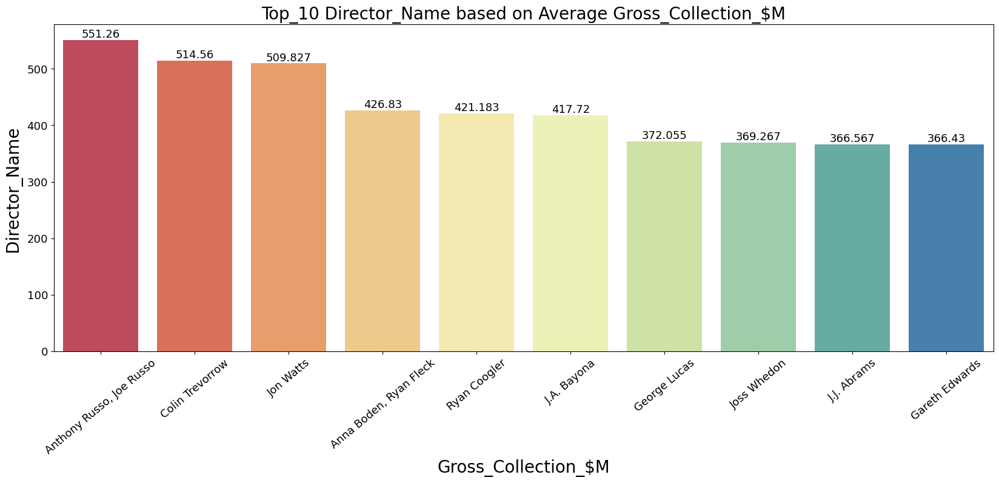

In [675]:
# Visualizing Top_10 Director_Name based on Average Gross_Collection_$M in barplot


tx = imdb.groupby('Director_Name')['Gross_Collection_$M'].mean().nlargest(10)
imdb_top_10 = tx.sort_values(ascending=False)


plt.figure(figsize=(20,7))
rx = sns.barplot(data=imdb_top_10.reset_index(), x ='Director_Name', y ='Gross_Collection_$M', palette="Spectral")
plt.xlabel('Gross_Collection_$M',fontsize=20)
plt.xticks(fontsize=13,rotation=40)
plt.ylabel('Director_Name ',fontsize=20)
plt.yticks(fontsize=13)
plt.title("Top_10 Director_Name based on Average Gross_Collection_$M",fontsize=20)

for i in rx.containers:
    rx.bar_label(i,fontsize=13)
    
plt.show()

### Observations

Based on Average Gross_Collection, below is the list of Top 10 Directors with their Average Gross Collection

Anthony Russo, Joe Russo	551.26,
Colin Trevorrow	514.56,
Jon Watts	509.82,
Anna Boden, Ryan Fleck	426.83,
Ryan Coogler	421.18,
J.A. Bayona	417.72,
George Lucas	372.05,
Joss Whedon	369.26,
J.J. Abrams	366.56 and
Gareth Edwards	366.43

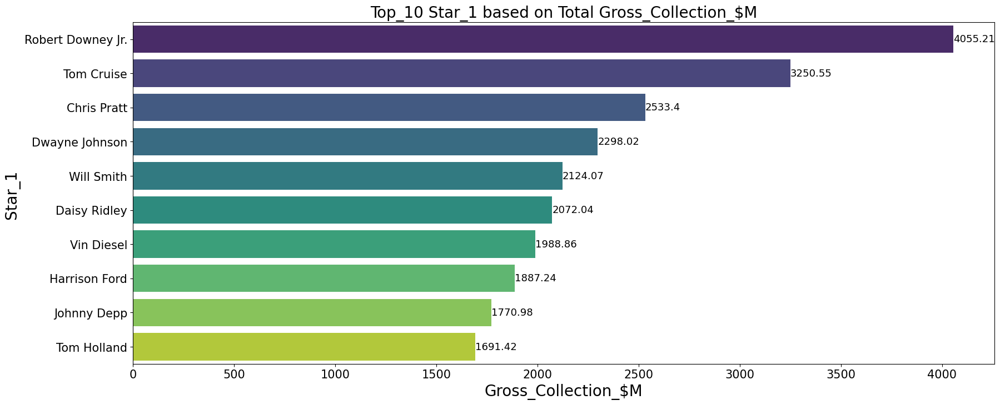

In [676]:
# Visualizing Top_10 Star_1 based on Total Gross_Collection_$M in barplot


tx = imdb.groupby('Star_1')['Gross_Collection_$M'].sum().nlargest(10)
imdb_top_10 = tx.sort_values(ascending=False)


plt.figure(figsize=(20,8))
rx = sns.barplot(data=imdb_top_10.reset_index(), y='Star_1', x='Gross_Collection_$M', palette="viridis")
plt.xlabel('Gross_Collection_$M',fontsize=20)
plt.xticks(fontsize=15)
plt.ylabel('Star_1 ',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Top_10 Star_1 based on Total Gross_Collection_$M",fontsize=20)

for i in rx.containers:
    rx.bar_label(i,fontsize=13)
    
plt.show()

### Observations

Above barplot shows Top 10 actors(Star_1) with their Total Gross Collection

Robert Downey Jr.	4055.21,
Tom Cruise	3250.55,
Chris Pratt	2533.4,
Dwayne Johnson	2298.02,
Will Smith	2124.07,
Daisy Ridley	2072.04,
Vin Diesel	1988.86,
Harrison Ford	1887.24,
Johnny Depp	1770.98 and
Tom Holland	1691.42

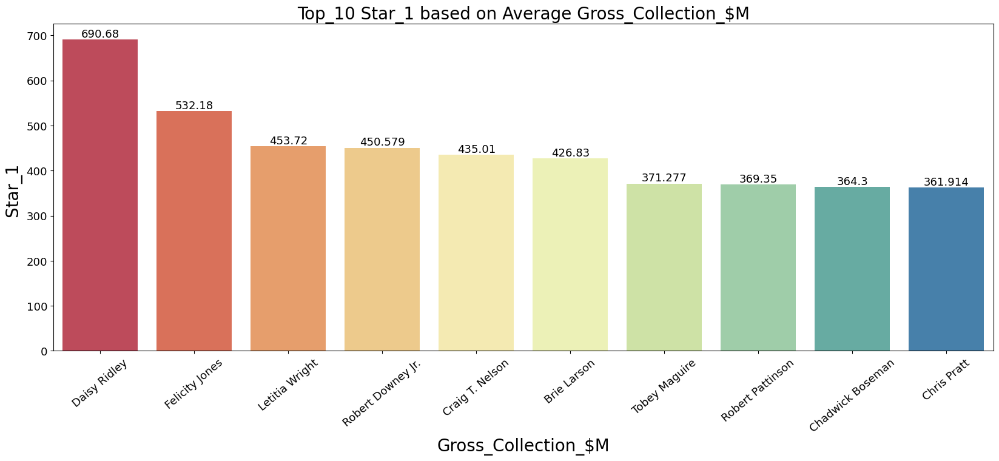

In [677]:
# Visualizing Top_10 Star_1 based on Average Gross_Collection_$M in barplot


tx = imdb.groupby('Star_1')['Gross_Collection_$M'].mean().nlargest(10)
imdb_top_10 = tx.sort_values(ascending=False)


plt.figure(figsize=(20,7))
rx = sns.barplot(data=imdb_top_10.reset_index(), x ='Star_1', y ='Gross_Collection_$M', palette="Spectral")
plt.xlabel('Gross_Collection_$M',fontsize=20)
plt.xticks(fontsize=13,rotation=40)
plt.ylabel('Star_1 ',fontsize=20)
plt.yticks(fontsize=13)
plt.title("Top_10 Star_1 based on Average Gross_Collection_$M",fontsize=20)

for i in rx.containers:
    rx.bar_label(i,fontsize=13)
    
plt.show()

### Observations

Above barplot shows Top 10 actors(Star_1) with their Average Gross Collection

Daisy Ridley	690.68,
Felicity Jones	532.18,
Letitia Wright	453.72,
Robert Downey Jr.	450.57,
Craig T. Nelson	435.01,
Brie Larson	426.83,
Tobey Maguire	371.27,
Robert Pattinson	369.35,
Chadwick Boseman	364.30 and
Chris Pratt	361.91


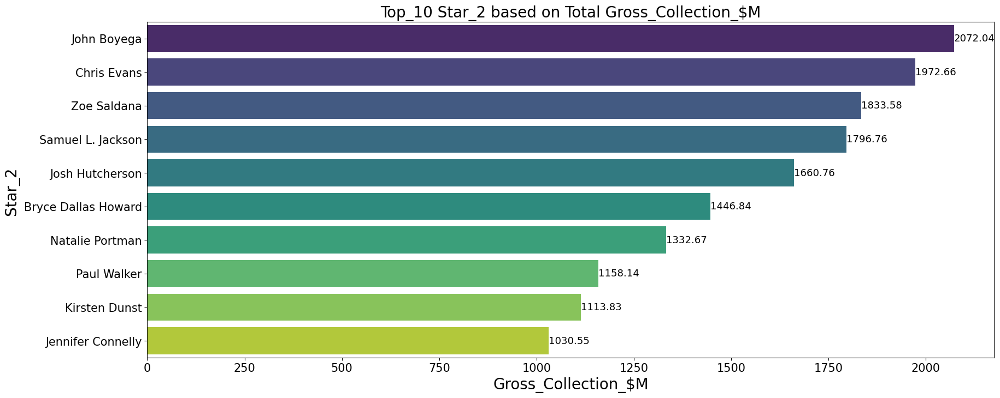

In [678]:
# Visualizing Top_10 Star_2 based on Total Gross_Collection_$M in barplot


tx = imdb.groupby('Star_2')['Gross_Collection_$M'].sum().nlargest(10)
imdb_top_10 = tx.sort_values(ascending=False)


plt.figure(figsize=(20,8))
rx = sns.barplot(data=imdb_top_10.reset_index(), y='Star_2', x='Gross_Collection_$M', palette="viridis")
plt.xlabel('Gross_Collection_$M',fontsize=20)
plt.xticks(fontsize=15)
plt.ylabel('Star_2 ',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Top_10 Star_2 based on Total Gross_Collection_$M",fontsize=20)

for i in rx.containers:
    rx.bar_label(i,fontsize=13)
    
plt.show()

### Observations

Above barplot shows Top 10 actors(Star_2) with their Total Gross Collection

John Boyega	2072.04,
Chris Evans	1972.66,
Zoe Saldana	1833.58,
Samuel L. Jackson	1796.76,
Josh Hutcherson	1660.76,
Bryce Dallas Howard	1446.84,
Natalie Portman	1332.67,
Paul Walker	1158.14,
Kirsten Dunst	1113.83 and
Jennifer Connelly	1030.55


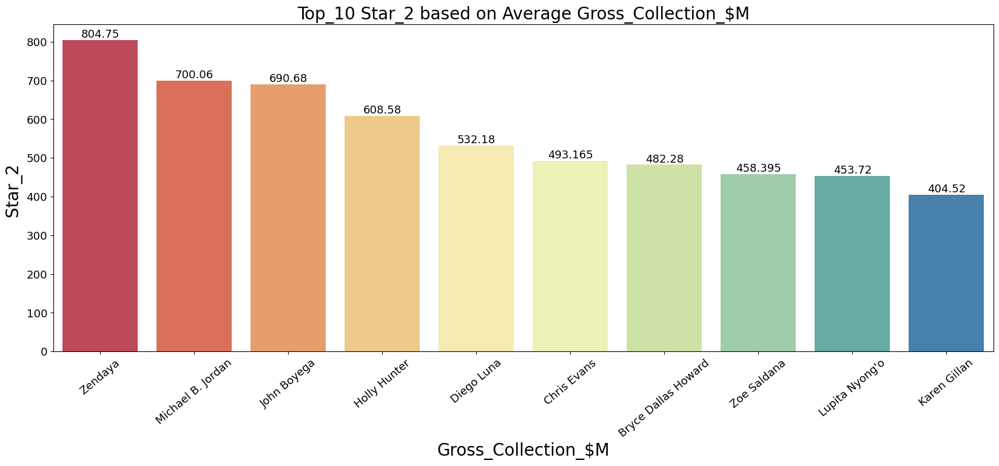

In [679]:
# Visualizing Top_10 Star_2 based on Average Gross_Collection_$M in barplot


tx = imdb.groupby('Star_2')['Gross_Collection_$M'].mean().nlargest(10)
imdb_top_10 = tx.sort_values(ascending=False)


plt.figure(figsize=(20,7))
rx = sns.barplot(data=imdb_top_10.reset_index(), x ='Star_2', y ='Gross_Collection_$M', palette="Spectral")
plt.xlabel('Gross_Collection_$M',fontsize=20)
plt.xticks(fontsize=13,rotation=40)
plt.ylabel('Star_2 ',fontsize=20)
plt.yticks(fontsize=13)
plt.title("Top_10 Star_2 based on Average Gross_Collection_$M",fontsize=20)

for i in rx.containers:
    rx.bar_label(i,fontsize=13)
    
plt.show()

### Observations

Above barplot shows Top 10 actors(Star_2) with their Average Gross Collection

Zendaya	804.75,
Michael B. Jordan	700.06,
John Boyega	690.68,
Holly Hunter	608.58,
Diego Luna	532.18,
Chris Evans	493.16,
Bryce Dallas Howard	482.28,
Zoe Saldana	458.39,
Lupita Nyong'o	453.72 and
Karen Gillan	404.52


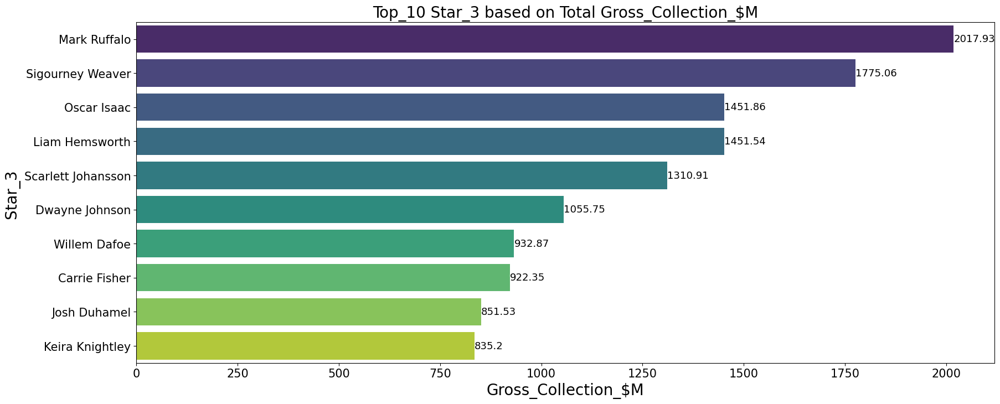

In [680]:
# Visualizing Top_10 Star_3 based on Total Gross_Collection_$M in barplot


tx = imdb.groupby('Star_3')['Gross_Collection_$M'].sum().nlargest(10)
imdb_top_10 = tx.sort_values(ascending=False)


plt.figure(figsize=(20,8))
rx = sns.barplot(data=imdb_top_10.reset_index(), y='Star_3', x='Gross_Collection_$M', palette="viridis")
plt.xlabel('Gross_Collection_$M',fontsize=20)
plt.xticks(fontsize=15)
plt.ylabel('Star_3 ',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Top_10 Star_3 based on Total Gross_Collection_$M",fontsize=20)

for i in rx.containers:
    rx.bar_label(i,fontsize=13)
    
plt.show()

### Observations

From above barplot shows Top 10 actors(Star_3) with their Total Gross Collection

Mark Ruffalo	2017.93
Sigourney Weaver	1775.06
Oscar Isaac	1451.86
Liam Hemsworth	1451.54
Scarlett Johansson	1310.91
Dwayne Johnson	1055.75
Willem Dafoe	932.87
Carrie Fisher	922.35
Josh Duhamel	851.53
Keira Knightley	835.2


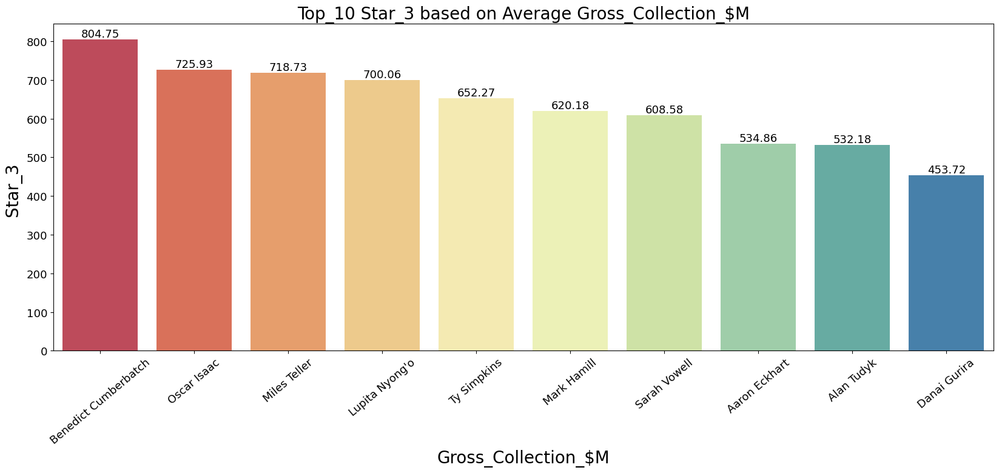

In [681]:
# Visualizing Top_10 Star_3 based on Average Gross_Collection_$M in barplot


tx = imdb.groupby('Star_3')['Gross_Collection_$M'].mean().nlargest(10)
imdb_top_10 = tx.sort_values(ascending=False)


plt.figure(figsize=(20,7))
rx = sns.barplot(data=imdb_top_10.reset_index(), x ='Star_3', y ='Gross_Collection_$M', palette="Spectral")
plt.xlabel('Gross_Collection_$M',fontsize=20)
plt.xticks(fontsize=13,rotation=40)
plt.ylabel('Star_3 ',fontsize=20)
plt.yticks(fontsize=13)
plt.title("Top_10 Star_3 based on Average Gross_Collection_$M",fontsize=20)

for i in rx.containers:
    rx.bar_label(i,fontsize=13)
    
plt.show()

### Observations

From above barplot shows Top 10 actors(Star_3) with their Average Gross Collection

Benedict Cumberbatch	804.75,
Oscar Isaac	725.93,
Miles Teller	718.73,
Lupita Nyong'o	700.06,
Ty Simpkins	652.27,
Mark Hamill	620.18,
Sarah Vowell	608.58,
Aaron Eckhart	534.86,
Alan Tudyk	532.18 and
Danai Gurira	453.72

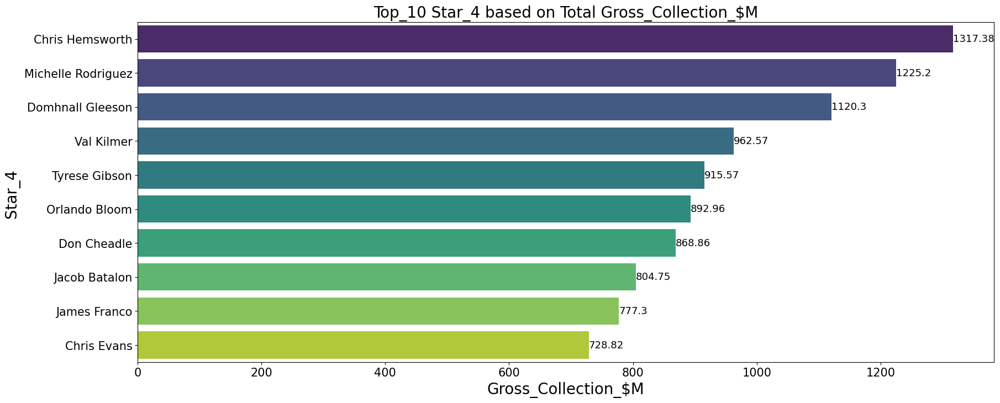

In [682]:
# Visualizing Top_10 Star_4 based on Total Gross_Collection_$M in barplot


tx = imdb.groupby('Star_4')['Gross_Collection_$M'].sum().nlargest(10)
imdb_top_10 = tx.sort_values(ascending=False)


plt.figure(figsize=(20,8))
rx = sns.barplot(data=imdb_top_10.reset_index(), y='Star_4', x='Gross_Collection_$M', palette="viridis")
plt.xlabel('Gross_Collection_$M',fontsize=20)
plt.xticks(fontsize=15)
plt.ylabel('Star_4 ',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Top_10 Star_4 based on Total Gross_Collection_$M",fontsize=20)

for i in rx.containers:
    rx.bar_label(i,fontsize=13)
    
plt.show()

### Observations

From above barplot shows Top 10 actors(Star_4) with their Total Gross Collection

Chris Hemsworth	1317.38,
Michelle Rodriguez	1225.2,
Domhnall Gleeson	1120.3,
Val Kilmer	962.57,
Tyrese Gibson	915.57,
Orlando Bloom	892.96,
Don Cheadle	868.86,
Jacob Batalon	804.75,
James Franco	777.3 and
Chris Evans	728.82

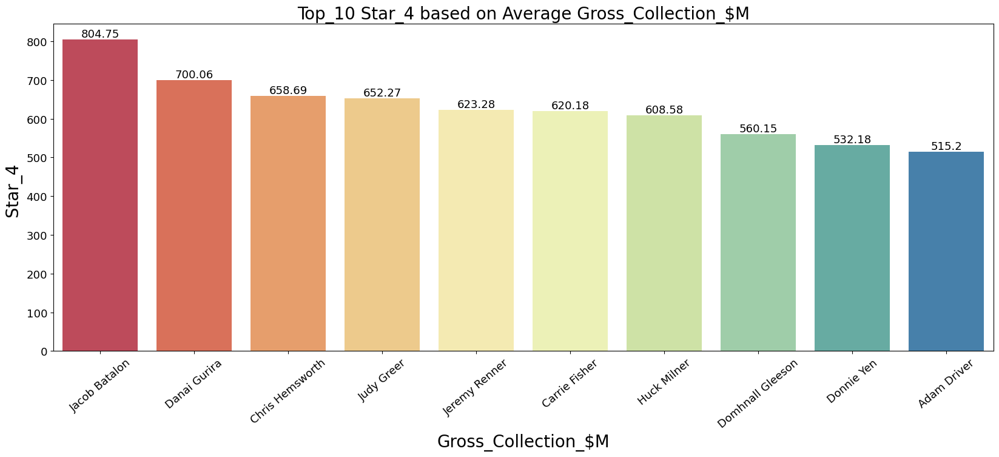

In [683]:
# Visualizing Top_10 Star_4 based on Average Gross_Collection_$M in barplot


tx = imdb.groupby('Star_4')['Gross_Collection_$M'].mean().nlargest(10)
imdb_top_10 = tx.sort_values(ascending=False)


plt.figure(figsize=(20,7))
rx = sns.barplot(data=imdb_top_10.reset_index(), x ='Star_4', y ='Gross_Collection_$M', palette="Spectral")
plt.xlabel('Gross_Collection_$M',fontsize=20)
plt.xticks(fontsize=13,rotation=40)
plt.ylabel('Star_4 ',fontsize=20)
plt.yticks(fontsize=13)
plt.title("Top_10 Star_4 based on Average Gross_Collection_$M",fontsize=20)

for i in rx.containers:
    rx.bar_label(i,fontsize=13)
    
plt.show()

### Observations

From above barplot shows Top 10 actors(Star_4) with their Average Gross Collection

Jacob Batalon	804.75,
Danai Gurira	700.06,
Chris Hemsworth	658.69,
Judy Greer	652.27,
Jeremy Renner	623.28,
Carrie Fisher	620.18,
Huck Milner	608.58,
Domhnall Gleeson	560.15,
Donnie Yen	532.18 and
Adam Driver	515.2


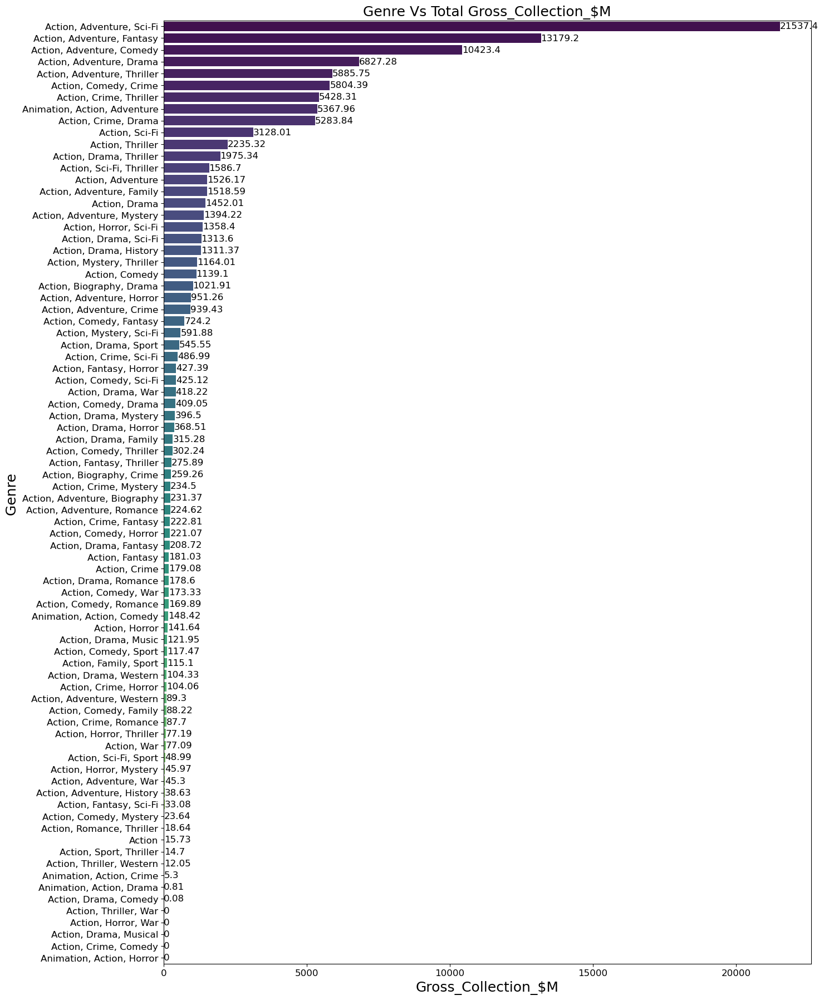

In [684]:
# Visualizing Top_10 Genre Vs Total Gross_Collection_$M in barplot

tx = imdb.groupby('Genre')['Gross_Collection_$M'].sum().sort_values(ascending=False)

plt.figure(figsize=(15,22))
rx = sns.barplot(data=tx.reset_index(), y='Genre', x='Gross_Collection_$M', palette="viridis")
plt.xlabel('Gross_Collection_$M',fontsize=18)
plt.xticks(fontsize=12)
plt.ylabel('Genre ',fontsize=18)
plt.yticks(fontsize=12)
plt.title("Genre Vs Total Gross_Collection_$M",fontsize=18)

for i in rx.containers:
    rx.bar_label(i,fontsize=12)
    
plt.show()

### Observations

From the above bar plot, it can be observed that the genres of Action, Adventure, Sci-Fi have higher gross collection(Total)

Below is the list of Top 5 Genre's with Total Gross_Collection

Action, Adventure, Sci-Fi - 21537.4

Action, Adventure, Fantasy - 13179.18

Action, Adventure, Comedy - 10423.41

Action, Adventure, Drama - 6827.28

Action, Adventure, Thriller - 5885.75


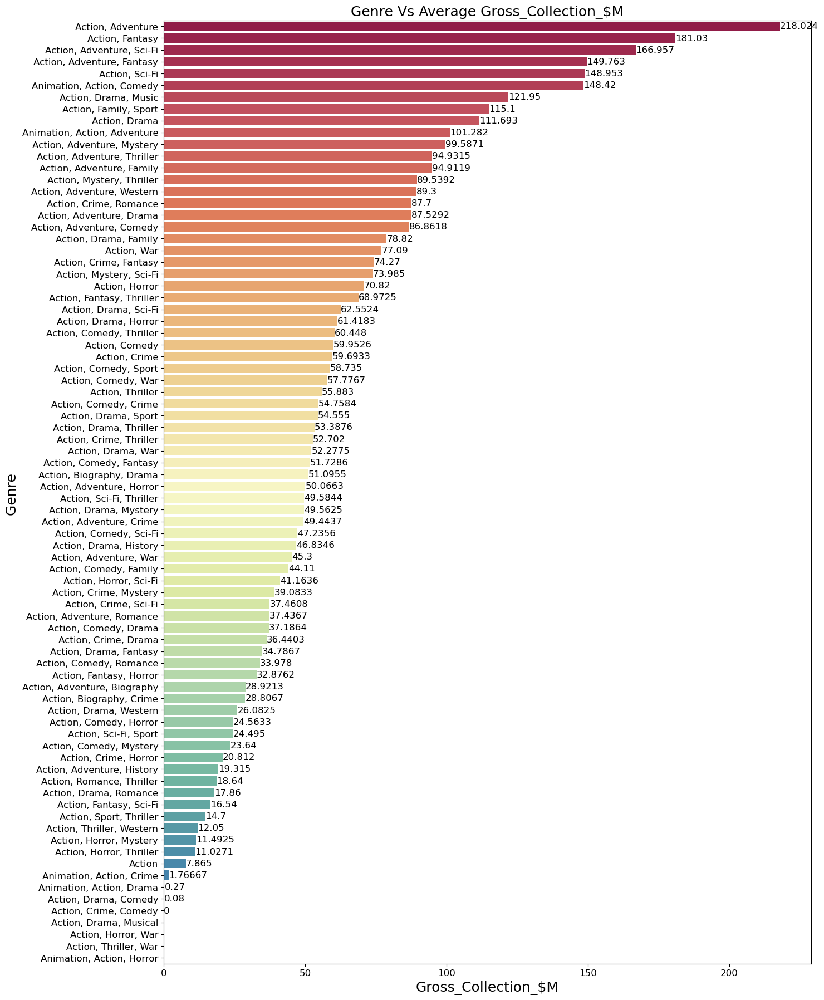

In [685]:
# Visualizing Top_10 Genre Vs Average Gross_Collection_$M in barplot

tx = imdb.groupby('Genre')['Gross_Collection_$M'].mean().sort_values(ascending=False)

plt.figure(figsize=(15,22))
rx = sns.barplot(data=tx.reset_index(), y='Genre', x='Gross_Collection_$M', palette="Spectral")
plt.xlabel('Gross_Collection_$M',fontsize=18)
plt.xticks(fontsize=12)
plt.ylabel('Genre ',fontsize=18)
plt.yticks(fontsize=12)
plt.title("Genre Vs Average Gross_Collection_$M",fontsize=18)

for i in rx.containers:
    rx.bar_label(i,fontsize=12)
    
plt.show()

### Observations

From the above bar plot, it can be observed that the genres of Action, Adventure have higher gross collection(Average)

Below is the list of Top 5 Genre's with Average Gross_Collection

Action, Adventure - 218.02

Action, Fantasy - 181.03

Action, Adventure, Sci-Fi - 166.95

Action, Adventure, Fantasy - 149.76

Action, Sci-Fi - 148.95


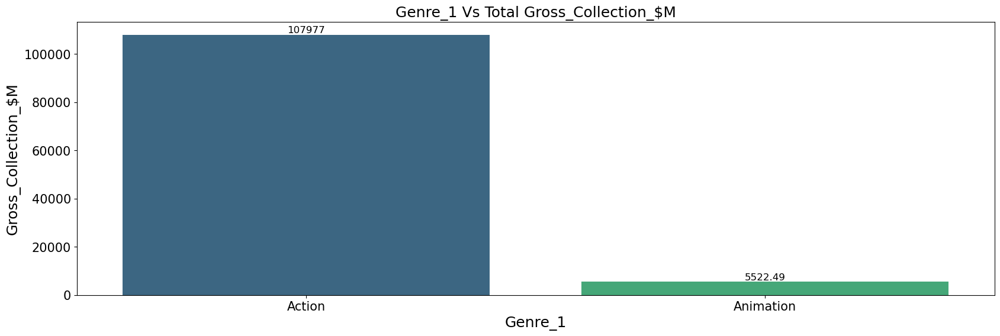

In [686]:
# Visualizing Genre_1 Vs Total Gross_Collection_$M in barplot

tx = imdb.groupby('Genre_1')['Gross_Collection_$M'].sum().sort_values(ascending=False)

plt.figure(figsize=(20,6))
rx = sns.barplot(data=tx.reset_index(), x='Genre_1', y='Gross_Collection_$M', palette="viridis")
plt.xlabel('Genre_1',fontsize=18)
plt.xticks(fontsize=15)
plt.ylabel('Gross_Collection_$M',fontsize=18)
plt.yticks(fontsize=15)
plt.title("Genre_1 Vs Total Gross_Collection_$M",fontsize=18)

for i in rx.containers:
     rx.bar_label(i,fontsize=12)
    
plt.show()

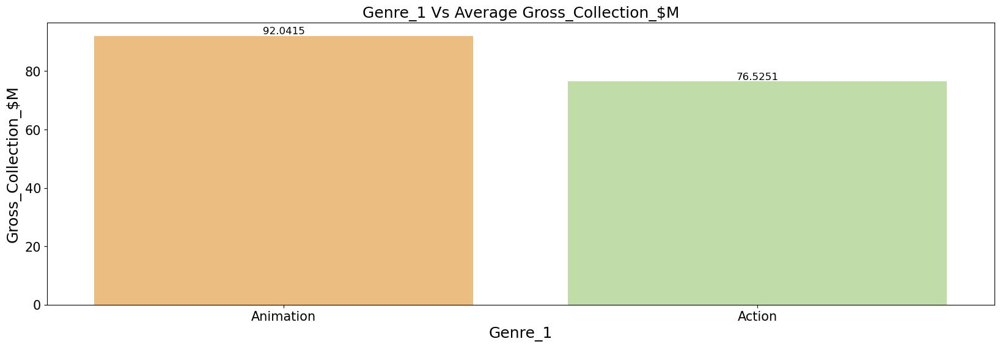

In [687]:
# Visualizing Genre_1 Vs Average Gross_Collection_$M in barplot

tx = imdb.groupby('Genre_1')['Gross_Collection_$M'].mean().sort_values(ascending=False)

plt.figure(figsize=(20,6))
rx = sns.barplot(data=tx.reset_index(), x='Genre_1', y='Gross_Collection_$M', palette="Spectral")
plt.xlabel('Genre_1',fontsize=18)
plt.xticks(fontsize=15)
plt.ylabel('Gross_Collection_$M',fontsize=18)
plt.yticks(fontsize=15)
plt.title("Genre_1 Vs Average Gross_Collection_$M",fontsize=18)

for i in rx.containers:
     rx.bar_label(i,fontsize=12)
    
plt.show()

### Observations

In Genre_1 Vs Total Gross_Collection, Action genre have higher Total Gross_Collection than Animation

In Genre_1 Vs Average Gross_Collection, Animation genre have higher Average Gross_Collection than Action

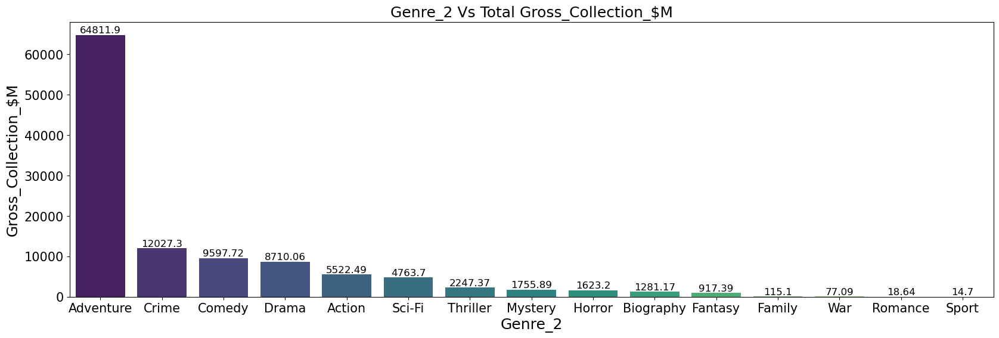

In [688]:
# Visualizing Genre_2 Vs Total Gross_Collection_$M in barplot

tx = imdb.groupby('Genre_2')['Gross_Collection_$M'].sum().sort_values(ascending=False)

plt.figure(figsize=(20,6))
rx = sns.barplot(data=tx.reset_index(), x='Genre_2', y='Gross_Collection_$M', palette="viridis")
plt.xlabel('Genre_2',fontsize=18)
plt.xticks(fontsize=15)
plt.ylabel('Gross_Collection_$M',fontsize=18)
plt.yticks(fontsize=15)
plt.title("Genre_2 Vs Total Gross_Collection_$M",fontsize=18)

for i in rx.containers:
     rx.bar_label(i,fontsize=12)
    
plt.show()

### Observations

Based on Genre_2 Vs Total Gross_Collection, Adventure genre have the highest Total Gross Collection 

Below is the Top 5 list of Genre_2

Adventure	64811.90

Crime	12027.29

Comedy	9597.72

Drama	8710.06

Action	5522.49

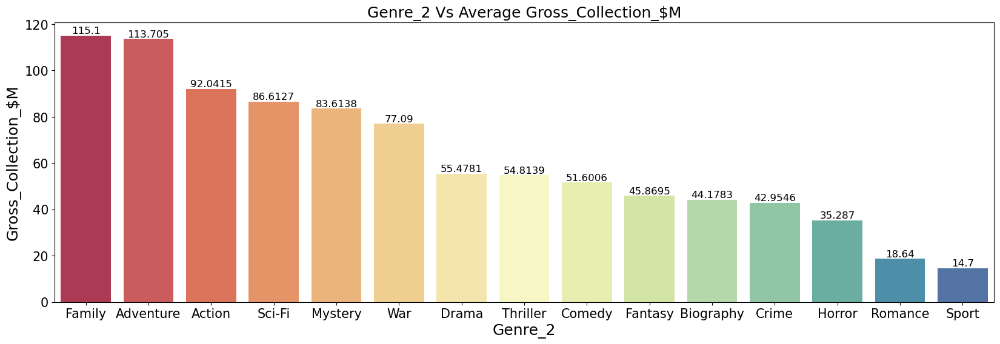

In [689]:
# Visualizing Genre_2 Vs Average Gross_Collection_$M in barplot

tx = imdb.groupby('Genre_2')['Gross_Collection_$M'].mean().sort_values(ascending=False)

plt.figure(figsize=(20,6))
rx = sns.barplot(data=tx.reset_index(), x='Genre_2', y='Gross_Collection_$M', palette="Spectral")
plt.xlabel('Genre_2',fontsize=18)
plt.xticks(fontsize=15)
plt.ylabel('Gross_Collection_$M',fontsize=18)
plt.yticks(fontsize=15)
plt.title("Genre_2 Vs Average Gross_Collection_$M",fontsize=18)

for i in rx.containers:
     rx.bar_label(i,fontsize=12)
    
plt.show()

### Observations

Based on Genre_2 Vs Average Gross_Collection, Family and Adventure genre have the highest Average Gross Collection

Below is the list of Top 5 Genre_2

Adventure	64811.90

Crime	12027.29

Comedy	9597.72

Drama	8710.06

Action	5522.49


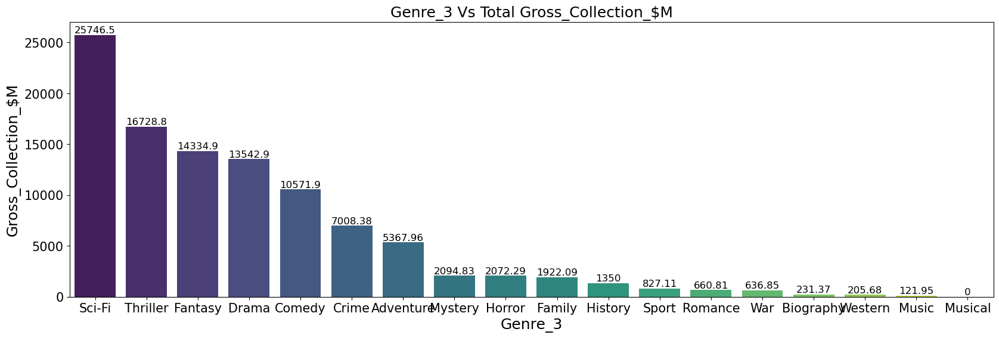

In [690]:
# Visualizing Genre_3 Vs Total Gross_Collection_$M in barplot

tx = imdb.groupby('Genre_3')['Gross_Collection_$M'].sum().sort_values(ascending=False)

plt.figure(figsize=(20,6))
rx = sns.barplot(data=tx.reset_index(), x='Genre_3', y='Gross_Collection_$M', palette="viridis")
plt.xlabel('Genre_3',fontsize=18)
plt.xticks(fontsize=15)
plt.ylabel('Gross_Collection_$M',fontsize=18)
plt.yticks(fontsize=15)
plt.title("Genre_3 Vs Total Gross_Collection_$M",fontsize=18)

for i in rx.containers:
     rx.bar_label(i,fontsize=12)
    
plt.show()

### Observations

Based on Genre_3 Vs Total Gross_Collection, Sci-Fi genre have the highest Total Gross Collection

Below is the list of Top 5 Genre_3

Sci-Fi	25746.47

Thriller	16728.77

Fantasy	14334.91

Drama	13542.89

Comedy	10571.91


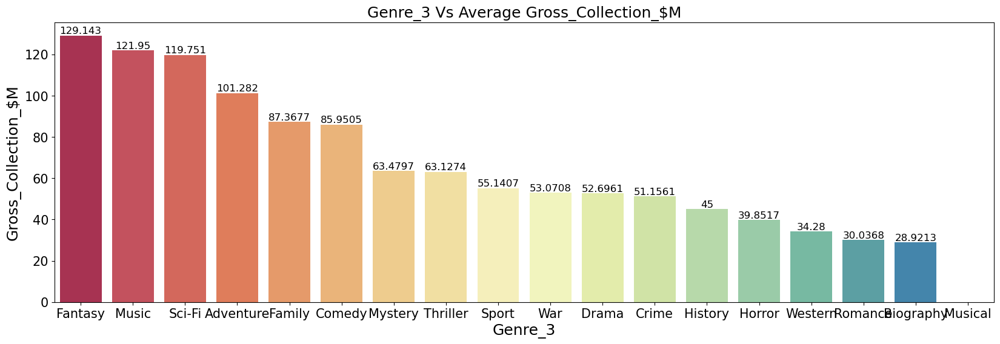

In [691]:
# Visualizing Genre_3 Vs Average Gross_Collection_$M in barplot

tx = imdb.groupby('Genre_3')['Gross_Collection_$M'].mean().sort_values(ascending=False)

plt.figure(figsize=(20,6))
rx = sns.barplot(data=tx.reset_index(), x='Genre_3', y='Gross_Collection_$M', palette="Spectral")
plt.xlabel('Genre_3',fontsize=18)
plt.xticks(fontsize=15)
plt.ylabel('Gross_Collection_$M',fontsize=18)
plt.yticks(fontsize=15)
plt.title("Genre_3 Vs Average Gross_Collection_$M",fontsize=18)

for i in rx.containers:
     rx.bar_label(i,fontsize=12)
    
plt.show()

### Observations

Based on Genre_3 Vs Average Gross_Collection, Sci-Fi genre have the highest Average Gross Collection

Below is the list of Top 5 Genre_3

Fantasy	129.14

Music	121.95

Sci-Fi	119.75

Adventure	101.28

Family	87.36


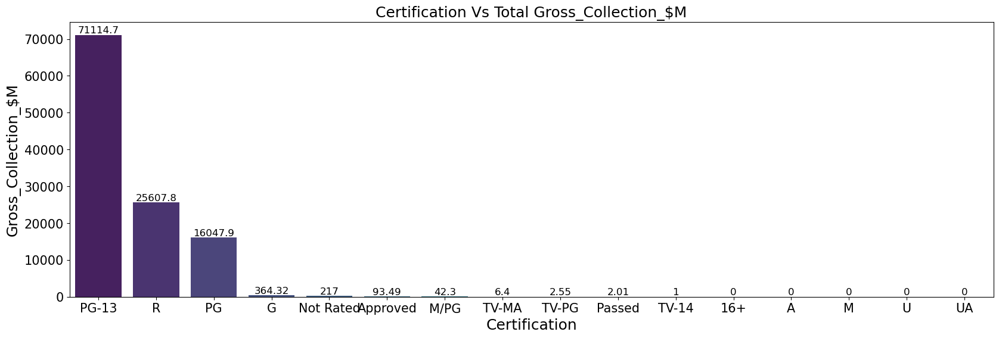

In [692]:
# Visualizing Certification Vs Total Gross_Collection_$M in barplot

tx = imdb.groupby('Certification')['Gross_Collection_$M'].sum().sort_values(ascending=False)

plt.figure(figsize=(20,6))
rx = sns.barplot(data=tx.reset_index(), x='Certification', y='Gross_Collection_$M', palette="viridis")
plt.xlabel('Certification',fontsize=18)
plt.xticks(fontsize=15)
plt.ylabel('Gross_Collection_$M',fontsize=18)
plt.yticks(fontsize=15)
plt.title("Certification Vs Total Gross_Collection_$M",fontsize=18)

for i in rx.containers:
     rx.bar_label(i,fontsize=12)
    
plt.show()

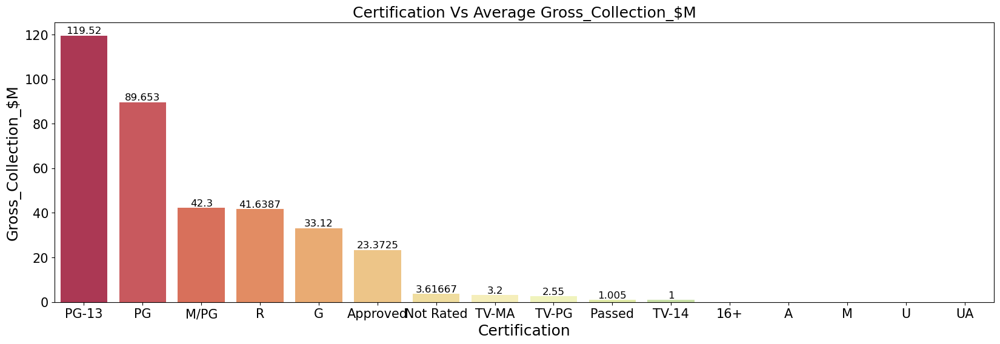

In [693]:
# Visualizing Certification Vs Average Gross_Collection_$M in barplot

tx = imdb.groupby('Certification')['Gross_Collection_$M'].mean().sort_values(ascending=False)

plt.figure(figsize=(20,6))
rx = sns.barplot(data=tx.reset_index(), x='Certification', y='Gross_Collection_$M', palette="Spectral")
plt.xlabel('Certification',fontsize=18)
plt.xticks(fontsize=15)
plt.ylabel('Gross_Collection_$M',fontsize=18)
plt.yticks(fontsize=15)
plt.title("Certification Vs Average Gross_Collection_$M",fontsize=18)

for i in rx.containers:
     rx.bar_label(i,fontsize=12)
    
plt.show()

### Observations

From above barplot, it can be observed

For Certification Vs Total Gross_Collection and Average Gross_Collection, PG-13 have the highest Gross Collection

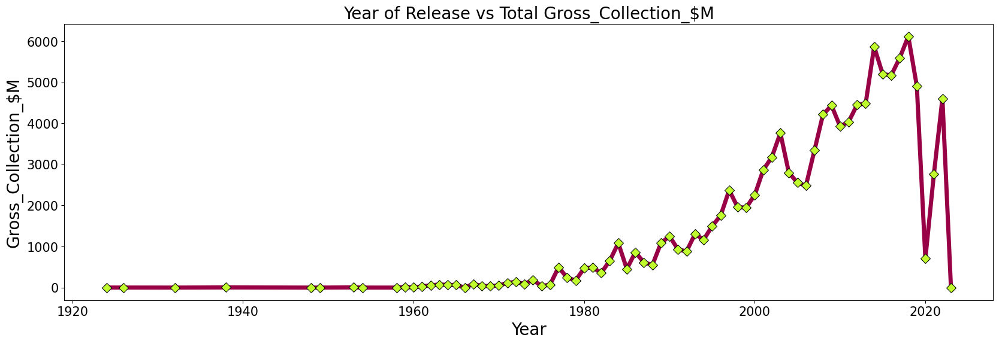

In [694]:
# Visualizing Year Vs Total Gross_Collection_$M in lineplot

tx = imdb.groupby('Year')['Gross_Collection_$M'].sum().sort_values(ascending=False)

plt.figure(figsize=(20,6))
rx = sns.lineplot(data =tx.reset_index(),x='Year',y='Gross_Collection_$M',color="#990147",
            linestyle = 'solid',linewidth=5,marker="D",markersize=8,markerfacecolor="#c0fb2d",markeredgecolor="#000000")
plt.xlabel('Year',fontsize=20)
plt.xticks(fontsize=15)
plt.ylabel('Gross_Collection_$M',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Year of Release vs Total Gross_Collection_$M",fontsize=20)   
plt.show()

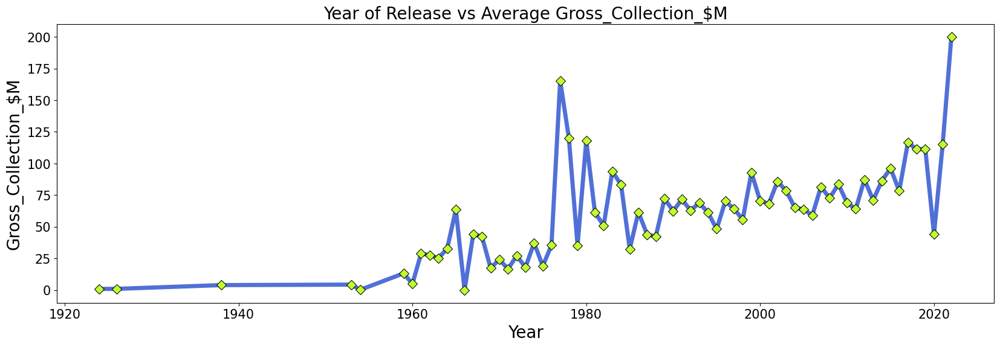

In [695]:
# Visualizing Year Vs Average Gross_Collection_$M in lineplot

tx = imdb.groupby('Year')['Gross_Collection_$M'].mean().sort_values(ascending=False)

plt.figure(figsize=(20,6))
rx = sns.lineplot(data =tx.reset_index(),x='Year',y='Gross_Collection_$M',color="#5170d7",
            linestyle = 'solid',linewidth=5,marker="D",markersize=8,markerfacecolor="#c0fb2d",markeredgecolor="#000000")
plt.xlabel('Year',fontsize=20)
plt.xticks(fontsize=15)
plt.ylabel('Gross_Collection_$M',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Year of Release vs Average Gross_Collection_$M",fontsize=20)   
plt.show()

### Observations

From above lineplot, 

For Year Vs Total Gross Collection, movies which released between the year 2000 to 2022 have highest Total Gross_Collection

For Year Vs Average Gross Collection, movies which released in the year 2022 and 1977 have the highest 
Average Gross_Collection

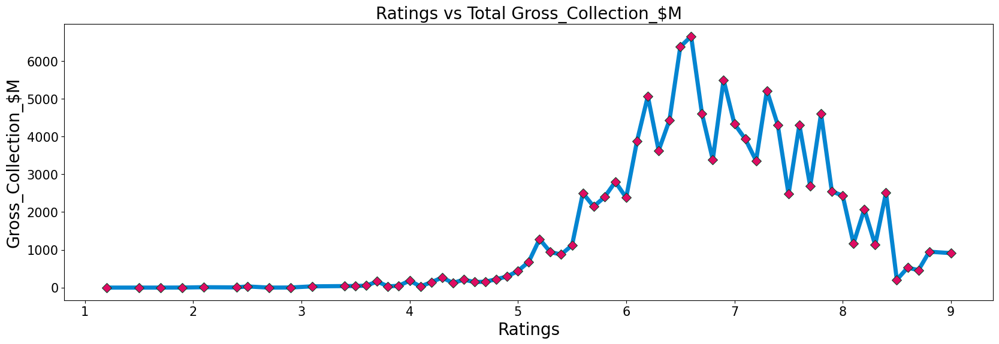

In [696]:
# Visualizing Ratings Vs Total Gross_Collection_$M in lineplot

tx = imdb.groupby('Ratings')['Gross_Collection_$M'].sum().sort_values(ascending=False)

plt.figure(figsize=(20,6))
rx = sns.lineplot(data =tx.reset_index(),x='Ratings',y='Gross_Collection_$M',color="#0485d1",
            linestyle = 'solid',linewidth=5,marker="D",markersize=8,markerfacecolor="#de0c62",markeredgecolor="#05472a")
plt.xlabel('Ratings',fontsize=20)
plt.xticks(fontsize=15)
plt.ylabel('Gross_Collection_$M',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Ratings vs Total Gross_Collection_$M",fontsize=20)   
plt.show()

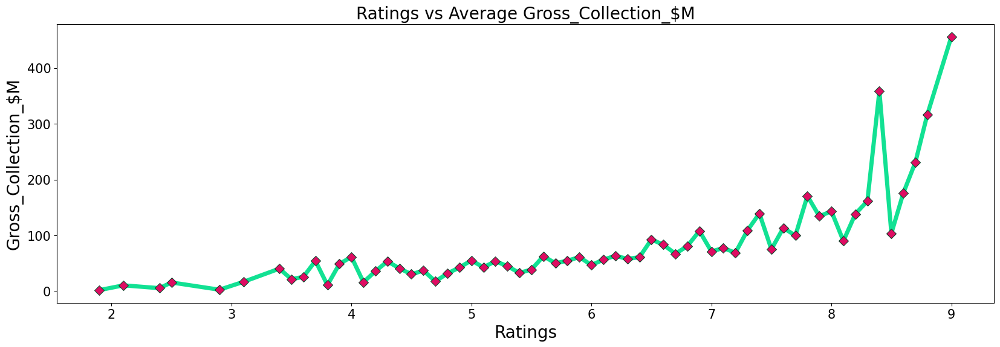

In [697]:
# Visualizing Ratings Vs Average Gross_Collection_$M in lineplot

tx = imdb.groupby('Ratings')['Gross_Collection_$M'].mean().sort_values(ascending=False)

plt.figure(figsize=(20,6))
rx = sns.lineplot(data =tx.reset_index(),x='Ratings',y='Gross_Collection_$M',color="#12e193",
            linestyle = 'solid',linewidth=5,marker="D",markersize=8,markerfacecolor="#de0c62",markeredgecolor="#05472a")
plt.xlabel('Ratings',fontsize=20)
plt.xticks(fontsize=15)
plt.ylabel('Gross_Collection_$M',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Ratings vs Average Gross_Collection_$M",fontsize=20)   
plt.show()

### Observations

From above lineplot, it can be observed

For Ratings Vs Total Gross Collection, movie ratings between 6 to 8 have the highest Total Gross_Collection

For Ratings Vs Average Gross Collection, movies which have high ratings tends to have higher Gross Collection and 
ratings above 8.5 have the highest Gross_Collection

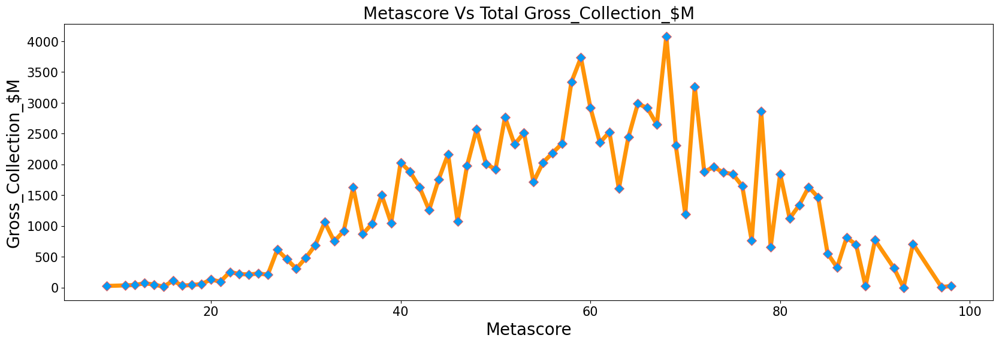

In [698]:
# Visualizing Metascore Vs Total Gross_Collection_$M in lineplot


tx = imdb.groupby('Metascore')['Gross_Collection_$M'].sum().sort_values(ascending=False)

plt.figure(figsize=(20,6))
rx = sns.lineplot(data =tx.reset_index(),x='Metascore',y='Gross_Collection_$M',color="#ff9408",
            linestyle = 'solid',linewidth=5,marker="D",markersize=8,markerfacecolor="#069af3",markeredgecolor="#fc5a50")
plt.xlabel('Metascore',fontsize=20)
plt.xticks(fontsize=15)
plt.ylabel('Gross_Collection_$M',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Metascore Vs Total Gross_Collection_$M",fontsize=20)
plt.show()

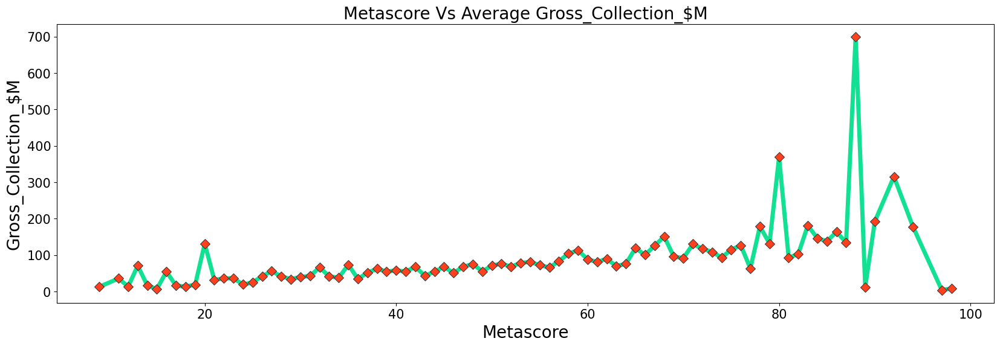

In [699]:
# Visualizing Metascore Vs Average Gross_Collection_$M in lineplot


tx = imdb.groupby('Metascore')['Gross_Collection_$M'].mean().sort_values(ascending=False)

plt.figure(figsize=(20,6))
rx = sns.lineplot(data =tx.reset_index(),x='Metascore',y='Gross_Collection_$M',color="#12e193",
            linestyle = 'solid',linewidth=5,marker="D",markersize=8,markerfacecolor="#fd411e",markeredgecolor="#343837")
plt.xlabel('Metascore',fontsize=20)
plt.xticks(fontsize=15)
plt.ylabel('Gross_Collection_$M',fontsize=20)
plt.yticks(fontsize=15)
plt.title("Metascore Vs Average Gross_Collection_$M",fontsize=20)
plt.show()

### Observations

From above lineplot, it can be observed

For Metascore Vs Total Gross Collection, movie ratings between 40 to 80 have the highest Total Gross_Collection

For Ratings Vs Average Gross Collection, movies which have high metascore tends to have higher Gross Collection and metascores above 80 have the highest Gross_Collection

# Data Feature Selection and Engineering

In [700]:
# Dropping 'Director_1','Director_2','Movie_Name','Sno','Popularity','Stars','Genre_1','Genre_2','Genre_3' from the dataset

imdb.drop(['Director_1','Director_2','Movie_Name','Stars','Genre_1','Genre_2','Genre_3'],axis=1,inplace=True)

### Observations

Dropped Features 'Director_1','Director_2','Movie_Name','Stars','Genre_1','Genre_2','Genre_3 for below reasons

'Director_1','Director_2' - As we have Director Name(combined) and moreover Director_2 have 93% null values

'Movie_Name' - As we have 1750 unique movie name it wont be much relevant in converting(Encodinig) them for Model Prediction

'Stars' - Dropped stars as we have already bifurcated into 4 categories

'Genre_1','Genre_2','Genre_3' - Dropped the categories, to proceed with combined Genre's for better Model Prediction

In [701]:
# Creating new features from Director_Name 
#'Director_Avg_Ratings','Director_Avg_Metascore','Director_Avg_Votes' and 'Director_Avg_Gross_Collection_$M'

director_stats = imdb.groupby('Director_Name').agg({
    'Ratings': 'mean',
    'Metascore': 'mean',
    'Votes': 'mean',
    'Gross_Collection_$M': 'mean'
})

# Create new columns for each average feature
imdb['Director_Avg_Ratings'] = imdb['Director_Name'].map(director_stats['Ratings'])
imdb['Director_Avg_Metascore'] = imdb['Director_Name'].map(director_stats['Metascore'])
imdb['Director_Avg_Votes'] = imdb['Director_Name'].map(director_stats['Votes'])
imdb['Director_Avg_Gross_Collection_$M'] = imdb['Director_Name'].map(director_stats['Gross_Collection_$M'])

imdb.shape

(1750, 17)

In [702]:
# Creating new features from star_1 
#'Star_1_Avg_Ratings', 'Star_1_Avg_Metascore', 'Star_1_Avg_Votes' and 'Star_1_Avg_Gross_Collection_$M'

Star_1_stats = imdb.groupby('Star_1').agg({
    'Ratings': 'mean',
    'Metascore': 'mean',
    'Votes': 'mean',
    'Gross_Collection_$M': 'mean'
})

# Create new columns for each average feature
imdb['Star_1_Avg_Ratings'] = imdb['Star_1'].map(Star_1_stats['Ratings'])
imdb['Star_1_Avg_Metascore'] = imdb['Star_1'].map(Star_1_stats['Metascore'])
imdb['Star_1_Avg_Votes'] = imdb['Star_1'].map(Star_1_stats['Votes'])
imdb['Star_1_Avg_Gross_Collection_$M'] = imdb['Star_1'].map(Star_1_stats['Gross_Collection_$M'])

imdb.shape

(1750, 21)

In [703]:
# Creating new features from Star_2
# 'Star_2_Avg_Ratings', 'Star_2_Avg_Metascore', 'Star_2_Avg_Votes' and 'Star_2_Avg_Gross_Collection_$M'

Star_2_stats = imdb.groupby('Star_2').agg({
    'Ratings': 'mean',
    'Metascore': 'mean',
    'Votes': 'mean',
    'Gross_Collection_$M': 'mean'
})

# Create new columns for each average feature
imdb['Star_2_Avg_Ratings'] = imdb['Star_2'].map(Star_2_stats['Ratings'])
imdb['Star_2_Avg_Metascore'] = imdb['Star_2'].map(Star_2_stats['Metascore'])
imdb['Star_2_Avg_Votes'] = imdb['Star_2'].map(Star_2_stats['Votes'])
imdb['Star_2_Avg_Gross_Collection_$M'] = imdb['Star_2'].map(Star_2_stats['Gross_Collection_$M'])

imdb.shape

(1750, 25)

In [704]:
# Creating new features from Star_3
# 'Star_3_Avg_Ratings', 'Star_3_Avg_Metascore', 'Star_3_Avg_Votes' and 'Star_3_Avg_Gross_Collection_$M'


Star_3_stats = imdb.groupby('Star_3').agg({
    'Ratings': 'mean',
    'Metascore': 'mean',
    'Votes': 'mean',
    'Gross_Collection_$M': 'mean'
})

# Create new columns for each average feature
imdb['Star_3_Avg_Ratings'] = imdb['Star_3'].map(Star_3_stats['Ratings'])
imdb['Star_3_Avg_Metascore'] = imdb['Star_3'].map(Star_3_stats['Metascore'])
imdb['Star_3_Avg_Votes'] = imdb['Star_3'].map(Star_3_stats['Votes'])
imdb['Star_3_Avg_Gross_Collection_$M'] = imdb['Star_3'].map(Star_3_stats['Gross_Collection_$M'])

imdb.shape

(1750, 29)

In [705]:
# Creating new features from Star_4
# 'Star_4_Avg_Ratings', 'Star_4_Avg_Metascore', 'Star_4_Avg_Votes' and 'Star_4_Avg_Gross_Collection_$M'

Star_4_stats = imdb.groupby('Star_4').agg({
    'Ratings': 'mean',
    'Metascore': 'mean',
    'Votes': 'mean',
    'Gross_Collection_$M': 'mean'
})

# Create new columns for each average feature
imdb['Star_4_Avg_Ratings'] = imdb['Star_4'].map(Star_4_stats['Ratings'])
imdb['Star_4_Avg_Metascore'] = imdb['Star_4'].map(Star_4_stats['Metascore'])
imdb['Star_4_Avg_Votes'] = imdb['Star_4'].map(Star_4_stats['Votes'])
imdb['Star_4_Avg_Gross_Collection_$M'] = imdb['Star_4'].map(Star_4_stats['Gross_Collection_$M'])

imdb.shape

(1750, 33)

### Observations

Created new features from Director_Name, Star_1, Star_2, Star_3 and Star_4 by calculating the average of Ratings, Metascore,
Votes and Gross_Collection_$M for better Model performance

Director_Name - 'Director_Avg_Ratings','Director_Avg_Metascore','Director_Avg_Votes' and 'Director_Avg_Gross_Collection_$M'

Star_1 - 'Star_1_Avg_Ratings', 'Star_1_Avg_Metascore', 'Star_1_Avg_Votes' and 'Star_1_Avg_Gross_Collection_$M'

Star_2 - 'Star_2_Avg_Ratings', 'Star_2_Avg_Metascore', 'Star_2_Avg_Votes' and 'Star_2_Avg_Gross_Collection_$M'

Star_3 - 'Star_3_Avg_Ratings', 'Star_3_Avg_Metascore', 'Star_3_Avg_Votes' and 'Star_3_Avg_Gross_Collection_$M'

Star_4 - 'Star_4_Avg_Ratings', 'Star_4_Avg_Metascore', 'Star_4_Avg_Votes' and 'Star_4_Avg_Gross_Collection_$M'

In [706]:
# Checking the null values in the dataset

imdb.isnull().sum()

Director_Name                         0
Duration                              0
Year                                  0
Ratings                               0
Metascore                           184
Star_1                                0
Star_2                                1
Star_3                                1
Star_4                                2
Votes                                 0
Genre                                 0
Gross_Collection_$M                 279
Certification                        10
Director_Avg_Ratings                  0
Director_Avg_Metascore              147
Director_Avg_Votes                    0
Director_Avg_Gross_Collection_$M    190
Star_1_Avg_Ratings                    0
Star_1_Avg_Metascore                120
Star_1_Avg_Votes                      0
Star_1_Avg_Gross_Collection_$M      145
Star_2_Avg_Ratings                    1
Star_2_Avg_Metascore                150
Star_2_Avg_Votes                      1
Star_2_Avg_Gross_Collection_$M      214


## Treating null values with Simple Imputer

In [707]:
# Replacing Null values for Metascore with Mean

from sklearn.impute import SimpleImputer

imp = SimpleImputer(missing_values = np.NaN, strategy = "mean")
imdb['Metascore'] = imp.fit_transform(imdb['Metascore'].values.reshape(-1,1))
imdb['Director_Avg_Metascore'] = imp.fit_transform(imdb['Director_Avg_Metascore'].values.reshape(-1,1))
imdb['Star_1_Avg_Metascore'] = imp.fit_transform(imdb['Star_1_Avg_Metascore'].values.reshape(-1,1))
imdb['Star_2_Avg_Metascore'] = imp.fit_transform(imdb['Star_2_Avg_Metascore'].values.reshape(-1,1))
imdb['Star_3_Avg_Metascore'] = imp.fit_transform(imdb['Star_3_Avg_Metascore'].values.reshape(-1,1))
imdb['Star_4_Avg_Metascore'] = imp.fit_transform(imdb['Star_4_Avg_Metascore'].values.reshape(-1,1))

In [708]:
# Replacing Null values for Gross_Collection_$M with Median

imp = SimpleImputer(missing_values = np.NaN, strategy = "median")
imdb["Gross_Collection_$M"] = imp.fit_transform(imdb["Gross_Collection_$M"].values.reshape(-1,1))
imdb["Director_Avg_Gross_Collection_$M"] = imp.fit_transform(imdb["Director_Avg_Gross_Collection_$M"].values.reshape(-1,1))
imdb["Star_1_Avg_Gross_Collection_$M"] = imp.fit_transform(imdb["Star_1_Avg_Gross_Collection_$M"].values.reshape(-1,1))
imdb["Star_2_Avg_Gross_Collection_$M"] = imp.fit_transform(imdb["Star_2_Avg_Gross_Collection_$M"].values.reshape(-1,1))
imdb["Star_3_Avg_Gross_Collection_$M"] = imp.fit_transform(imdb["Star_3_Avg_Gross_Collection_$M"].values.reshape(-1,1))
imdb["Star_4_Avg_Gross_Collection_$M"] = imp.fit_transform(imdb["Star_4_Avg_Gross_Collection_$M"].values.reshape(-1,1))

In [709]:
# Replacing Null values for Certification with Most_frequent

imp = SimpleImputer(missing_values = np.NaN, strategy = "most_frequent")
imdb["Certification"] = imp.fit_transform(imdb["Certification"].values.reshape(-1,1))

In [710]:
# Checking the dataset for null values after imputation

null_rows = imdb[imdb.isnull().any(axis=1)]
null_rows.shape

(2, 33)

In [711]:
# Dropping the rows with null values

imdb = imdb.dropna()
imdb.shape

(1748, 33)

In [712]:
# Checking the dataset for null values

imdb.isnull().sum()

Director_Name                       0
Duration                            0
Year                                0
Ratings                             0
Metascore                           0
Star_1                              0
Star_2                              0
Star_3                              0
Star_4                              0
Votes                               0
Genre                               0
Gross_Collection_$M                 0
Certification                       0
Director_Avg_Ratings                0
Director_Avg_Metascore              0
Director_Avg_Votes                  0
Director_Avg_Gross_Collection_$M    0
Star_1_Avg_Ratings                  0
Star_1_Avg_Metascore                0
Star_1_Avg_Votes                    0
Star_1_Avg_Gross_Collection_$M      0
Star_2_Avg_Ratings                  0
Star_2_Avg_Metascore                0
Star_2_Avg_Votes                    0
Star_2_Avg_Gross_Collection_$M      0
Star_3_Avg_Ratings                  0
Star_3_Avg_M

In [713]:
# Separating dataset into Categorical and Numerical

imdb_cat = []
imdb_num = []

for i in imdb.columns:
    if (imdb.dtypes[i] == 'object'):
        imdb_cat.append(i)
        
for i in imdb.columns:
    if (imdb.dtypes[i] != 'object'):
        imdb_num.append(i)
        
print("IMDB_Categorical Columns\n",imdb_cat,"\n")
print("IMDB_Numerical Columns\n",imdb_num)
print("Length\n",len(imdb_num))

IMDB_Categorical Columns
 ['Director_Name', 'Star_1', 'Star_2', 'Star_3', 'Star_4', 'Genre', 'Certification'] 

IMDB_Numerical Columns
 ['Duration', 'Year', 'Ratings', 'Metascore', 'Votes', 'Gross_Collection_$M', 'Director_Avg_Ratings', 'Director_Avg_Metascore', 'Director_Avg_Votes', 'Director_Avg_Gross_Collection_$M', 'Star_1_Avg_Ratings', 'Star_1_Avg_Metascore', 'Star_1_Avg_Votes', 'Star_1_Avg_Gross_Collection_$M', 'Star_2_Avg_Ratings', 'Star_2_Avg_Metascore', 'Star_2_Avg_Votes', 'Star_2_Avg_Gross_Collection_$M', 'Star_3_Avg_Ratings', 'Star_3_Avg_Metascore', 'Star_3_Avg_Votes', 'Star_3_Avg_Gross_Collection_$M', 'Star_4_Avg_Ratings', 'Star_4_Avg_Metascore', 'Star_4_Avg_Votes', 'Star_4_Avg_Gross_Collection_$M']
Length
 26


### Observations

Used Simple Imputer to treat null values in the dataset

Applied 'Mean' to 'Metascore', 'Director_Avg_Metascore', 'Star_1_Avg_Metascore', 'Star_2_Avg_Metascore', 'Star_3_Avg_Metascore' and 'Star_4_Avg_Metascore' as the data is almost normally distributed

Applied 'Median' to 'Gross_Collection_$M', 'Director_Avg_Gross_Collection_M', 'Star_1_Avg_Gross_Collection_M', 'Star_2_Avg_Gross_Collection_M', 'Star_3_Avg_Gross_Collection_M' and 'Star_4_Avg_Gross_Collection_M' as the distribution are skewed towards the right

Applied 'Most_Frequent' for 'Certification' as it is a categorical feature

Dropped rows(Star_4) which have null values

Dataset now contains zero null values

After adding new features, dataset contains 1748 rows and 33 columns

Separated dataset into Cartegorical and Numerical based on the data types of the features

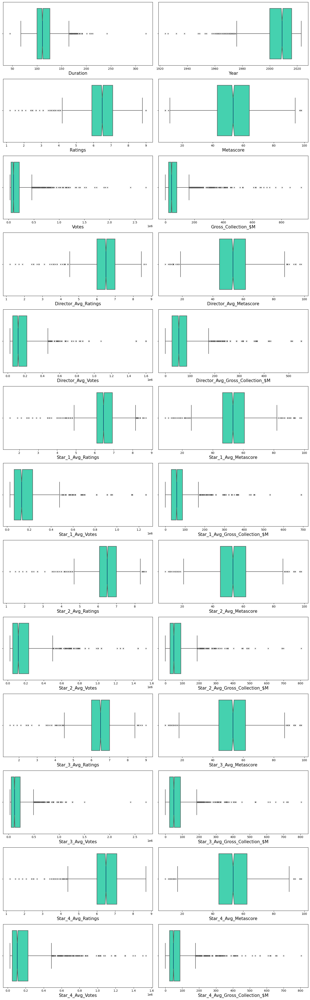

In [714]:
# Visualizing the IMDB_Numerical features with Boxplot to check outliers

plt.figure(figsize=(15,48))
for i, col in enumerate(imdb_num[:26]):
    plt.subplot(13,2, i+1)
    sns.boxplot(data=imdb, x=col, color='#2ee8bb', notch=True, medianprops={"color": "#042e60"}, flierprops={"marker": "x"})
    plt.xlabel(col, fontsize=15)

plt.tight_layout()

### Observations

From above boxplot, we can observe presence of Outliers

Below are the features with Outliers

'Duration', 'Year', 'Ratings', 'Metascore', 'Votes', 'Gross_Collection_$M', 'Director_Avg_Ratings', 
'Director_Avg_Metascore', 'Director_Avg_Votes', 'Director_Avg_Gross_Collection_M', 'Star_1_Avg_Ratings', 
'Star_1_Avg_Metascore', 'Star_1_Avg_Votes', 'Star_1_Avg_Gross_Collection_M', 'Star_2_Avg_Ratings', 
'Star_2_Avg_Metascore', 'Star_2_Avg_Votes', 'Star_2_Avg_Gross_Collection_M', 'Star_3_Avg_Ratings', 
'Star_3_Avg_Metascore', 'Star_3_Avg_Votes', 'Star_3_Avg_Gross_Collection_M', 'Star_4_Avg_Ratings', 
'Star_4_Avg_Metascore', 'Star_4_Avg_Votes', 'Star_4_Avg_Gross_Collection_M'

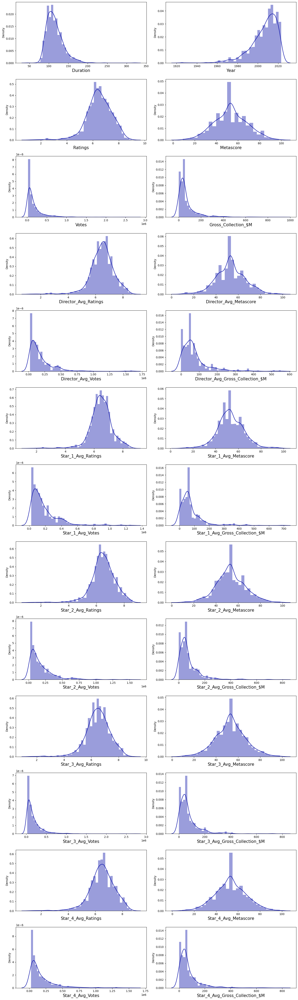

In [715]:
# Visualizing the IMDB_Numerical features with Distplot to check distribution of data

plt.figure(figsize=(15,50))
for i, col in enumerate(imdb_num[:26]):
    plt.subplot(13,2, i+1)
    sns.distplot(imdb[col],color='#030aa7')    
    plt.xlabel(col, fontsize=15)

plt.tight_layout()

### Observations

From above distplot, we can observe the distribution of the data

Features skewed towards right -  Duration, Votes, Gross_Collection_$M, Director_Avg_Votes, Star_1_Avg_Votes,
Star_2_Avg_Votes, Star_3_Avg_Votes, Star_4_Avg_Votes, Director_Avg_Gross_Collection_M, Star_1_Avg_Gross_Collection_M,
Star_2_Avg_Gross_Collection_M, Star_3_Avg_Gross_Collection_M, Star_4_Avg_Gross_Collection_M

Features skewed towards left - Year, Ratings, Director_Avg_Ratings, Star_1_Avg_Ratings, Star_2_Avg_Ratings,
Star_3_Avg_Ratings, Star_4_Avg_Ratings

Normal distribution - Metascore, Director_Avg_Metascore, Star_1_Avg_Metascore, Star_2_Avg_Metascore, Star_3_Avg_Metascore,
Star_4_Avg_Metascore

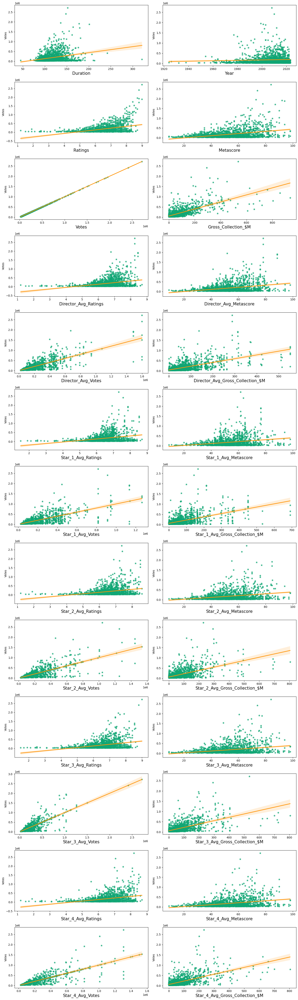

In [716]:
# Visualizing the IMDB_Numerical features with regplot to check the relationship with target variable Votes

plt.figure(figsize=(15,50))
for i, col in enumerate(imdb_num[:26]):
    plt.subplot(13,2, i+1)
    sns.regplot(x=imdb[col],y=imdb['Votes'],scatter_kws={"color": "#10a674"}, 
                line_kws={"color": "#ff9408"},marker='*')   
    plt.xlabel(col, fontsize=15)

plt.tight_layout()

### Observations

Based on above regplot, we can observe below relationship with the target variable 'Votes'

Features with strong positive relationship with Votes - Duration, Ratings, Gross_Collection_$M, Director_Avg_Ratings,
Star_1_Avg_Ratings, Star_2_Avg_Ratings, Star_3_Avg_Ratings, Star_4_Avg_Ratings, Director_Avg_Gross_Collection,
Star_1_Avg_Gross_Collection, Star_2_Avg_Gross_Collection, Star_3_Avg_Gross_Collection, Star_24_Avg_Gross_Collection,
Director_Avg_Votes, Star_1_Avg_Votes, Star_2_Avg_Votes, Star_3_Avg_Votes, Star_4_Avg_Votes

Features with positive relationship with Votes - Metascore, Director_Avg_Metascore, Star_1_Avg_Metascore, 
Star_2_Avg_Metascore, Star_3_Avg_Metascore, Star_4_Avg_Metascore

Regression Line for Year is flat, which indicates no relationship with the target Variable Votes

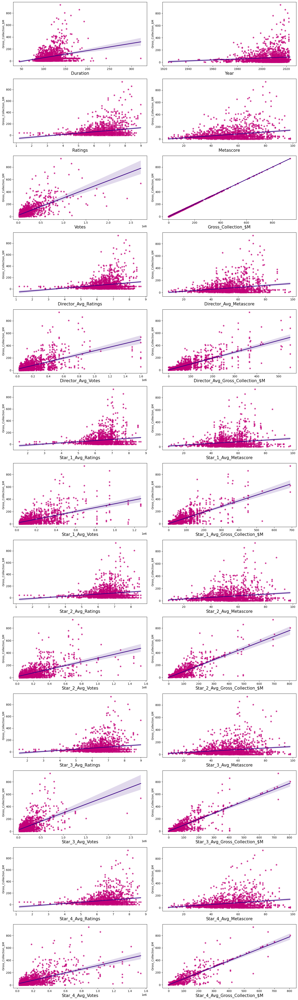

In [717]:
# Visualizing the IMDB_Numerical features with regplot to check relationship with target variable Gross_Collection_$M

plt.figure(figsize=(15,50))
for i, col in enumerate(imdb_num[:26]):
    plt.subplot(13,2, i+1)
    sns.regplot(x=imdb[col],y=imdb['Gross_Collection_$M'],scatter_kws={"color": "#c20078"}, 
                line_kws={"color": "#380282"},marker='*')   
    plt.xlabel(col, fontsize=15)

plt.tight_layout()

### Observations

Based on above regplot, we can observe below relationship with the target variable 'Gross_Collection_$M'

Features with strong positive relationship with Votes - Duration, Votes,Director_Avg_Gross_Collection, Star_1_Avg_Gross_Collection, Star_2_Avg_Gross_Collection, Star_3_Avg_Gross_Collection, Star_24_Avg_Gross_Collection,
Director_Avg_Votes, Star_1_Avg_Votes, Star_2_Avg_Votes, Star_3_Avg_Votes, Star_4_Avg_Votes

Features with positive relationship with Votes - Metascore, Director_Avg_Metascore, Star_1_Avg_Metascore, 
Star_2_Avg_Metascore, Star_3_Avg_Metascore, Star_4_Avg_Metascore, Ratings, Director_Avg_Ratings, Star_1_Avg_Ratings,
Star_2_Avg_Ratings, Star_3_Avg_Ratings, Star_4_Avg_Ratings,

Regression Line for Year is flat, which indicates no relationship with the target Variable Gross_Collection_$M

## Label Encoding

In [718]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

for i in imdb.columns:
    if (imdb[i].dtypes == 'object'):
        imdb[i] = le.fit_transform(imdb[i].values.reshape(-1,1))
imdb.head(5)

,Director_Name,Duration,Year,Ratings,Metascore,Star_1,Star_2,Star_3,Star_4,Votes,Genre,Gross_Collection_$M,Certification,Director_Avg_Ratings,Director_Avg_Metascore,Director_Avg_Votes,Director_Avg_Gross_Collection_$M,Star_1_Avg_Ratings,Star_1_Avg_Metascore,Star_1_Avg_Votes,Star_1_Avg_Gross_Collection_$M,Star_2_Avg_Ratings,Star_2_Avg_Metascore,Star_2_Avg_Votes,Star_2_Avg_Gross_Collection_$M,Star_3_Avg_Ratings,Star_3_Avg_Metascore,Star_3_Avg_Votes,Star_3_Avg_Gross_Collection_$M,Star_4_Avg_Ratings,Star_4_Avg_Metascore,Star_4_Avg_Votes,Star_4_Avg_Gross_Collection_$M
0,539,141,2023,6.3,55.0,688,782,523,650,34473,4,43.06,8,6.366667,52.166667,207880.5,74.4420,6.205882,47.882353,202007.411765,124.303750,6.283333,52.500,159958.333333,80.865000,6.400000,57.500000,68795.5,32.000,6.725,56.25,281042.0,169.81
1,372,150,2023,8.2,64.0,118,205,148,1071,151932,3,43.06,8,7.540000,65.800000,508236.4,194.7825,7.022222,60.888889,434347.555556,361.914286,8.200000,64.000,151932.000000,50.695000,7.433333,63.333333,469095.0,173.465,8.200,64.00,151932.0,48.38
2,131,169,2023,8.0,78.0,367,659,417,763,184574,38,43.06,10,7.600000,75.333333,350917.0,131.5250,6.928571,59.214286,446154.785714,100.057500,6.875000,55.125,458634.000000,116.851667,8.000000,78.000000,184574.0,50.690,8.000,78.00,184574.0,48.38
3,429,134,2023,7.3,72.0,117,782,1024,681,116875,3,43.06,8,7.100000,69.000000,180747.5,69.1800,6.962500,66.857143,224618.875000,120.600000,6.283333,52.500,159958.333333,80.865000,7.300000,72.000000,116875.0,50.690,6.700,61.50,222129.5,417.72
4,695,124,2023,6.1,48.0,517,339,845,926,163120,3,43.06,8,6.800000,60.666667,427169.0,198.4250,6.800000,60.666667,427169.000000,198.425000,6.700000,58.000,309592.666667,151.060000,6.100000,48.000000,163120.0,50.690,6.100,48.00,163120.0,48.38


### Observations

Encoded categorical features to numerical by Label Encoder

## Describe - Statistical Summary

In [719]:
# Checking the statistical summary of the dataset

imdb.describe().T

,count,mean,std,min,25%,50%,75%,max
Director_Name,1748.0,497.205950,269.691889,0.0,274.750000,504.500000,733.000000,9.480000e+02
Duration,1748.0,115.318078,21.732899,45.0,100.000000,111.000000,126.250000,3.210000e+02
Year,1748.0,2006.077803,13.255307,1924.0,2000.000000,2009.000000,2016.000000,2.023000e+03
Ratings,1748.0,6.479462,0.995322,1.2,5.900000,6.500000,7.100000,9.000000e+00
Metascore,1748.0,53.323483,15.338220,9.0,43.000000,53.344828,64.000000,9.800000e+01
Star_1,1748.0,358.576659,209.083867,0.0,172.000000,348.500000,553.000000,7.220000e+02
Star_2,1748.0,584.986270,329.763567,0.0,302.750000,586.500000,873.000000,1.160000e+03
Star_3,1748.0,655.879291,383.023844,0.0,323.750000,645.500000,989.250000,1.325000e+03
Star_4,1748.0,717.201373,423.115353,0.0,349.750000,707.500000,1088.250000,1.443000e+03
Votes,1748.0,180882.958810,236505.342332,25019.0,47333.250000,96362.000000,212288.500000,2.718780e+06


### Observations

Count is same across all the features

Outliers are present across all the numerical features as the difference between 75% to Max is very high

Mean is greater then Median for the features Duration, Votes, Gross_Collection_$M , Director_Avg_Votes , Director_Avg_Gross_Collection,  Star_1_Avg_Votes , Star_1_Avg_Gross_Collection ,  Star_2_Avg_Votes , Star_2_Avg_Gross_Collection , Star_3_Avg_Votes , Star_3_Avg_Gross_Collection , Star_4_Avg_Votes , Star_4_Avg_Gross_Collection  which shows these features are skewed towards right

Year is skewed towards left as the Mean is less than Median

## Correlation Analysis

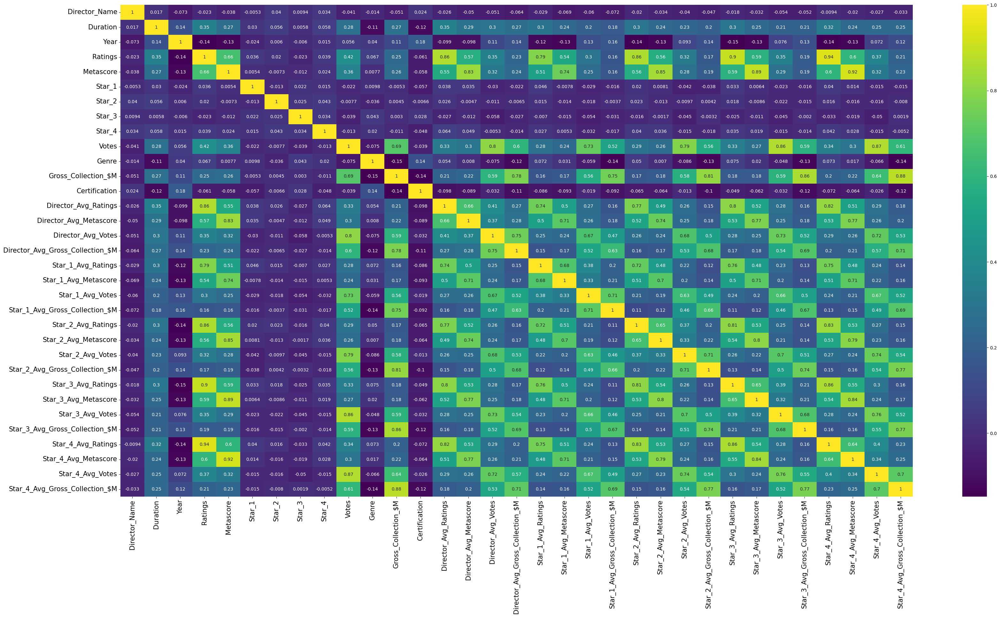

In [720]:
# Visualizing correlation of the dataset in heatmap

plt.figure(figsize=(40,20))
sns.heatmap(imdb.corr(),annot=True,cmap='viridis')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()

### Observations

From above heatmap, we can observe the correlation of the features with each other

Features which was created additionally by the average of Ratings, Metascore, Votes and Gross_Collection are highly 
positively correlated with each other

All the categorical features Star_1, Star_2, Star_3, Star_4, Genre and Certification are having negative correlation with the other features

Year is having strong negative correlation with Ratings, Metascore and their average features which was created additionally

<function matplotlib.pyplot.show(close=None, block=None)>

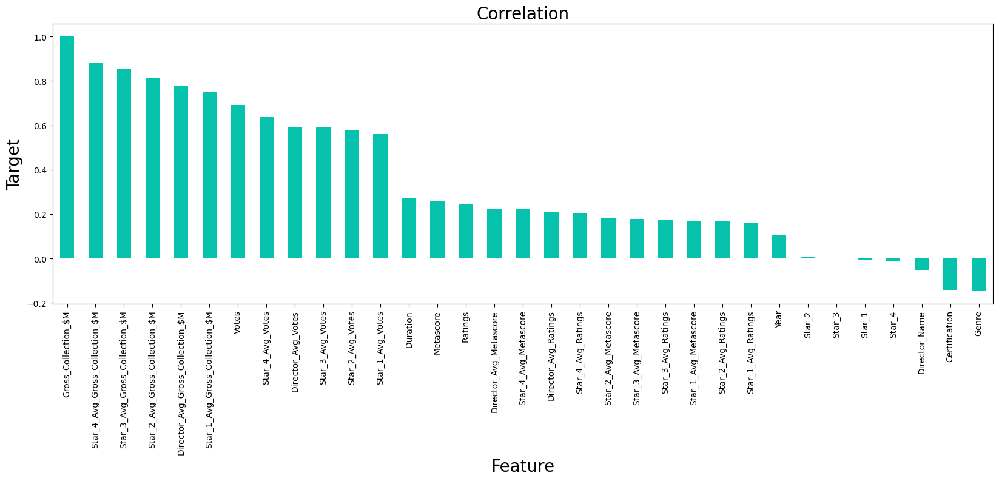

In [721]:
# Visualizing the correlation of the features with target variable 'Gross_Collection_$M'

plt.figure(figsize=(20,6))
imdb.corr()['Gross_Collection_$M'].sort_values(ascending=False).plot(kind='bar',color='#06c2ac')
plt.xlabel('Feature',fontsize=20)
plt.ylabel('Target',fontsize=20)
plt.title('Correlation',fontsize=20)
plt.show

In [722]:
# Checking the correlation of the target variable 'Gross_Collection_$M'

imdb.corr()['Gross_Collection_$M'].sort_values()

Genre                              -0.148471
Certification                      -0.140856
Director_Name                      -0.050996
Star_4                             -0.010931
Star_1                             -0.005299
Star_3                              0.002956
Star_2                              0.004521
Year                                0.106618
Star_1_Avg_Ratings                  0.157717
Star_2_Avg_Ratings                  0.166220
Star_1_Avg_Metascore                0.168210
Star_3_Avg_Ratings                  0.175785
Star_3_Avg_Metascore                0.177962
Star_2_Avg_Metascore                0.181125
Star_4_Avg_Ratings                  0.204311
Director_Avg_Ratings                0.211516
Star_4_Avg_Metascore                0.221370
Director_Avg_Metascore              0.224024
Ratings                             0.246086
Metascore                           0.256730
Duration                            0.274294
Star_1_Avg_Votes                    0.561968
Star_2_Avg

### Observations

Features which are positively correlated with 'Gross_Collection_$M' are 'Star_2', 'Star_3', 'Duration', 'Year', 'Ratings', 
'Metascore', 'Votes', 'Director_Avg_Ratings', 'Director_Avg_Metascore', 'Director_Avg_Votes', 'Director_Avg_Gross_Collection', 
'Star_1_Avg_Ratings', 'Star_1_Avg_Metascore', 'Star_1_Avg_Votes', 'Star_1_Avg_Gross_Collection', 
'Star_2_Avg_Ratings', 'Star_2_Avg_Metascore', 'Star_2_Avg_Votes', 'Star_2_Avg_Gross_Collection', 
'Star_3_Avg_Ratings', 'Star_3_Avg_Metascore', 'Star_3_Avg_Votes', 'Star_3_Avg_Gross_Collection', 
'Star_4_Avg_Ratings', 'Star_4_Avg_Metascore', 'Star_4_Avg_Votes', 'Star_4_Avg_Gross_Collection

Features which are negatively correlated with 'Gross_Collection_$M' are 'Genre', 'Certification','Director_Name', 'Star_4' and 'Star_1'


<function matplotlib.pyplot.show(close=None, block=None)>

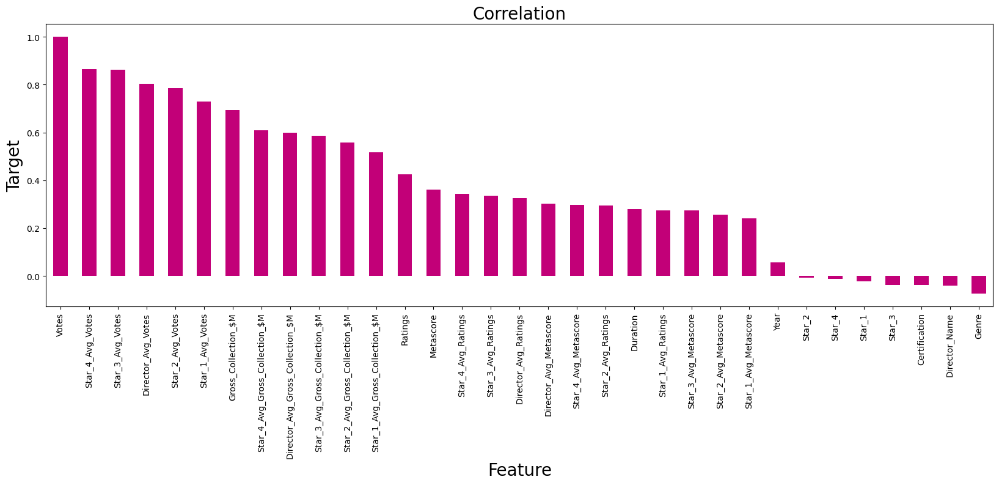

In [723]:
# Visualizing the correlation of the features with target variable 'Votes'

plt.figure(figsize=(20,6))
imdb.corr()['Votes'].sort_values(ascending=False).plot(kind='bar',color='#c20078')
plt.xlabel('Feature',fontsize=20)
plt.ylabel('Target',fontsize=20)
plt.title('Correlation',fontsize=20)
plt.show

In [724]:
# Checking the correlation of the target variable 'Votes'

imdb.corr()['Votes'].sort_values()

Genre                              -0.075021
Director_Name                      -0.041289
Certification                      -0.039151
Star_3                             -0.038626
Star_1                             -0.022462
Star_4                             -0.013133
Star_2                             -0.007657
Year                                0.056147
Star_1_Avg_Metascore                0.241750
Star_2_Avg_Metascore                0.255877
Star_3_Avg_Metascore                0.272986
Star_1_Avg_Ratings                  0.275229
Duration                            0.280356
Star_2_Avg_Ratings                  0.294930
Star_4_Avg_Metascore                0.296057
Director_Avg_Metascore              0.301095
Director_Avg_Ratings                0.326065
Star_3_Avg_Ratings                  0.334557
Star_4_Avg_Ratings                  0.342980
Metascore                           0.361957
Ratings                             0.424413
Star_1_Avg_Gross_Collection_$M      0.518223
Star_2_Avg

### Observations

Features which are positively correlated with 'Votes' are 'Gross_Collection_$M','Duration', 'Year', 'Ratings', 
'Metascore', 'Director_Avg_Ratings', 'Director_Avg_Metascore', 'Director_Avg_Votes', 'Director_Avg_Gross_Collection', 
'Star_1_Avg_Ratings', 'Star_1_Avg_Metascore', 'Star_1_Avg_Votes', 'Star_1_Avg_Gross_Collection', 
'Star_2_Avg_Ratings', 'Star_2_Avg_Metascore', 'Star_2_Avg_Votes', 'Star_2_Avg_Gross_Collection', 
'Star_3_Avg_Ratings', 'Star_3_Avg_Metascore', 'Star_3_Avg_Votes', 'Star_3_Avg_Gross_Collection', 
'Star_4_Avg_Ratings', 'Star_4_Avg_Metascore', 'Star_4_Avg_Votes', 'Star_4_Avg_Gross_Collection

Features which are negatively correlated with 'Votes' are 'Genre', 'Certification', 'Director_Name', 'Star_2', 'Star_3', 'Star_4' and 'Star_1'

## Outliers Treatment

## Z Score Method

In [725]:
from scipy.stats import zscore

col = ['Duration', 'Year', 'Ratings', 'Metascore', 'Votes','Director_Avg_Ratings', 'Director_Avg_Metascore',
       'Director_Avg_Votes',  'Star_1_Avg_Ratings', 'Star_1_Avg_Metascore', 'Star_1_Avg_Votes',  'Star_2_Avg_Ratings', 
       'Star_2_Avg_Metascore', 'Star_2_Avg_Votes',  'Star_3_Avg_Ratings', 'Star_3_Avg_Metascore', 'Star_3_Avg_Votes',  
       'Star_4_Avg_Ratings', 'Star_4_Avg_Metascore', 'Star_4_Avg_Votes']

z1 = imdb[col]
z1.head(5)

,Duration,Year,Ratings,Metascore,Votes,Director_Avg_Ratings,Director_Avg_Metascore,Director_Avg_Votes,Star_1_Avg_Ratings,Star_1_Avg_Metascore,Star_1_Avg_Votes,Star_2_Avg_Ratings,Star_2_Avg_Metascore,Star_2_Avg_Votes,Star_3_Avg_Ratings,Star_3_Avg_Metascore,Star_3_Avg_Votes,Star_4_Avg_Ratings,Star_4_Avg_Metascore,Star_4_Avg_Votes
0,141,2023,6.3,55.0,34473,6.366667,52.166667,207880.5,6.205882,47.882353,202007.411765,6.283333,52.500,159958.333333,6.400000,57.500000,68795.5,6.725,56.25,281042.0
1,150,2023,8.2,64.0,151932,7.540000,65.800000,508236.4,7.022222,60.888889,434347.555556,8.200000,64.000,151932.000000,7.433333,63.333333,469095.0,8.200,64.00,151932.0
2,169,2023,8.0,78.0,184574,7.600000,75.333333,350917.0,6.928571,59.214286,446154.785714,6.875000,55.125,458634.000000,8.000000,78.000000,184574.0,8.000,78.00,184574.0
3,134,2023,7.3,72.0,116875,7.100000,69.000000,180747.5,6.962500,66.857143,224618.875000,6.283333,52.500,159958.333333,7.300000,72.000000,116875.0,6.700,61.50,222129.5
4,124,2023,6.1,48.0,163120,6.800000,60.666667,427169.0,6.800000,60.666667,427169.000000,6.700000,58.000,309592.666667,6.100000,48.000000,163120.0,6.100,48.00,163120.0


In [726]:
z = np.abs(zscore(z1))
threshold = 3
print(np.where(z>3))

(array([  11,   11,   13,   13,   14,   14,   29,   29,   29,   29,   29,
         29,   30,   32,   32,   32,   34,   34,   34,   34,   34,   34,
         36,   36,   36,   36,   36,   36,   42,   42,   42,   44,   46,
         46,   46,   46,   47,   47,   50,   54,   54,   56,   56,   56,
         56,   56,   56,   57,   58,   61,   61,   61,   62,   64,   64,
         64,   70,   70,   70,   76,   76,   76,   76,   76,   76,   78,
         78,   78,   79,   79,   81,   81,   95,   95,   95,   97,   97,
         97,   97,  100,  100,  100,  101,  103,  106,  119,  124,  124,
        124,  124,  124,  124,  125,  125,  125,  125,  125,  125,  131,
        131,  131,  131,  131,  132,  132,  132,  132,  132,  136,  136,
        136,  138,  138,  139,  139,  139,  141,  144,  144,  144,  151,
        153,  165,  165,  165,  167,  167,  167,  167,  167,  167,  171,
        171,  171,  172,  172,  172,  172,  172,  177,  177,  177,  182,
        182,  190,  191,  191,  191,  191,  192,  

In [727]:
imdb_z = imdb[(z<3).all(axis=1)]

In [728]:
imdb.shape

(1748, 33)

In [729]:
imdb_z.shape

(1567, 33)

In [730]:
# Data loss

data_loss = (1748-1567)/1748*100
data_loss

10.354691075514873

### Observations

Data loss is high when applying Z score method which is 10.35%, let's check with IQR method

## IQR Method

In [731]:
# Apply IQR method to remove outliers for each column

col2 = ['Duration', 'Year', 'Ratings', 'Metascore', 'Votes','Director_Avg_Ratings', 'Director_Avg_Metascore',
       'Director_Avg_Votes',  'Star_1_Avg_Ratings', 'Star_1_Avg_Metascore', 'Star_1_Avg_Votes',  'Star_2_Avg_Ratings', 
       'Star_2_Avg_Metascore', 'Star_2_Avg_Votes',  'Star_3_Avg_Ratings', 'Star_3_Avg_Metascore', 'Star_3_Avg_Votes',  
       'Star_4_Avg_Ratings', 'Star_4_Avg_Metascore', 'Star_4_Avg_Votes']

for i in col2:
    
    Q1 = imdb[i].quantile(0.25)
    Q3 = imdb[i].quantile(0.75)
    IQR = Q3 - Q1
    
    outlier_threshold = 1.5 * IQR

    imdb_new = imdb[(imdb[i] >= Q1 - outlier_threshold) & (imdb[i] <= Q3 + outlier_threshold)]

In [732]:
imdb.shape

(1748, 33)

In [733]:
imdb_new.shape

(1627, 33)

In [734]:
# Data Loss

data_loss =  (1748-1627)/1748*100
data_loss

6.922196796338673

### Observations

Proceeding with IQR method to remove outliers as the data loss is 6.92% which is in acceptable range

## Skewness

In [735]:
# Checking skewness of the dataset

imdb_new.skew()

Director_Name                      -0.118809
Duration                            1.606776
Year                               -1.479298
Ratings                            -0.902021
Metascore                           0.056096
Star_1                              0.021812
Star_2                             -0.010918
Star_3                              0.014955
Star_4                              0.020127
Votes                               2.172150
Genre                               0.586986
Gross_Collection_$M                 3.672199
Certification                      -0.112682
Director_Avg_Ratings               -1.048522
Director_Avg_Metascore              0.058296
Director_Avg_Votes                  2.644213
Director_Avg_Gross_Collection_$M    2.747653
Star_1_Avg_Ratings                 -0.992925
Star_1_Avg_Metascore                0.191050
Star_1_Avg_Votes                    2.342286
Star_1_Avg_Gross_Collection_$M      3.026755
Star_2_Avg_Ratings                 -1.015452
Star_2_Avg

In [736]:
# Applying SQRT method to reduce skewness for the below features

imdb_new['Director_Avg_Gross_Collection_$M']= np.sqrt(imdb_new['Director_Avg_Gross_Collection_$M'])
imdb_new['Star_1_Avg_Gross_Collection_$M']= np.sqrt(imdb_new['Star_1_Avg_Gross_Collection_$M'])
imdb_new['Star_2_Avg_Gross_Collection_$M']= np.sqrt(imdb_new['Star_2_Avg_Gross_Collection_$M'])
imdb_new['Star_3_Avg_Gross_Collection_$M']= np.sqrt(imdb_new['Star_3_Avg_Gross_Collection_$M'])
imdb_new['Star_4_Avg_Gross_Collection_$M']= np.sqrt(imdb_new['Star_4_Avg_Gross_Collection_$M'])

In [737]:
# Applying SQRT method to reduce skewness for the below features

imdb_new['Votes']= np.sqrt(imdb_new['Votes'])
imdb_new['Duration']= np.sqrt(imdb_new['Duration'])
imdb_new['Year']= np.sqrt(imdb_new['Year'])
imdb_new['Ratings']= np.sqrt(imdb_new['Ratings'])

imdb_new['Star_1_Avg_Ratings']= np.sqrt(imdb_new['Star_1_Avg_Ratings'])
imdb_new['Star_2_Avg_Ratings']= np.sqrt(imdb_new['Star_2_Avg_Ratings'])
imdb_new['Star_3_Avg_Ratings']= np.sqrt(imdb_new['Star_3_Avg_Ratings'])
imdb_new['Star_4_Avg_Ratings']= np.sqrt(imdb_new['Star_4_Avg_Ratings'])
imdb_new['Director_Avg_Ratings']= np.sqrt(imdb_new['Director_Avg_Ratings'])

imdb_new['Star_1_Avg_Votes']= np.sqrt(imdb_new['Star_1_Avg_Votes'])
imdb_new['Star_2_Avg_Votes']= np.sqrt(imdb_new['Star_2_Avg_Votes'])
imdb_new['Star_3_Avg_Votes']= np.sqrt(imdb_new['Star_3_Avg_Votes'])
imdb_new['Star_4_Avg_Votes']= np.sqrt(imdb_new['Star_4_Avg_Votes'])
imdb_new['Director_Avg_Votes']= np.sqrt(imdb_new['Director_Avg_Votes'])

In [738]:
# Checking Skewness

imdb_new.skew()

Director_Name                      -0.118809
Duration                            1.048525
Year                               -1.495650
Ratings                            -1.595088
Metascore                           0.056096
Star_1                              0.021812
Star_2                             -0.010918
Star_3                              0.014955
Star_4                              0.020127
Votes                               1.118063
Genre                               0.586986
Gross_Collection_$M                 3.672199
Certification                      -0.112682
Director_Avg_Ratings               -1.873590
Director_Avg_Metascore              0.058296
Director_Avg_Votes                  0.989780
Director_Avg_Gross_Collection_$M    0.515387
Star_1_Avg_Ratings                 -1.785892
Star_1_Avg_Metascore                0.191050
Star_1_Avg_Votes                    1.005270
Star_1_Avg_Gross_Collection_$M      0.596945
Star_2_Avg_Ratings                 -1.844825
Star_2_Avg

In [739]:
# Removing skewness using power transform 

from sklearn.preprocessing import PowerTransformer

skew =['Star_1_Avg_Ratings','Star_2_Avg_Ratings','Star_3_Avg_Ratings','Star_4_Avg_Ratings','Director_Avg_Ratings',
       'Ratings','Votes','Duration','Director_Avg_Votes','Star_1_Avg_Votes','Star_2_Avg_Votes','Star_3_Avg_Votes',
       'Star_4_Avg_Votes','Director_Avg_Gross_Collection_$M','Star_1_Avg_Gross_Collection_$M',
       'Star_2_Avg_Gross_Collection_$M','Star_3_Avg_Gross_Collection_$M','Star_4_Avg_Gross_Collection_$M']


pt = PowerTransformer(method='yeo-johnson',standardize=False)
imdb_new[skew] = pt.fit_transform(imdb_new[skew].values)

In [740]:
# Checking Skewness

imdb_new.skew()

Director_Name                      -0.118809
Duration                           -0.073602
Year                               -1.495650
Ratings                             0.038893
Metascore                           0.056096
Star_1                              0.021812
Star_2                             -0.010918
Star_3                              0.014955
Star_4                              0.020127
Votes                               0.066233
Genre                               0.586986
Gross_Collection_$M                 3.672199
Certification                      -0.112682
Director_Avg_Ratings                0.107280
Director_Avg_Metascore              0.058296
Director_Avg_Votes                  0.015073
Director_Avg_Gross_Collection_$M    0.017541
Star_1_Avg_Ratings                  0.155267
Star_1_Avg_Metascore                0.191050
Star_1_Avg_Votes                    0.010051
Star_1_Avg_Gross_Collection_$M      0.050035
Star_2_Avg_Ratings                  0.095864
Star_2_Avg

### Observations

Skewness was high for the following features

'Star_1_Avg_Ratings','Star_2_Avg_Ratings','Star_3_Avg_Ratings','Star_4_Avg_Ratings','Director_Avg_Ratings',
       'Ratings','Votes','Year','Duration','Director_Avg_Votes','Star_1_Avg_Votes','Star_2_Avg_Votes','Star_3_Avg_Votes',
       'Star_4_Avg_Votes','Director_Avg_Gross_Collection','Star_1_Avg_Gross_Collection',
       'Star_2_Avg_Gross_Collection','Star_3_Avg_Gross_Collection','Star_4_Avg_Gross_Collection'

Applied SQRT method to reduce skewness and to further reduce it below the threshold(+/- 0.5) applied power transform(yeo-johnson) method

For Year skewness was not reduced and further applying other method is converting the value to NaN, hence keeping the 
threshold to +/- 1.4

Not applied any transformation method to the target variable 'Gross_Collection_$M'

## Variance Inflation Factor

In [741]:
# Checking Variance inflation factor for the dataset 
# Splitting the target variable Gross_Collection_$M

from statsmodels.stats.outliers_influence import variance_inflation_factor

x = imdb_new.drop('Gross_Collection_$M',axis=1)
x.head(5)

,Director_Name,Duration,Year,Ratings,Metascore,Star_1,Star_2,Star_3,Star_4,Votes,Genre,Certification,Director_Avg_Ratings,Director_Avg_Metascore,Director_Avg_Votes,Director_Avg_Gross_Collection_$M,Star_1_Avg_Ratings,Star_1_Avg_Metascore,Star_1_Avg_Votes,Star_1_Avg_Gross_Collection_$M,Star_2_Avg_Ratings,Star_2_Avg_Metascore,Star_2_Avg_Votes,Star_2_Avg_Gross_Collection_$M,Star_3_Avg_Ratings,Star_3_Avg_Metascore,Star_3_Avg_Votes,Star_3_Avg_Gross_Collection_$M,Star_4_Avg_Ratings,Star_4_Avg_Metascore,Star_4_Avg_Votes,Star_4_Avg_Gross_Collection_$M
0,539,0.516868,44.977772,267.883281,55.0,688,782,523,650,2.051982,4,8,358.799299,52.166667,4.275596,5.757420,271.818086,47.882353,4.511467,7.098177,329.375410,52.500,4.000311,5.509195,271.246821,57.500000,3.363194,3.637177,404.105868,56.25,3.911446,7.558978
1,372,0.517073,44.977772,470.311867,64.0,118,205,148,1071,2.115870,3,8,521.795033,65.800000,4.477000,8.447984,353.498118,60.888889,4.708787,10.820051,592.561216,64.000,3.989552,4.597439,372.358285,63.333333,3.649790,6.804037,629.409913,64.00,3.799482,4.631700
2,131,0.517440,44.977772,445.780341,78.0,367,659,417,763,2.122830,38,10,531.145164,75.333333,4.394900,7.231481,343.475441,59.214286,4.715560,6.507868,400.746717,55.125,4.211979,6.341819,436.031911,78.000000,3.517281,4.330544,595.243944,78.00,3.835515,4.631700
3,429,0.516691,44.977772,366.016527,72.0,117,782,1024,681,2.106011,3,8,456.301513,69.000000,4.243072,5.589507,347.086669,66.857143,4.539280,7.012967,329.375410,52.500,4.000311,5.509195,358.238873,72.000000,3.447788,4.330544,400.802108,61.50,3.869282,10.633786
4,695,0.516405,44.977772,250.398322,48.0,517,339,845,926,2.118445,3,8,414.687176,60.666667,4.438718,8.509900,329.994631,60.666667,4.704574,8.546370,378.752616,58.000,4.134869,6.989591,245.375832,48.000000,3.498796,4.330544,326.386772,48.00,3.812703,4.631700


In [742]:
# Checking VIF

vif = pd.DataFrame()
vif['VIF Factor'] = [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features'] = x.columns
print(vif)

       VIF Factor                          Features
0        4.529456                     Director_Name
1   126434.128280                          Duration
2   103730.974189                              Year
3      389.415639                           Ratings
4      319.560425                         Metascore
5        4.079019                            Star_1
6        4.170481                            Star_2
7        4.047135                            Star_3
8        3.923431                            Star_4
9    50348.650569                             Votes
10       2.992560                             Genre
11      29.948709                     Certification
12     118.055342              Director_Avg_Ratings
13     102.682158            Director_Avg_Metascore
14    2401.247291                Director_Avg_Votes
15      27.544197  Director_Avg_Gross_Collection_$M
16     106.363535                Star_1_Avg_Ratings
17      92.639978              Star_1_Avg_Metascore
18    1923.9

In [743]:
# Applying Scaling method

from sklearn.preprocessing import StandardScaler

m = ['Duration','Year','Ratings','Metascore','Votes','Director_Avg_Ratings','Director_Avg_Metascore',
    'Director_Avg_Votes','Star_1_Avg_Ratings','Star_1_Avg_Metascore',
    'Star_1_Avg_Votes','Star_2_Avg_Ratings','Star_2_Avg_Metascore',
    'Star_2_Avg_Votes','Star_3_Avg_Ratings','Star_3_Avg_Metascore',
    'Star_3_Avg_Votes','Star_4_Avg_Ratings','Star_4_Avg_Metascore',
    'Star_4_Avg_Votes','Star_4_Avg_Gross_Collection_$M','Director_Avg_Gross_Collection_$M',
     'Star_1_Avg_Gross_Collection_$M','Star_2_Avg_Gross_Collection_$M','Star_3_Avg_Gross_Collection_$M']

st= StandardScaler()
x[m] = st.fit_transform(x[m].values)
x.sample(5)

,Director_Name,Duration,Year,Ratings,Metascore,Star_1,Star_2,Star_3,Star_4,Votes,Genre,Certification,Director_Avg_Ratings,Director_Avg_Metascore,Director_Avg_Votes,Director_Avg_Gross_Collection_$M,Star_1_Avg_Ratings,Star_1_Avg_Metascore,Star_1_Avg_Votes,Star_1_Avg_Gross_Collection_$M,Star_2_Avg_Ratings,Star_2_Avg_Metascore,Star_2_Avg_Votes,Star_2_Avg_Gross_Collection_$M,Star_3_Avg_Ratings,Star_3_Avg_Metascore,Star_3_Avg_Votes,Star_3_Avg_Gross_Collection_$M,Star_4_Avg_Ratings,Star_4_Avg_Metascore,Star_4_Avg_Votes,Star_4_Avg_Gross_Collection_$M
1257,544,-0.397078,0.597078,-0.103589,-1.496953,265,230,1042,992,0.525161,19,10,-0.129341,-1.753333,0.301974,0.569851,-0.135049,-1.940260,0.236694,0.527175,-0.136029,-1.727799,0.310072,0.571265,-0.119479,-1.646216,0.367001,0.594701,-0.104994,-1.608596,0.427198,0.654333
1024,118,0.155497,0.523139,-0.318798,-0.086463,492,1025,380,114,0.568133,7,8,0.617163,0.863219,1.701967,1.563856,-0.333524,-0.404926,-0.380850,0.260877,-0.378783,-0.129510,0.356224,0.314419,-0.029848,-0.190604,1.631311,1.673337,-0.104994,0.302031,0.979399,0.733586
1397,245,-1.056280,0.892651,-0.423245,0.383700,313,1017,277,1272,-0.567085,32,10,-0.490709,0.422809,-0.802007,-1.335100,-0.135049,0.362742,-0.837021,-0.714227,-0.888670,-0.510055,0.210428,-0.083981,0.122418,0.100518,1.109815,1.728946,-0.443790,0.410180,-0.685848,-1.259730
497,264,0.155497,0.670999,-1.185002,-1.228288,180,693,1016,1312,-0.371032,4,8,-1.345030,-1.442456,-0.614866,-0.455059,-1.456801,-1.599075,-0.717085,-0.503066,-1.284485,-0.890600,-0.841060,-0.484610,-1.289531,-1.355094,-0.530034,-0.392782,-0.727078,-0.983737,0.590601,0.100712
1015,346,0.446282,0.744901,0.352498,0.988195,240,1148,1114,1116,-1.460223,44,6,0.388762,1.122284,-1.604098,-1.773495,0.423409,1.215705,-1.738188,-1.826208,0.380119,1.088234,-1.584292,-1.769380,0.373598,1.046666,-1.525632,-1.752491,0.380737,1.059072,-1.506693,-1.711717


In [744]:
# Checking VIF

vif = pd.DataFrame()
vif['VIF Factor'] = [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features'] = x.columns
print(vif)

    VIF Factor                          Features
0     4.280153                     Director_Name
1     1.298063                          Duration
2     1.180472                              Year
3    30.524195                           Ratings
4    23.981921                         Metascore
5     3.705412                            Star_1
6     3.925313                            Star_2
7     3.887880                            Star_3
8     3.660056                            Star_4
9    13.624312                             Votes
10    2.998305                             Genre
11   11.449529                     Certification
12    7.774751              Director_Avg_Ratings
13    5.809049            Director_Avg_Metascore
14    5.628268                Director_Avg_Votes
15    4.179947  Director_Avg_Gross_Collection_$M
16    5.719948                Star_1_Avg_Ratings
17    4.340532              Star_1_Avg_Metascore
18    4.703018                  Star_1_Avg_Votes
19    3.470834    St

In [745]:
# Dropping the features 'Star_4_Avg_Ratings','Star_4_Avg_Metascore','Star_4_Avg_Votes'

x.drop(['Star_4_Avg_Ratings','Star_4_Avg_Metascore','Star_4_Avg_Votes'],axis=1,inplace=True)

In [746]:
# Checking VIF

vif = pd.DataFrame()
vif['VIF Factor'] = [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features'] = x.columns
print(vif)

    VIF Factor                          Features
0     4.271991                     Director_Name
1     1.294249                          Duration
2     1.176450                              Year
3    17.867906                           Ratings
4    14.546764                         Metascore
5     3.703121                            Star_1
6     3.922135                            Star_2
7     3.879889                            Star_3
8     3.649776                            Star_4
9    10.538761                             Votes
10    2.993934                             Genre
11   11.435692                     Certification
12    7.740937              Director_Avg_Ratings
13    5.783019            Director_Avg_Metascore
14    5.573083                Director_Avg_Votes
15    4.157525  Director_Avg_Gross_Collection_$M
16    5.677969                Star_1_Avg_Ratings
17    4.295998              Star_1_Avg_Metascore
18    4.663268                  Star_1_Avg_Votes
19    3.444972    St

In [747]:
# Dropping the Features 'Star_3_Avg_Ratings','Star_3_Avg_Metascore','Star_3_Avg_Votes'

x.drop(['Star_3_Avg_Ratings','Star_3_Avg_Metascore','Star_3_Avg_Votes'],axis=1,inplace=True)

In [748]:
# Dropping the Feature 'Star_2_Avg_Ratings'

x.drop(['Star_2_Avg_Ratings'],axis=1,inplace=True)

In [749]:
# Dropping the Feature 'Certification'

x.drop(['Certification'],axis=1,inplace=True)

In [750]:
# Checking VIF

vif = pd.DataFrame()
vif['VIF Factor'] = [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features'] = x.columns
print(vif)

    VIF Factor                          Features
0     3.696873                     Director_Name
1     1.283868                          Duration
2     1.154803                              Year
3     8.413980                           Ratings
4     7.993523                         Metascore
5     3.340873                            Star_1
6     3.532809                            Star_2
7     3.478225                            Star_3
8     3.395660                            Star_4
9     7.573960                             Votes
10    2.707484                             Genre
11    7.537969              Director_Avg_Ratings
12    5.760555            Director_Avg_Metascore
13    5.431412                Director_Avg_Votes
14    4.054421  Director_Avg_Gross_Collection_$M
15    5.362353                Star_1_Avg_Ratings
16    4.190327              Star_1_Avg_Metascore
17    4.552310                  Star_1_Avg_Votes
18    3.416614    Star_1_Avg_Gross_Collection_$M
19    4.355408      

### Observations

VIF are high for the below features

Duration, Year, Votes, Certification, Director_Avg_Ratings, Director_Avg_Metascore, 
Director_Avg_Votes, Director_Avg_Gross_Collection, Star_1_Avg_Ratings, Star_1_Avg_Metascore,
Star_1_Avg_Votes, Star_1_Avg_Gross_Collection, Star_2_Avg_Ratings, Star_2_Avg_Metascore,
Star_2_Avg_Votes, Star_2_Avg_Gross_Collection, Star_3_Avg_Ratings, Star_3_Avg_Metascore,
Star_3_Avg_Votes, Star_3_Avg_Gross_Collection, Star_4_Avg_Ratings, Star_4_Avg_Metascore,
Star_4_Avg_Votes, Star_4_Avg_Gross_Collection 

Applied Standard Scaler method to standardize the features and VIF have significantly reduced

Dropped the below features as it affects the original feature 'Ratings', 'Metascore' and 'Votes'

'Star_4_Avg_Ratings','Star_4_Avg_Metascore','Star_4_Avg_Votes', 'Star_3_Avg_Ratings','Star_3_Avg_Metascore',
'Star_3_Avg_Votes', 'Star_2_Avg_Ratings'

For 'Certification' the VIF is high, moreover 85% of the data belongs to two categories, dropping the feature will
provide better Model performance

After applying Standard Scaler and dropping the above features VIF is below the threshold(10) across all the features

# Regression Model Evaluation -- Prediction: 'Gross_Collection_$M'

In [751]:
# Checking the dimension of the dataset

x.shape

(1627, 24)

In [752]:
# Splitting the target variable for Model Evaluation

y = imdb_new['Gross_Collection_$M']
y.shape

(1627,)

In [753]:
# Importing required Libraries

from sklearn.model_selection import train_test_split

from sklearn.linear_model import Lasso,Ridge
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import SGDRegressor

from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor

from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import AdaBoostRegressor

from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

## Finding Random State

In [754]:
maxAcc = 0
maxRS = 0

for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.30,random_state=i)
    rf = RandomForestRegressor()
    rf.fit(x_train,y_train)
    predrf = rf.predict(x_test)
    acc = r2_score(y_test,predrf)
    if acc > maxAcc:
        maxAcc = acc
        maxRS = i
print("Max r2 score is ", maxAcc*100, "on Random state", maxRS)

Max r2 score is  93.03034633040802 on Random state 199


## Train and Test Split

In [755]:
# Training the Model with .30 as test size and random state at 199

x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.30, random_state = 199)

## Lasso

In [756]:
ls = Lasso()

ls.fit(x_train,y_train)
ls.score(x_train,y_train)
print(ls.score(x_train,y_train)*100)
ls_predict=ls.predict(x_test)
cross_val_1 = cross_val_score(ls,x,y, cv=5)

print('MSE:',mean_squared_error(ls_predict,y_test))
print('MAE:',mean_absolute_error(ls_predict,y_test))
print("RMSE:",np.sqrt(mean_squared_error(y_test, ls_predict)))
print('r2_score:',r2_score(ls_predict,y_test)*100)
print('CV score of Lasso:',cross_val_1.mean()*100)

65.41527025029124
MSE: 1197.9967991871572
MAE: 24.241818846118047
RMSE: 34.612090361420776
r2_score: 58.31751759357502
CV score of Lasso: -19.953585402280403


## Ridge

In [757]:
rd = Ridge()

rd.fit(x_train,y_train)
rd.score(x_train,y_train)
print(rd.score(x_train,y_train)*100)
rd_predict=rd.predict(x_test)
cross_val_2 = cross_val_score(rd,x,y, cv=5)

print('MSE:',mean_squared_error(rd_predict,y_test))
print('MAE:',mean_absolute_error(rd_predict,y_test))
print("RMSE:",np.sqrt(mean_squared_error(y_test, rd_predict)))
print('r2_score:',r2_score(rd_predict,y_test)*100)
print('CV score of Ridge:',cross_val_2.mean()*100)

66.12236621784169
MSE: 1206.2035540407887
MAE: 24.62759754148079
RMSE: 34.73044131652791
r2_score: 60.20249627572982
CV score of Ridge: -28.653690343778266


## Linear Regression

In [758]:
LR=LinearRegression()

LR.fit(x_train,y_train)
LR.score(x_train,y_train)
print(LR.score(x_train,y_train)*100)
LR_predict=LR.predict(x_test)
cross_val_3 = cross_val_score(LR,x,y, cv=5)

print('MSE:',mean_squared_error(LR_predict,y_test))
print('MAE:',mean_absolute_error(LR_predict,y_test))
print("RMSE:",np.sqrt(mean_squared_error(y_test, LR_predict)))
print('r2_score:',r2_score(LR_predict,y_test)*100)
print('CV score of Linear Regression:',cross_val_3.mean()*100)

66.1224851543533
MSE: 1206.4979582575827
MAE: 24.633033365848984
RMSE: 34.73467947538285
r2_score: 60.223864257042514
CV score of Linear Regression: -28.855754000378457


## Support Vector Regression

In [759]:
SV = SVR()

SV.fit(x_train,y_train)
print(SV.score(x_train,y_train)*100)
SV_predict = SV.predict(x_test)
cross_val_4 = cross_val_score(SV,x,y,cv=5)

print('MSE:',mean_squared_error(SV_predict,y_test))
print('MAE:',mean_absolute_error(SV_predict,y_test))
print("RMSE:",np.sqrt(mean_squared_error(y_test, SV_predict)))
print('r2_score:',r2_score(SV_predict,y_test)*100)
print('CV score of SVR:',cross_val_4.mean()*100)

-5.468771968860753
MSE: 3578.6658634345763
MAE: 33.30096529606037
RMSE: 59.821951350942875
r2_score: -23671327.03785953
CV score of SVR: -31.476690798631584


## Decision Tree Regressor

In [760]:
DT = DecisionTreeRegressor()

DT.fit(x_train,y_train)
DT.score(x_train,y_train)
print(DT.score(x_train,y_train)*100)
DT_predict=DT.predict(x_test)
cross_val_5 = cross_val_score(DT,x,y, cv=5)

print('MSE:',mean_squared_error(DT_predict,y_test))
print('MAE:',mean_absolute_error(DT_predict,y_test))
print("RMSE:",np.sqrt(mean_squared_error(y_test, DT_predict)))
print('r2_score:',r2_score(DT_predict,y_test)*100)
print('CV score of DecisionTree Regressor:',cross_val_5.mean()*100)

100.0
MSE: 1033.29403599182
MAE: 11.730552147239266
RMSE: 32.14489128915853
r2_score: 74.60521150554189
CV score of DecisionTree Regressor: 59.8288476378822


## KNeighbors Regressor

In [761]:
KNN = KNeighborsRegressor()
KNN.fit(x_train,y_train)
print(KNN.score(x_train,y_train)*100)
KNN_predict = KNN.predict(x_test)
cross_val_6 = cross_val_score(KNN,x,y,cv=5)

print('MSE:',mean_squared_error(KNN_predict,y_test))
print('MAE:',mean_absolute_error(KNN_predict,y_test))
print("RMSE:",np.sqrt(mean_squared_error(y_test, KNN_predict)))
print('r2_score:',r2_score(KNN_predict,y_test)*100)
print('CV score of K Neighbors Regressor:',cross_val_6.mean()*100)

22.990735562788643
MSE: 4549.518755026585
MAE: 44.545824130879346
RMSE: 67.45012049675363
r2_score: -300.71888636670144
CV score of K Neighbors Regressor: -208.38142796215288


## SGD Regressor

In [762]:
SGD = SGDRegressor()

SGD.fit(x_train,y_train)
print(SGD.score(x_train,y_train)*100)
SGD_predict = SGD.predict(x_test)
cross_val_7 = cross_val_score(SGD,x,y,cv=5)

print('MSE:',mean_squared_error(SGD_predict,y_test))
print('MAE:',mean_absolute_error(SGD_predict,y_test))
print("RMSE:",np.sqrt(mean_squared_error(y_test, SGD_predict)))
print('r2_score:',r2_score(SGD_predict,y_test)*100)
print('CV score of SGDRegressor:',cross_val_7.mean()*100)

-1.3885238252543516e+27
MSE: 7.357631396388391e+28
MAE: 220317287220411.2
RMSE: 271249541868523.56
r2_score: -23.880328386308847
CV score of SGDRegressor: -2.377669853462993e+28


## Random Forest Regressor

In [763]:
RFR = RandomForestRegressor()

RFR.fit(x_train,y_train)
RFR.score(x_train,y_train)
print(RFR.score(x_train,y_train)*100)
RFR_predict=RFR.predict(x_test)
cross_val_8 = cross_val_score(RFR,x,y, cv=5)

print('MSE:',mean_squared_error(RFR_predict,y_test))
print('MAE:',mean_absolute_error(RFR_predict,y_test))
print("RMSE:",np.sqrt(mean_squared_error(y_test, RFR_predict)))
print('r2_score:',r2_score(RFR_predict,y_test)*100)
print('CV score of Random Forest Regressor:',cross_val_8.mean()*100)

98.3206848257001
MSE: 267.4938302356644
MAE: 7.763530879345603
RMSE: 16.355238617509205
r2_score: 91.79803650641828
CV score of Random Forest Regressor: 82.68445083880549


## Extra Trees Regressor

In [764]:
ET = ExtraTreesRegressor()
ET.fit(x_train,y_train)
print(ET.score(x_train,y_train)*100)
ET_predict = ET.predict(x_test)
cross_val_9 = cross_val_score(ET,x,y,cv=5)

print('MSE:',mean_squared_error(ET_predict,y_test))
print('MAE:',mean_absolute_error(ET_predict,y_test))
print("RMSE:",np.sqrt(mean_squared_error(y_test, ET_predict)))
print('r2_score:',r2_score(ET_predict,y_test)*100)
print('CV score of Extra Trees Regressor:',cross_val_9.mean()*100)

100.0
MSE: 206.3171692410225
MAE: 7.447070756646216
RMSE: 14.363744958785034
r2_score: 93.56131569774193
CV score of Extra Trees Regressor: 86.4526924172632


## Gradient Boosting Regressor

In [765]:
GB = GradientBoostingRegressor()
GB.fit(x_train,y_train)
print(GB.score(x_train,y_train)*100)
GB_predict = GB.predict(x_test)
cross_val_10 = cross_val_score(GB,x,y,cv=5)

print('MSE:',mean_squared_error(GB_predict,y_test))
print('MAE:',mean_absolute_error(GB_predict,y_test))
print("RMSE:",np.sqrt(mean_squared_error(y_test, GB_predict)))
print('r2_score:',r2_score(GB_predict,y_test)*100)
print('CV score of Gradient Boosting Regressor:',cross_val_10.mean()*100)

98.42873207203347
MSE: 225.75829732850522
MAE: 8.469379885676423
RMSE: 15.025255316582983
r2_score: 93.50535276766429
CV score of Gradient Boosting Regressor: 84.86493507279931


## Bagging Regressor

In [766]:
BR = BaggingRegressor()
BR.fit(x_train,y_train)
print(BR.score(x_train,y_train)*100)
BR_predict = BR.predict(x_test)
cross_val_11 = cross_val_score(BR,x,y,cv=5)

print('MSE:',mean_squared_error(BR_predict,y_test))
print('MAE:',mean_absolute_error(BR_predict,y_test))
print("RMSE:",np.sqrt(mean_squared_error(y_test, BR_predict)))
print('r2_score:',r2_score(BR_predict,y_test)*100)
print('CV score of Bagging Regressor:',cross_val_11.mean()*100)

97.40785064514648
MSE: 305.02101882413086
MAE: 8.477437627811861
RMSE: 17.464850953390094
r2_score: 91.2361553750298
CV score of Bagging Regressor: 81.32551700875833


## AdaBoost Regressor

In [767]:
ABR = AdaBoostRegressor()
ABR.fit(x_train,y_train)
print(ABR.score(x_train,y_train)*100)
ABR_predict = ABR.predict(x_test)
cross_val_12 = cross_val_score(ABR,x,y,cv=5)

print('MSE:',mean_squared_error(ABR_predict,y_test))
print('MAE:',mean_absolute_error(ABR_predict,y_test))
print("RMSE:",np.sqrt(mean_squared_error(y_test, ABR_predict)))
print('r2_score:',r2_score(ABR_predict,y_test)*100)
print('CV score of Ada Boost Regressor:',cross_val_12.mean()*100)

93.09710122662025
MSE: 545.5464230705691
MAE: 15.802249626047418
RMSE: 23.35693522426624
r2_score: 80.97980135845859
CV score of Ada Boost Regressor: 57.82819659861283


### Observations

Model evaluation was done with 30% test size and random state at 199

Based on evaluation Gradient Boosting Regressor and Extra Trees Regressor are performing well, hence proceeding both the models
for Hyper Parameter Tuning

## Hyper Parameter Tuning

### Hyper Parameter Tuning for Gradient Boosting Regressor

In [768]:
# Grid SearchCV for GradientBoostingRegressor

grid_params_1 = {'learning_rate':[0.1, 0.05, 0.01], 'n_estimators':[100,150, 200, 300], 'max_depth': [3, 4, 5],
                'loss':['squared_error','absolute_error','huber','quantile'],
                 'criterion':['friedman_mse','squared_error']}

gs_1 = GridSearchCV(GradientBoostingRegressor(),param_grid=grid_params_1)

g_res_1 = gs_1.fit(x_train,y_train)

print('Best Score',g_res_1.best_score_)
print('Best Params',g_res_1.best_params_)

Best Score 0.8622581876314351
Best Params {'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'huber', 'max_depth': 4, 'n_estimators': 150}


In [769]:
# Applying parameters to GradientBoostingRegressor

Final_Model_1 = GradientBoostingRegressor(criterion = 'friedman_mse', learning_rate= 0.1, loss ='huber', 
                                          max_depth=4 , n_estimators = 150)
                                                                                                            
Final_Model_1.fit(x_train,y_train)
model_prediction_1 = Final_Model_1.predict(x_test)
scores = r2_score(y_test,model_prediction_1)
cross_val_final_1 = cross_val_score(Final_Model_1,x,y,cv=5)

print('MSE:',mean_squared_error(model_prediction_1,y_test))
print('MAE:',mean_absolute_error(model_prediction_1,y_test))
print("RMSE:",np.sqrt(mean_squared_error(model_prediction_1,y_test)))
print('r2_score:',r2_score(model_prediction_1,y_test)*100)
print('CV score of GradientBoostingRegressor:',cross_val_final_1.mean()*100)

MSE: 282.0931105606801
MAE: 7.849050276764029
RMSE: 16.79562772154349
r2_score: 92.27686684868581
CV score of GradientBoostingRegressor: 83.67414051118531


### Hyper Parameter Tuning for Extra Trees Regressor 

In [770]:
#Grid SearchCV for ExtraTreesRegressor

grid_params_2 = {'n_estimators':[100,150,200],'criterion':['squared_error','friedman_mse','absolute_error','poisson'],
             'min_samples_split':[2,4,5,6],'min_samples_leaf':[1,2],'max_depth':[50,100,120,150]}

    
gs_2 = GridSearchCV(ExtraTreesRegressor(),param_grid=grid_params_2)

g_res_2 = gs_2.fit(x_train,y_train)

print('Best Score',g_res_2.best_score_)
print('Best Params',g_res_2.best_params_)

Best Score 0.8918194730769013
Best Params {'criterion': 'poisson', 'max_depth': 50, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}


In [774]:
# Applying parameters to ExtraTreesRegressor

Final_Model_2 = ExtraTreesRegressor(criterion = 'poisson',max_depth = 50, min_samples_leaf = 1,min_samples_split = 2,
                                    n_estimators = 100)
                                       
Final_Model_2.fit(x_train,y_train)
model_prediction_2 = Final_Model_2.predict(x_test)
scores = r2_score(y_test,model_prediction_2)
cross_val_final_2 = cross_val_score(Final_Model_2,x,y,cv=5)

print('MSE:',mean_squared_error(model_prediction_2,y_test))
print('MAE:',mean_absolute_error(model_prediction_2,y_test))
print("RMSE:",np.sqrt(mean_squared_error(model_prediction_2,y_test)))
print('r2_score:',r2_score(model_prediction_2,y_test)*100)
print('CV score of Extra Trees Regressor:',cross_val_final_2.mean()*100)

MSE: 180.9805141050997
MAE: 6.819816789366053
RMSE: 13.45289984000103
r2_score: 94.28872297769036
CV score of Extra Trees Regressor: 86.52325668068805


### Observations

Based on Hyper Parameter Tuning, Extra Trees Regressor is performing well and finalizing as the best fit Model for
Regression in predicting Gross_Collection_$M

## Saving the Model_Extra Trees Regressor

In [775]:
# Saving the model using .pkl

import joblib

joblib.dump(Final_Model_2,"IMDB_Gross_Collection_Pred_Regression_Model.pkl")

['IMDB_Gross_Collection_Pred_Regression_Model.pkl']

## Regression Model Prediction: Gross_Collection

In [776]:
# Loading the saved model

Gross_Regression = joblib.load("IMDB_Gross_Collection_Pred_Regression_Model.pkl")

#Prediction
prediction_1 = Gross_Regression.predict(x_test)
prediction_1

array([6.33081000e+01, 8.41225000e+00, 3.87837000e+01, 4.52679000e+01,
       2.58100000e-01, 6.38234000e+01, 1.37646700e+02, 4.20126000e+01,
       4.30600000e+01, 3.81129000e+01, 2.06893000e+01, 7.85125000e+01,
       3.87395000e+01, 8.78220000e+00, 1.49750000e+01, 8.01635000e+01,
       3.24855000e+01, 4.19651000e+01, 4.50350000e+01, 8.93580000e+01,
       4.46046000e+01, 1.57167000e+01, 4.57315000e+01, 2.28928000e+01,
       4.57227000e+01, 1.37440000e+00, 1.92509000e+01, 2.33819000e+01,
       1.65275000e+01, 4.52340000e+00, 2.13650000e+01, 1.69412000e+01,
       4.82585000e+01, 4.32368000e+01, 4.30600000e+01, 4.31720000e+01,
       4.43407000e+01, 5.78346000e+01, 9.27600000e-01, 9.53077000e+01,
       5.73100000e-01, 4.96886000e+01, 1.39164000e+01, 1.63573200e+02,
       1.69574000e+01, 1.48695000e+01, 2.71118000e+01, 9.70264000e+01,
       5.83532000e+01, 4.58438000e+01, 4.57848200e+02, 8.45605000e+01,
       1.75009500e+01, 8.26733000e+01, 7.15551000e+01, 5.00850000e+01,
      

In [777]:
pd.set_option('display.max_rows',None)
pd.DataFrame([Gross_Regression.predict(x_test)[:],y_test[:]],index=["Predicted","Original"]).T

,Predicted,Original
0,63.308100,70.31
1,8.412250,0.04
2,38.783700,38.38
3,45.267900,43.48
4,0.258100,0.23
5,63.823400,70.45
6,137.646700,179.88
7,42.012600,43.06
8,43.060000,43.06
9,38.112900,39.01


## Conclusion for Regression Model Prediction: Gross_Collection_$M

Concluding Extra Trees Regressor as the best fit Model based on below scores after Hyper Parameter Tuning

MSE: 180.98
    
MAE: 6.81
    
RMSE: 13.45
    
r2_score: 94.28
    
CV score of Extra Trees Regressor: 86.52
    
Performance of the Model is better than other Models and the Predicted Vs Original results are very good based on the Model
scores

# Classification Model Evaluation -- Prediction: 'Gross_Collection_$M'

### Bifurcation of Gross_Collection into 10 categories for Classification Model

In [778]:
# Checking the shape of the dataset

imdb.shape

(1748, 33)

In [779]:
# Checking the shape of the modified dataset

imdb_new.shape

(1627, 33)

In [780]:
# Bifurcating Gross_Collection into 10 categories 

categories = ['$Less_than_25M', '$25-50M', '$50-75M', '$75-100M', '$100-125M', '$125-150M',
              '$150-175M','$175-200M','$200-225M','$Above_225']
              
imdb_new['Gross_Collection_$M'] = pd.cut(imdb_new['Gross_Collection_$M'], bins=bin_split, labels=categories, right=False).astype(str)

imdb_new['Gross_Collection_$M'].value_counts()

$25-50M           605
$Less_than_25M    472
$50-75M           190
$75-100M           97
$100-125M          82
$125-150M          57
$Above_225         43
$150-175M          33
$175-200M          27
$200-225M          21
Name: Gross_Collection_$M, dtype: int64

In [781]:
# Assigning values from 0 to 9  for the categories


category_mapping = {"$Less_than_25M": 0, "$25-50M": 1, "$50-75M": 2, "$75-100M": 3, "$100-125M": 4, "$125-150M": 5, 
                    "$150-175M": 6, "$175-200M": 7, "$200-225M": 8, "$Above_225": 9}

imdb_new['Gross_Collection_$M'] = imdb_new['Gross_Collection_$M'].replace(category_mapping)
imdb_new['Gross_Collection_$M'].value_counts()

1    605
0    472
2    190
3     97
4     82
5     57
9     43
6     33
7     27
8     21
Name: Gross_Collection_$M, dtype: int64

### Observations

To apply classification algorithm to predict Gross_Collection_$M, the target variable was bifurcated into 10 categories and mapped the values from 0 to 9


## Applying SMOTE

In [782]:
# checking the dimension of x
    
x.shape

(1627, 24)

In [783]:
# Assigning target variable as y_2

y_2 = imdb_new['Gross_Collection_$M']
y_2.shape

(1627,)

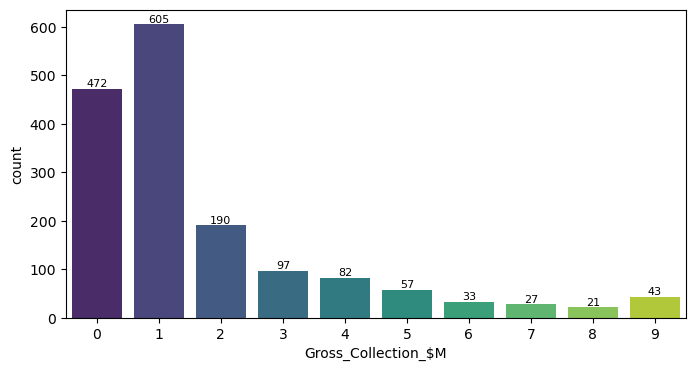

In [784]:
# Checking the count of feature 'Gross_Collection_$M' 

plt.figure(figsize=(8,4))
ct = sns.countplot(data = imdb_new, x = y_2, palette='viridis')

for i in ct.containers:
    ct.bar_label(i,fontsize=8)

In [785]:
# Importing SMOTE from imblearn

from imblearn.over_sampling import SMOTE

In [786]:
# Applying SMOTE technique

smt = SMOTE()

x2,y2 = smt.fit_resample(x,y_2)

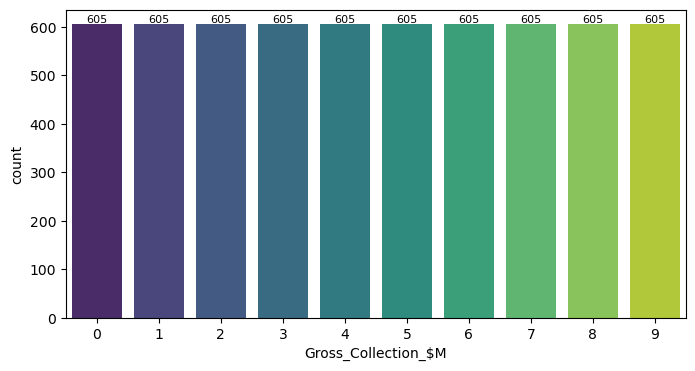

In [787]:
# Checking the count of feature 'Gross_Collection_$M' 

plt.figure(figsize=(8,4))
ct = sns.countplot(data = imdb_new, x = y2, palette='viridis')

for i in ct.containers:
    ct.bar_label(i,fontsize=8)

### Observations

Applied SMOTE technique to balance the classess in the target variable, as the classes were imbalanced

## Model Evaluation

In [788]:
# Importing required libraries

from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import ExtraTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import BaggingClassifier

from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.model_selection import cross_val_score

In [789]:
# Checking the dimension of the data 

x2.shape

(6050, 24)

In [790]:
# Checking the dimension of the data 

y2.shape

(6050,)

## Finding Random State

In [791]:
maxAcc = 0
maxRS = 0

for i in range(1,200):
    x2_train,x2_test,y2_train,y2_test = train_test_split(x2,y2,test_size=.30,random_state=i)
    rf = RandomForestClassifier()
    rf.fit(x2_train,y2_train)
    predrf = rf.predict(x2_test)
    acc = accuracy_score(y2_test,predrf)
    if acc > maxAcc:
        maxAcc = acc
        maxRS = i
print("Max Accuracy Score is",maxAcc*100,"on Random State",maxRS)

Max Accuracy Score is 98.23691460055096 on Random State 26


## Train_Test Split

In [792]:
# Training the Model with .30 as test size and random state at 26

x2_train,x2_test,y2_train,y2_test = train_test_split(x2,y2,test_size=.30, random_state = 26)

## GaussianNB

In [793]:
GB = GaussianNB()
GB.fit(x2_train,y2_train)
print(GB.score(x2_train,y2_train))
GB_predict = GB.predict(x2_test)
cross_val_13 = cross_val_score(GB,x2,y2,cv=5)

    
print('Accuracy Score:',accuracy_score(y2_test,GB_predict)*100)
print('CV score of GaussianNB:',cross_val_13.mean()*100)
print(confusion_matrix(y2_test,GB_predict))
print(classification_report(y2_test,GB_predict))

0.6538370720188902
Accuracy Score: 66.61157024793388
CV score of GaussianNB: 64.72727272727272
[[164  23   3   0   0   0   0   0   0   0]
 [  6 129  38   0   2   0   0   0   0   0]
 [  0  19 122  11   5   6   0   0   0   0]
 [  0   7  30  98  12  16   1   5   0   0]
 [  0   2   6  35  83  28   9   7   0   3]
 [  0   6   0   3  29  96  21  18   4   3]
 [  0   0   0   2   6  32 109  19  17   1]
 [  0   0   0   0   0  23  43  86  43   4]
 [  0   0   0   0   0   0  20   8 156   8]
 [  0   0   0   0   0   0   3   3  16 166]]
              precision    recall  f1-score   support

           0       0.96      0.86      0.91       190
           1       0.69      0.74      0.71       175
           2       0.61      0.75      0.67       163
           3       0.66      0.58      0.62       169
           4       0.61      0.48      0.54       173
           5       0.48      0.53      0.50       180
           6       0.53      0.59      0.56       186
           7       0.59      0.43      0.

## Logistic Regression

In [794]:
LR = LogisticRegression()
LR.fit(x2_train,y2_train)
print(LR.score(x2_train,y2_train))
LR_predict = LR.predict(x2_test)
cross_val_14 = cross_val_score(LR,x2,y2,cv=5)

    
print('Accuracy Score:',accuracy_score(y2_test,LR_predict)*100)
print('CV score of LogisticRegression:',cross_val_14.mean()*100)
print(confusion_matrix(y2_test,LR_predict))
print(classification_report(y2_test,LR_predict))

0.3541912632821724
Accuracy Score: 36.52892561983471
CV score of LogisticRegression: 30.59504132231405
[[169   9   9   0   0   0   0   1   2   0]
 [ 65  58  28   2   0   4   6   2  10   0]
 [  1  57  37   5   8  20   8   7  19   1]
 [  0  38  35   6   7  27  15  21  10  10]
 [  0  16   8   8  16  23  44  25  24   9]
 [  0   5   8   6  19  69  38   7   9  19]
 [  0   0   0   0   7  47  32  53  32  15]
 [  0   1   2   6   4  20  41  68  48   9]
 [  0   0   0   0   0   3  28  27  80  54]
 [  0   0   0   0   0   2  13  25  20 128]]
              precision    recall  f1-score   support

           0       0.72      0.89      0.80       190
           1       0.32      0.33      0.32       175
           2       0.29      0.23      0.26       163
           3       0.18      0.04      0.06       169
           4       0.26      0.09      0.14       173
           5       0.32      0.38      0.35       180
           6       0.14      0.17      0.16       186
           7       0.29      0.34

## Support Vector Classifier

In [795]:
svc = SVC(probability=True)
svc.fit(x2_train,y2_train)
print(svc.score(x2_train,y2_train))
svc_predict = svc.predict(x2_test)
cross_val_15 = cross_val_score(svc,x2,y2,cv=5)

    
print('Accuracy Score:',accuracy_score(y2_test,svc_predict)*100)
print('CV score of Support Vector Classifier:',cross_val_15.mean()*100)
print(confusion_matrix(y2_test,svc_predict))
print(classification_report(y2_test,svc_predict))

0.34805194805194806
Accuracy Score: 34.60055096418733
CV score of Support Vector Classifier: 34.8099173553719
[[ 17  21  13  21  15  33  22   6  22  20]
 [  8  15  16  16  22  28  20  12  26  12]
 [  6   8  36  15  14  25  17   7  31   4]
 [  2   9  18  46  12  33  18   9  15   7]
 [  4  13   9  16  43  32  14   7  27   8]
 [  0   7  14  12  10  85  27   3   0  22]
 [  0   2  36  17   5  19  81   6   8  12]
 [  9   2   1   4   9  24  27 100   3  20]
 [  0   7  17   3   3  25  11  13 108   5]
 [  1   4  30   2  11  19  18   0   6  97]]
              precision    recall  f1-score   support

           0       0.36      0.09      0.14       190
           1       0.17      0.09      0.11       175
           2       0.19      0.22      0.20       163
           3       0.30      0.27      0.29       169
           4       0.30      0.25      0.27       173
           5       0.26      0.47      0.34       180
           6       0.32      0.44      0.37       186
           7       0.61   

## KNeighbors Classifier

In [796]:
KNC = KNeighborsClassifier()
KNC.fit(x2_train,y2_train)
print(KNC.score(x2_train,y2_train))
KNC_predict = KNC.predict(x2_test)
cross_val_16 = cross_val_score(KNC,x2,y2,cv=5)

    
print('Accuracy Score:',accuracy_score(y2_test,KNC_predict)*100)
print('CV score of K Neighbors Classifier:',cross_val_16.mean()*100)
print(confusion_matrix(y2_test,KNC_predict))
print(classification_report(y2_test,KNC_predict))

0.7952774498229044
Accuracy Score: 71.12947658402203
CV score of K Neighbors Classifier: 71.78512396694214
[[ 57  23  16  16  18  18  13   9  12   8]
 [ 27  22  23  13  23  15   9  19  14  10]
 [ 11   9  98  10   4   6   9   4  10   2]
 [  2   5  10 141   2   2   2   1   3   1]
 [  2   1   7   9 144   0   0   1   6   3]
 [  3   2   5   6   3 155   1   2   0   3]
 [  0   0   6   2   0   4 166   0   3   5]
 [  2   1   4   5   3   5   1 176   1   1]
 [  2   3   5   6   1   1   2   3 168   1]
 [  2   0   6   2   6   1   6   1   0 164]]
              precision    recall  f1-score   support

           0       0.53      0.30      0.38       190
           1       0.33      0.13      0.18       175
           2       0.54      0.60      0.57       163
           3       0.67      0.83      0.74       169
           4       0.71      0.83      0.76       173
           5       0.75      0.86      0.80       180
           6       0.79      0.89      0.84       186
           7       0.81      

## Decision Tree Classifier

In [797]:
DTC = DecisionTreeClassifier()
DTC.fit(x2_train,y2_train)
print(DTC.score(x2_train,y2_train))
DTC_predict = DTC.predict(x2_test)
cross_val_17 = cross_val_score(DTC,x2,y2,cv=5)

    
print('Accuracy Score:',accuracy_score(y2_test,DTC_predict)*100)
print('CV score of Decision Tree Classifier:',cross_val_17.mean()*100)
print(confusion_matrix(y2_test,DTC_predict))
print(classification_report(y2_test,DTC_predict))

1.0
Accuracy Score: 89.20110192837465
CV score of Decision Tree Classifier: 88.89256198347107
[[175  12   2   0   1   0   0   0   0   0]
 [  4 149  14   1   3   2   1   1   0   0]
 [  1   4 141   8   7   1   1   0   0   0]
 [  0   2  10 149   3   5   0   0   0   0]
 [  0   0   2   9 142  14   4   2   0   0]
 [  0   2   1   3  12 151   5   1   5   0]
 [  0   0   3   2   1  11 160   6   3   0]
 [  0   0   0   0   2   1   4 186   5   1]
 [  0   0   0   0   0   2   3   2 184   1]
 [  0   0   0   0   0   1   1   1   3 182]]
              precision    recall  f1-score   support

           0       0.97      0.92      0.95       190
           1       0.88      0.85      0.87       175
           2       0.82      0.87      0.84       163
           3       0.87      0.88      0.87       169
           4       0.83      0.82      0.83       173
           5       0.80      0.84      0.82       180
           6       0.89      0.86      0.88       186
           7       0.93      0.93      0.9

## Random Forest Classifier

In [798]:
RFC = RandomForestClassifier()
RFC.fit(x2_train,y2_train)
print(RFC.score(x2_train,y2_train))
RFC_predict = RFC.predict(x2_test)
cross_val_18 = cross_val_score(RFC,x2,y2,cv=5)

    
print('Accuracy Score:',accuracy_score(y2_test,RFC_predict)*100)
print('CV score of Random Forest Classifier:',cross_val_18.mean()*100)
print(confusion_matrix(y2_test,RFC_predict))
print(classification_report(y2_test,RFC_predict))

1.0
Accuracy Score: 98.1267217630854
CV score of Random Forest Classifier: 97.37190082644626
[[188   2   0   0   0   0   0   0   0   0]
 [  2 164   8   1   0   0   0   0   0   0]
 [  0   2 155   3   3   0   0   0   0   0]
 [  0   0   3 166   0   0   0   0   0   0]
 [  0   0   1   5 167   0   0   0   0   0]
 [  0   0   0   1   1 178   0   0   0   0]
 [  0   0   0   0   0   0 186   0   0   0]
 [  0   0   0   0   0   0   1 198   0   0]
 [  0   0   0   0   0   0   1   0 191   0]
 [  0   0   0   0   0   0   0   0   0 188]]
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       190
           1       0.98      0.94      0.96       175
           2       0.93      0.95      0.94       163
           3       0.94      0.98      0.96       169
           4       0.98      0.97      0.97       173
           5       1.00      0.99      0.99       180
           6       0.99      1.00      0.99       186
           7       1.00      0.99      1.00

## Extra Tree Classifier

In [799]:
ETC = ExtraTreeClassifier()
ETC.fit(x2_train,y2_train)
print(ETC.score(x2_train,y2_train))
ETC_predict = ETC.predict(x2_test)
cross_val_19 = cross_val_score(ETC,x2,y2,cv=5)


print('Accuracy Score:',accuracy_score(y2_test,ETC_predict)*100)
print('CV score of Extra Tree Classifier:',cross_val_19.mean()*100)
print(confusion_matrix(y2_test,ETC_predict))
print(classification_report(y2_test,ETC_predict))

1.0
Accuracy Score: 80.44077134986226
CV score of Extra Tree Classifier: 78.92561983471073
[[148  36   3   1   1   0   0   1   0   0]
 [ 26 118  18   4   2   4   2   1   0   0]
 [  2  20 116  11   7   2   3   1   1   0]
 [  2   1   9 123  13  14   3   4   0   0]
 [  0   1   1  13 135  12   9   2   0   0]
 [  0   0   5   8   7 138  11   9   2   0]
 [  0   0   0   5   5   6 159   5   4   2]
 [  0   0   0   1  10   8   3 166   9   2]
 [  0   1   0   0   1   0   3   3 179   5]
 [  0   0   0   0   1   0   1   0   8 178]]
              precision    recall  f1-score   support

           0       0.83      0.78      0.80       190
           1       0.67      0.67      0.67       175
           2       0.76      0.71      0.74       163
           3       0.74      0.73      0.73       169
           4       0.74      0.78      0.76       173
           5       0.75      0.77      0.76       180
           6       0.82      0.85      0.84       186
           7       0.86      0.83      0.85  

## Gradient Boosting Classifier

In [800]:
GBC = GradientBoostingClassifier()
GBC.fit(x2_train,y2_train)
print(GBC.score(x2_train,y2_train))
GBC_predict = GBC.predict(x2_test)
cross_val_20 = cross_val_score(GBC,x2,y2,cv=5)


print('Accuracy Score:',accuracy_score(y2_test,GBC_predict)*100)
print('CV score of Gradient Boosting Classifier:',cross_val_20.mean()*100)
print(confusion_matrix(y2_test,GBC_predict))
print(classification_report(y2_test,GBC_predict))

0.9995277449822905
Accuracy Score: 96.03305785123966
CV score of Gradient Boosting Classifier: 94.79338842975208
[[187   3   0   0   0   0   0   0   0   0]
 [  0 162  11   1   1   0   0   0   0   0]
 [  0   1 149   8   5   0   0   0   0   0]
 [  0   0   3 161   2   3   0   0   0   0]
 [  0   0   1  10 157   5   0   0   0   0]
 [  0   0   0   2   4 172   1   0   1   0]
 [  0   0   0   0   1   3 182   0   0   0]
 [  0   0   0   0   0   0   3 196   0   0]
 [  0   0   0   0   0   0   1   0 191   0]
 [  0   0   0   0   0   0   0   0   2 186]]
              precision    recall  f1-score   support

           0       1.00      0.98      0.99       190
           1       0.98      0.93      0.95       175
           2       0.91      0.91      0.91       163
           3       0.88      0.95      0.92       169
           4       0.92      0.91      0.92       173
           5       0.94      0.96      0.95       180
           6       0.97      0.98      0.98       186
           7       1.00

## AdaBoost Classifier

In [801]:
ABC = AdaBoostClassifier()
ABC.fit(x2_train,y2_train)
print(ABC.score(x2_train,y2_train))
ABC_predict = ABC.predict(x2_test)
cross_val_21 = cross_val_score(ABC,x2,y2,cv=5)


print('Accuracy Score:',accuracy_score(y2_test,ABC_predict)*100)
print('CV score of Ada Boost Classifier:',cross_val_21.mean()*100)
print(confusion_matrix(y2_test,ABC_predict))
print(classification_report(y2_test,ABC_predict))

0.2793388429752066
Accuracy Score: 26.33608815426997
CV score of Ada Boost Classifier: 28.52892561983471
[[180   8   2   0   0   0   0   0   0   0]
 [ 57  98  19   0   1   0   0   0   0   0]
 [  0   8  31   0 124   0   0   0   0   0]
 [  0   0  12   0 157   0   0   0   0   0]
 [  0   0   4   0 169   0   0   0   0   0]
 [  0   0   1   0 179   0   0   0   0   0]
 [  0   0   0   0 186   0   0   0   0   0]
 [  0   0   0   0 199   0   0   0   0   0]
 [  0   0   0   0 192   0   0   0   0   0]
 [  0   0   0   0 188   0   0   0   0   0]]
              precision    recall  f1-score   support

           0       0.76      0.95      0.84       190
           1       0.86      0.56      0.68       175
           2       0.45      0.19      0.27       163
           3       0.00      0.00      0.00       169
           4       0.12      0.98      0.22       173
           5       0.00      0.00      0.00       180
           6       0.00      0.00      0.00       186
           7       0.00      0.

## Bagging Classifier

In [802]:
BC = BaggingClassifier()
BC.fit(x2_train,y2_train)
print(BC.score(x2_train,y2_train))
BC_predict = BC.predict(x2_test)
cross_val_22 = cross_val_score(BC,x2,y2,cv=5)


print('Accuracy Score:',accuracy_score(y2_test,BC_predict)*100)
print('CV score of Bagging Classifier:',cross_val_22.mean()*100)
print(confusion_matrix(y2_test,BC_predict))
print(classification_report(y2_test,BC_predict))

0.9971664698937426
Accuracy Score: 93.05785123966942
CV score of Bagging Classifier: 92.23140495867769
[[188   2   0   0   0   0   0   0   0   0]
 [  4 153  14   0   0   2   1   1   0   0]
 [  0   4 145  10   3   1   0   0   0   0]
 [  0   1   7 157   1   3   0   0   0   0]
 [  0   0   1   8 154   7   2   1   0   0]
 [  0   0   1   4   5 165   2   1   2   0]
 [  0   0   0   1   2   7 171   5   0   0]
 [  0   0   0   0   1   1   7 188   2   0]
 [  0   0   0   0   0   2   1   3 186   0]
 [  0   0   0   0   0   0   1   1   4 182]]
              precision    recall  f1-score   support

           0       0.98      0.99      0.98       190
           1       0.96      0.87      0.91       175
           2       0.86      0.89      0.88       163
           3       0.87      0.93      0.90       169
           4       0.93      0.89      0.91       173
           5       0.88      0.92      0.90       180
           6       0.92      0.92      0.92       186
           7       0.94      0.94

## AUC_ROC_CURVE - Area under the Curve Receiver Operating Characteristic

In [803]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

GaussianNB() 0.9481073190914854
LogisticRegression() 0.7895399975896208
RandomForestClassifier() 0.9995391220274178
ExtraTreeClassifier() 0.889323522446766
DecisionTreeClassifier() 0.9388985377969777
KNeighborsClassifier() 0.9188836487619734
GradientBoostingClassifier() 0.9985721280190922
AdaBoostClassifier() 0.6635309351455727
BaggingClassifier() 0.9929596724895897
SVC(probability=True) 0.757168192859781


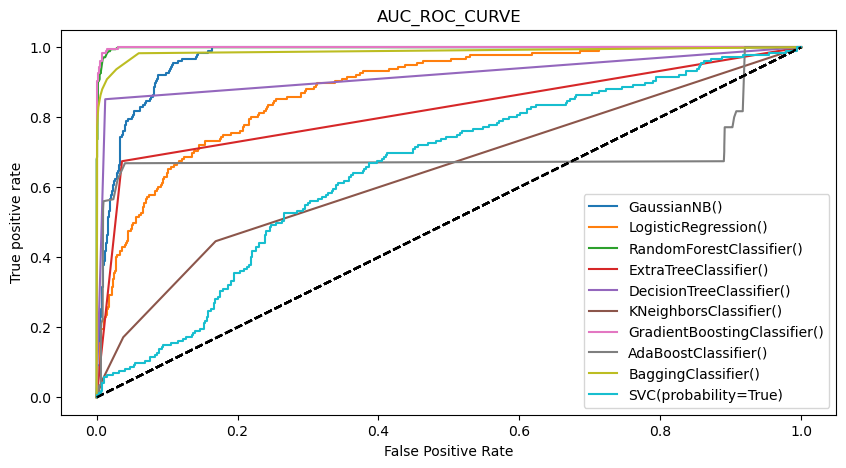

In [804]:
model = [GB,LR,RFC,ETC,DTC,KNC,GBC,ABC,BC,svc]
auc=[]


plt.figure(figsize=(10,5))
for i in model:
    y_pred_prob = i.predict_proba(x2_test)[:,1]
    fpr,tpr,thresholds = roc_curve(y2_test,y_pred_prob,pos_label=True)
    plt.plot(fpr,tpr,label=i )
    plt.plot([0,1],[0,1],'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True positive rate')
    plt.title('AUC_ROC_CURVE')
    plt.legend()


    auc_score = roc_auc_score(y2_test,i.predict_proba(x2_test),multi_class= 'ovo')
    auc.append(auc_score)
    print(i,auc_score)
plt.show()

### Observations

Model evaluation was done with 30% test size and random state at 26

Based on evaluation Gradient Boosting Classifier and Random Forest Classifier are performing well, hence proceeding both the models for Hyper Parameter Tuning

## Hyper Parameter Tuning

### Hyper Parameter Tuning - RandomForestClassifier

In [805]:
# Grid SearchCV for RandomForestClassifier

grid_params_3 = {'n_estimators':[50,100,150,200],'criterion':['gini','entropy','log_loss'],
            'max_depth':[5,10,20,50],'min_samples_split':[2,4,5],'max_features':['sqrt','log2']}
             
        
gs_3 = GridSearchCV(RandomForestClassifier(), param_grid = grid_params_3)

g_res_3 = gs_3.fit(x2_train,y2_train)

print('Best Score',g_res_3.best_score_)
print('Best Params',g_res_3.best_params_)

Best Score 0.966469893742621
Best Params {'criterion': 'gini', 'max_depth': 20, 'max_features': 'log2', 'min_samples_split': 2, 'n_estimators': 200}


In [806]:
# Applying parameters to RandomForestClassifier

Final_Model_3 = RandomForestClassifier(criterion ='gini',max_depth = 20,max_features ='log2',
                                      min_samples_split=2, n_estimators=200)
                                       
Final_Model_3.fit(x2_train,y2_train)
model_prediction_3 = Final_Model_3.predict(x2_test)
print(Final_Model_3.score(x2_train,y2_train))
cross_val_final_3 = cross_val_score(Final_Model_3,x2,y2,cv=5)

print('Accuracy_score',accuracy_score(y2_test,model_prediction_3)*100)
print('CV score of RandomForestClassifier:',cross_val_final_3.mean()*100)
print(confusion_matrix(y2_test,model_prediction_3))
print(classification_report(y2_test,model_prediction_3))

1.0
Accuracy_score 98.4573002754821
CV score of RandomForestClassifier: 97.65289256198348
[[186   4   0   0   0   0   0   0   0   0]
 [  1 169   5   0   0   0   0   0   0   0]
 [  0   1 157   2   3   0   0   0   0   0]
 [  0   0   4 165   0   0   0   0   0   0]
 [  0   0   0   5 168   0   0   0   0   0]
 [  0   0   0   1   0 179   0   0   0   0]
 [  0   0   0   0   0   0 186   0   0   0]
 [  0   0   0   0   0   0   1 198   0   0]
 [  0   0   0   0   0   0   1   0 191   0]
 [  0   0   0   0   0   0   0   0   0 188]]
              precision    recall  f1-score   support

           0       0.99      0.98      0.99       190
           1       0.97      0.97      0.97       175
           2       0.95      0.96      0.95       163
           3       0.95      0.98      0.96       169
           4       0.98      0.97      0.98       173
           5       1.00      0.99      1.00       180
           6       0.99      1.00      0.99       186
           7       1.00      0.99      1.00   

### Hyper Parameter Tuning for GradientBoostingClassifier

In [807]:
# Grid SearchCV for GradientBoostingClassifier

grid_params_4 = {'loss': ['log_loss', 'deviance', 'exponential'],
              "n_estimators": [50,100,150,200],'criterion': ['friedman_mse', 'squared_error'],
              'min_samples_leaf': [1, 2],
              "min_samples_split" : [2,4,5,6]}
            
            
gs_4 = GridSearchCV(GradientBoostingClassifier(), param_grid = grid_params_4)

g_res_4 = gs_4.fit(x2_train,y2_train)

print('Best Score',g_res_4.best_score_)
print('Best Params',g_res_4.best_params_)

Best Score 0.9428571428571427
Best Params {'criterion': 'friedman_mse', 'loss': 'log_loss', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 150}


In [808]:
# Applying parameters to GradientBoostingClassifier

Final_Model_4 = GradientBoostingClassifier(loss ='log_loss',criterion ='friedman_mse',min_samples_leaf = 1,
                                      min_samples_split=2, n_estimators=150)
                                       
Final_Model_4.fit(x2_train,y2_train)
model_prediction_4 = Final_Model_4.predict(x2_test)
print(Final_Model_4.score(x2_train,y2_train))
cross_val_final_4 = cross_val_score(Final_Model_4,x2,y2,cv=5)

print('Accuracy_score',accuracy_score(y2_test,model_prediction_4)*100)
print('CV score of GradientBoostingClassifier:',cross_val_final_4.mean()*100)
print(confusion_matrix(y2_test,model_prediction_4))
print(classification_report(y2_test,model_prediction_4))

1.0
Accuracy_score 96.5840220385675
CV score of GradientBoostingClassifier: 95.37190082644628
[[187   3   0   0   0   0   0   0   0   0]
 [  0 164  10   0   1   0   0   0   0   0]
 [  0   1 150   8   4   0   0   0   0   0]
 [  0   0   3 160   3   3   0   0   0   0]
 [  0   0   1   6 163   3   0   0   0   0]
 [  0   0   0   1   3 174   1   0   1   0]
 [  0   0   0   0   1   3 182   0   0   0]
 [  0   0   0   0   0   0   2 196   1   0]
 [  0   0   0   0   0   0   1   0 191   0]
 [  0   0   0   0   0   0   0   0   2 186]]
              precision    recall  f1-score   support

           0       1.00      0.98      0.99       190
           1       0.98      0.94      0.96       175
           2       0.91      0.92      0.92       163
           3       0.91      0.95      0.93       169
           4       0.93      0.94      0.94       173
           5       0.95      0.97      0.96       180
           6       0.98      0.98      0.98       186
           7       1.00      0.98      0.9

## AUC_ROC_Curve for Random Forest Classifier

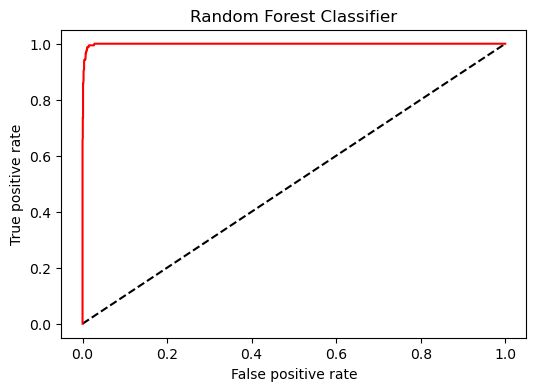

0.9995186566708597

In [809]:
# Checking roc_auc_score for RandomForestClassifier - Final Model_3

plt.figure(figsize=(6,4))

y_pred_prob_ = Final_Model_3.predict_proba(x2_test)[:,1]
fpr,tpr,thresholds = roc_curve(y2_test,y_pred_prob_,pos_label=True)
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr,label='Random Forest Classifier',color='r')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('Random Forest Classifier')
plt.show()

auc_score = roc_auc_score(y2_test,Final_Model_3.predict_proba(x2_test),multi_class ='ovo')
auc_score

### Observations

Based on Hyper Parameter Tuning and AUC_ROC_Score, Random Forest Classifier is performing well and finalizing as the best fit Model for Classification in predicting Gross_Collection_$M

## Saving the Model - Random Forest Classifier

In [810]:
# Saving the model using .pkl

joblib.dump(Final_Model_3,"IMDB_Gross_Collection_Pred_Classification_Model.pkl")

['IMDB_Gross_Collection_Pred_Classification_Model.pkl']

## Classification Model Prediction: Gross Collection

In [811]:
# Loading the saved model

Gross_Classification = joblib.load("IMDB_Gross_Collection_Pred_Classification_Model.pkl")

#Prediction
prediction_2 = Gross_Classification.predict(x2_test)
prediction_2

array([5, 5, 7, ..., 3, 8, 1], dtype=int64)

In [812]:
pd.set_option('display.max_rows',None)
pd.DataFrame([Gross_Classification.predict(x2_test)[:],y2_test[:]],index=["Predicted","Original"]).T

,Predicted,Original
0,5,5
1,5,5
2,7,7
3,6,6
4,9,9
5,3,3
6,7,7
7,6,6
8,7,7
9,7,7


## Conclusion For Classification Model Prediction: Gross_Collection_$M
 
Concluding Random Forest Classifier as the best fit Model based on below scores after Hyper Parameter Tuning

Accuracy_score 98.45%

CV score of RandomForestClassifier: 97.65%
    
AUC_Score : 99%
    
               precision    recall  f1-score   support

            0       0.99      0.98      0.99       190
            1       0.97      0.97      0.97       175
            2       0.95      0.96      0.95       163
            3       0.95      0.98      0.96       169
            4       0.98      0.97      0.98       173
            5       1.00      0.99      1.00       180
            6       0.99      1.00      0.99       186
            7       1.00      0.99      1.00       199
            8       1.00      0.99      1.00       192
            9       1.00      1.00      1.00       188

    _accuracy                           0.98      1815    
    macro avg       0.98      0.98      0.98      1815
weighted avg       0.98      0.98      0.98      1815

Performance of the Model is better than other Models and the Predicted Vs Original results are Excellent based on the Model scores

# Regression Model Evaluation -- Prediction: 'Votes'

## IQR Method

In [813]:
# Apply IQR method to remove outliers for each column

col3 = ['Duration', 'Year', 'Ratings', 'Metascore','Gross_Collection_$M', 'Director_Avg_Ratings', 
        'Director_Avg_Metascore', 'Director_Avg_Gross_Collection_$M', 'Star_1_Avg_Ratings',
        'Star_1_Avg_Metascore', 'Star_1_Avg_Gross_Collection_$M', 'Star_2_Avg_Ratings',
        'Star_2_Avg_Metascore', 'Star_2_Avg_Gross_Collection_$M', 'Star_3_Avg_Ratings', 
        'Star_3_Avg_Metascore', 'Star_3_Avg_Gross_Collection_$M', 'Star_4_Avg_Ratings', 
        'Star_4_Avg_Metascore', 'Star_4_Avg_Gross_Collection_$M']

for i in col3:
    
    Q1 = imdb[i].quantile(0.25)
    Q3 = imdb[i].quantile(0.75)
    IQR = Q3 - Q1
    outlier_threshold = 1.5 * IQR  # Adjust the multiplier as per your requirement
    
    # Remove outliers by filtering the values within the threshold
    imdb_new2 = imdb[(imdb[i] >= Q1 - outlier_threshold) & (imdb[i] <= Q3 + outlier_threshold)]

In [814]:
imdb.shape

(1748, 33)

In [815]:
imdb_new2.shape

(1593, 33)

In [816]:
# Data Loss

data_loss = (1748-1593)/1748*100
data_loss

8.867276887871855

### Observations

Applied IQR method to remove outliers and the data loss is 8.86% which is in acceptable range 

## Skewness

In [817]:
# Checking Skewness

imdb_new2.skew()

Director_Name                      -0.122686
Duration                            1.647322
Year                               -1.467120
Ratings                            -0.851398
Metascore                           0.080877
Star_1                              0.013645
Star_2                             -0.018181
Star_3                              0.029833
Star_4                              0.022929
Votes                               3.336495
Genre                               0.542200
Gross_Collection_$M                 2.154966
Certification                      -0.173323
Director_Avg_Ratings               -1.039185
Director_Avg_Metascore              0.074435
Director_Avg_Votes                  3.317675
Director_Avg_Gross_Collection_$M    2.330617
Star_1_Avg_Ratings                 -0.985488
Star_1_Avg_Metascore                0.191053
Star_1_Avg_Votes                    2.580710
Star_1_Avg_Gross_Collection_$M      2.672828
Star_2_Avg_Ratings                 -0.941733
Star_2_Avg

In [818]:
# Applying SQRT method to below features

imdb_new2['Duration']= np.sqrt(imdb_new2['Duration'])
imdb_new2['Year']= np.sqrt(imdb_new2['Year'])
imdb_new2['Ratings']= np.sqrt(imdb_new2['Ratings'])
imdb_new2['Star_1_Avg_Ratings']= np.sqrt(imdb_new2['Star_1_Avg_Ratings'])
imdb_new2['Star_2_Avg_Ratings']= np.sqrt(imdb_new2['Star_2_Avg_Ratings'])
imdb_new2['Star_3_Avg_Ratings']= np.sqrt(imdb_new2['Star_3_Avg_Ratings'])
imdb_new2['Star_4_Avg_Ratings']= np.sqrt(imdb_new2['Star_4_Avg_Ratings'])
imdb_new2['Director_Avg_Ratings']= np.sqrt(imdb_new2['Director_Avg_Ratings'])

imdb_new2['Star_1_Avg_Votes']= np.sqrt(imdb_new2['Star_1_Avg_Votes'])
imdb_new2['Star_2_Avg_Votes']= np.sqrt(imdb_new2['Star_2_Avg_Votes'])
imdb_new2['Star_3_Avg_Votes']= np.sqrt(imdb_new2['Star_3_Avg_Votes'])
imdb_new2['Star_4_Avg_Votes']= np.sqrt(imdb_new2['Star_4_Avg_Votes'])
imdb_new2['Director_Avg_Votes']= np.sqrt(imdb_new2['Director_Avg_Votes'])

imdb_new2['Gross_Collection_$M']= np.sqrt(imdb_new2['Gross_Collection_$M'])
imdb_new2['Director_Avg_Gross_Collection_$M']= np.sqrt(imdb_new2['Director_Avg_Gross_Collection_$M'])
imdb_new2['Star_1_Avg_Gross_Collection_$M']= np.sqrt(imdb_new2['Star_1_Avg_Gross_Collection_$M'])
imdb_new2['Star_2_Avg_Gross_Collection_$M']= np.sqrt(imdb_new2['Star_2_Avg_Gross_Collection_$M'])
imdb_new2['Star_3_Avg_Gross_Collection_$M']= np.sqrt(imdb_new2['Star_3_Avg_Gross_Collection_$M'])
imdb_new2['Star_4_Avg_Gross_Collection_$M']= np.sqrt(imdb_new2['Star_4_Avg_Gross_Collection_$M'])

In [819]:
# Removing skewness using power transform 

from sklearn.preprocessing import PowerTransformer

skew =['Duration','Director_Avg_Votes','Star_1_Avg_Votes','Star_2_Avg_Votes',
      'Star_3_Avg_Votes','Star_4_Avg_Votes','Star_1_Avg_Ratings','Star_2_Avg_Ratings','Star_3_Avg_Ratings',
       'Star_4_Avg_Ratings','Director_Avg_Ratings','Ratings']


pt = PowerTransformer(method='yeo-johnson',standardize=False)
imdb_new2[skew] = pt.fit_transform(imdb_new2[skew].values)

In [820]:
# Checking Skewness

imdb_new2.skew()

Director_Name                      -0.122686
Duration                           -0.078350
Year                               -1.483385
Ratings                             0.040935
Metascore                           0.080877
Star_1                              0.013645
Star_2                             -0.018181
Star_3                              0.029833
Star_4                              0.022929
Votes                               3.336495
Genre                               0.542200
Gross_Collection_$M                 0.371965
Certification                      -0.173323
Director_Avg_Ratings                0.108335
Director_Avg_Metascore              0.074435
Director_Avg_Votes                  0.021073
Director_Avg_Gross_Collection_$M    0.318751
Star_1_Avg_Ratings                  0.155527
Star_1_Avg_Metascore                0.191053
Star_1_Avg_Votes                    0.013331
Star_1_Avg_Gross_Collection_$M      0.336072
Star_2_Avg_Ratings                  0.094717
Star_2_Avg

### Observations

Skewness was high for the below features 

'Star_1_Avg_Ratings','Star_2_Avg_Ratings','Star_3_Avg_Ratings',
'Star_4_Avg_Ratings','Director_Avg_Ratings','Year','Ratings','Gross_Collection_$M','Duration','Director_Avg_Votes','Star_1_Avg_Votes',
'Star_2_Avg_Votes','Star_3_Avg_Votes', 'Star_4_Avg_Votes','Director_Avg_Gross_Collection','Star_1_Avg_Gross_Collection',
'Star_2_Avg_Gross_Collection','Star_3_Avg_Gross_Collection','Star_4_Avg_Gross_Collection'

Applied SQRT method to reduce skewness and to further reduce it below the threshold(+/- 0.5) applied power transform(yeo-johnson) method

For Year skewness was not reduced and further applying other method is converting the value to NaN, hence keeping the threshold to +/- 1.4

Not applied any transformation method to the target variable 'Votes'

## Variance Inflation Factor

In [821]:
# Checking Variance inflation factor for the dataset 

from statsmodels.stats.outliers_influence import variance_inflation_factor

x3 = imdb_new2.drop('Votes',axis=1)
x3.head(5)

,Director_Name,Duration,Year,Ratings,Metascore,Star_1,Star_2,Star_3,Star_4,Genre,Gross_Collection_$M,Certification,Director_Avg_Ratings,Director_Avg_Metascore,Director_Avg_Votes,Director_Avg_Gross_Collection_$M,Star_1_Avg_Ratings,Star_1_Avg_Metascore,Star_1_Avg_Votes,Star_1_Avg_Gross_Collection_$M,Star_2_Avg_Ratings,Star_2_Avg_Metascore,Star_2_Avg_Votes,Star_2_Avg_Gross_Collection_$M,Star_3_Avg_Ratings,Star_3_Avg_Metascore,Star_3_Avg_Votes,Star_3_Avg_Gross_Collection_$M,Star_4_Avg_Ratings,Star_4_Avg_Metascore,Star_4_Avg_Votes,Star_4_Avg_Gross_Collection_$M
0,539,0.516965,44.977772,214.635875,55.0,688,782,523,650,4,6.562012,8,331.477786,52.166667,3.657641,8.627978,254.445665,47.882353,4.056622,11.149159,254.875016,52.500,3.509927,8.992497,224.607321,57.500000,2.808108,5.656854,324.866739,56.25,2.703521,13.031117
1,372,0.517171,44.977772,369.524250,64.0,118,205,148,1071,3,6.562012,8,479.936025,65.800000,3.794906,13.956450,330.010483,60.888889,4.210191,19.024045,448.196516,64.000,3.502066,7.120042,305.460932,63.333333,2.982129,13.170611,498.865739,64.00,2.660321,6.955573
2,131,0.517538,44.977772,350.903393,78.0,367,659,417,763,38,6.562012,10,488.433642,75.333333,3.739398,11.468435,320.748858,59.214286,4.215421,10.002875,307.752285,55.125,3.662385,10.809795,356.029576,78.000000,2.903382,7.119691,472.630043,78.00,2.674449,6.955573
4,695,0.516502,44.977772,201.097280,48.0,517,339,845,926,3,6.562012,8,382.456244,60.666667,3.769101,14.086341,308.287259,60.666667,4.206937,14.086341,291.499816,58.000,3.607333,12.290647,203.786734,48.000000,2.892158,7.119691,264.185660,48.00,2.665529,6.955573
5,366,0.515160,44.966654,266.076967,70.0,333,20,482,944,74,6.562012,10,313.031191,61.500000,3.327007,0.141421,327.798665,70.000000,3.621385,7.585600,319.681203,70.000,3.222146,7.120042,269.800525,70.000000,2.710117,7.119691,353.960330,70.00,2.518155,6.955573


In [822]:
# Checking VIF

vif = pd.DataFrame()
vif['VIF Factor'] = [variance_inflation_factor(x3.values,i) for i in range(len(x3.columns))]
vif['Features'] = x3.columns
print(vif)

       VIF Factor                          Features
0        4.560722                     Director_Name
1   103504.144024                          Duration
2   103405.700263                              Year
3      386.469373                           Ratings
4      325.909207                         Metascore
5        4.104879                            Star_1
6        4.181871                            Star_2
7        4.005249                            Star_3
8        3.897973                            Star_4
9        3.062340                             Genre
10      43.616253               Gross_Collection_$M
11      30.273468                     Certification
12     119.035730              Director_Avg_Ratings
13     101.640065            Director_Avg_Metascore
14    3348.122872                Director_Avg_Votes
15      19.477808  Director_Avg_Gross_Collection_$M
16     106.320857                Star_1_Avg_Ratings
17      91.840979              Star_1_Avg_Metascore
18    2435.9

In [823]:
# Applying Scaling method

from sklearn.preprocessing import StandardScaler

m = ['Duration','Year','Ratings','Metascore','Gross_Collection_$M','Director_Avg_Ratings','Director_Avg_Metascore',
    'Director_Avg_Votes','Director_Avg_Gross_Collection_$M','Star_1_Avg_Ratings','Star_1_Avg_Metascore',
    'Star_1_Avg_Votes','Star_1_Avg_Gross_Collection_$M','Star_2_Avg_Ratings','Star_2_Avg_Metascore',
    'Star_2_Avg_Votes','Star_2_Avg_Gross_Collection_$M','Star_3_Avg_Ratings','Star_3_Avg_Metascore',
    'Star_3_Avg_Votes','Star_3_Avg_Gross_Collection_$M','Star_4_Avg_Ratings','Star_4_Avg_Metascore',
    'Star_4_Avg_Votes','Star_4_Avg_Gross_Collection_$M']

st= StandardScaler()
x3[m] = st.fit_transform(x3[m].values)
x3.sample(5)

,Director_Name,Duration,Year,Ratings,Metascore,Star_1,Star_2,Star_3,Star_4,Genre,Gross_Collection_$M,Certification,Director_Avg_Ratings,Director_Avg_Metascore,Director_Avg_Votes,Director_Avg_Gross_Collection_$M,Star_1_Avg_Ratings,Star_1_Avg_Metascore,Star_1_Avg_Votes,Star_1_Avg_Gross_Collection_$M,Star_2_Avg_Ratings,Star_2_Avg_Metascore,Star_2_Avg_Votes,Star_2_Avg_Gross_Collection_$M,Star_3_Avg_Ratings,Star_3_Avg_Metascore,Star_3_Avg_Votes,Star_3_Avg_Gross_Collection_$M,Star_4_Avg_Ratings,Star_4_Avg_Metascore,Star_4_Avg_Votes,Star_4_Avg_Gross_Collection_$M
1694,39,1.088868,0.754725,2.142501,0.068066,92,1091,17,958,52,0.053285,10,2.491167,0.059427,0.055660,0.115929,2.662113,0.049166,-0.026156,0.135101,2.442262,0.044029,0.063302,0.048475,2.315838,0.046557,0.125377,0.070925,2.309194,0.071635,0.198215,0.129046
1409,584,-0.572319,0.975308,0.686008,1.234942,697,1037,10,497,52,0.053285,12,0.787171,1.415980,-1.661536,0.115929,0.848280,1.544970,-1.797130,0.135101,0.770407,1.376028,-1.640787,0.048475,0.735793,1.315486,-1.586051,0.070925,0.736740,1.325726,-1.576614,0.129046
1286,807,-1.122742,0.681161,-0.424239,-1.012207,553,492,277,701,32,0.053285,10,-0.542652,-1.190879,-1.437337,0.115929,-0.465188,-0.698628,-0.514710,-0.476724,-0.492849,-1.181496,-1.503308,0.048475,0.107085,0.095597,1.101895,2.138608,-0.227196,-0.982910,-0.213786,-0.684700
354,470,0.368238,0.828271,0.106168,0.640109,667,980,157,627,7,2.042088,8,0.119187,0.725929,1.320311,1.764602,0.131627,0.784587,1.311335,1.752719,-0.216238,-0.300332,1.171799,1.583856,0.107085,0.669663,1.313382,1.806785,0.419743,1.148139,0.816830,1.022377
1189,561,-2.037683,0.460360,-0.424239,-0.946114,342,322,223,1102,9,-0.872150,10,-0.369554,-1.459232,-0.680487,-1.129197,-0.395214,-1.623290,-0.791335,-1.182423,-0.492849,-1.106275,-0.853890,-1.012873,-0.467830,-1.052534,-0.783790,-0.979552,-0.445645,-1.018427,-0.739023,-0.983947


In [824]:
# Dropping the features 'Star_4_Avg_Ratings','Star_4_Avg_Metascore'

x3.drop(['Star_4_Avg_Ratings','Star_4_Avg_Metascore'],axis=1,inplace=True)

In [825]:
# Dropping the features 'Star_3_Avg_Ratings','Star_3_Avg_Metascore'

x3.drop(['Star_3_Avg_Ratings','Star_3_Avg_Metascore'],axis=1,inplace=True)

In [826]:
# Dropping the features 'Star_2_Avg_Ratings'

x3.drop(['Star_2_Avg_Ratings'],axis=1,inplace=True)

In [827]:
# Dropping the features 'Certification'

x3.drop(['Certification'],axis=1,inplace=True)

In [828]:
# Checking VIF

vif = pd.DataFrame()
vif['VIF Factor'] = [variance_inflation_factor(x3.values,i) for i in range(len(x3.columns))]
vif['Features'] = x3.columns
print(vif)

    VIF Factor                          Features
0     3.755826                     Director_Name
1     1.293129                          Duration
2     1.161535                              Year
3     8.662199                           Ratings
4     8.353376                         Metascore
5     3.327872                            Star_1
6     3.508928                            Star_2
7     3.438071                            Star_3
8     3.370696                            Star_4
9     2.755063                             Genre
10    8.271768               Gross_Collection_$M
11    7.640079              Director_Avg_Ratings
12    5.876219            Director_Avg_Metascore
13    5.168751                Director_Avg_Votes
14    3.668651  Director_Avg_Gross_Collection_$M
15    5.446564                Star_1_Avg_Ratings
16    4.243773              Star_1_Avg_Metascore
17    4.437124                  Star_1_Avg_Votes
18    3.035425    Star_1_Avg_Gross_Collection_$M
19    4.473059      

### Observations

VIF was high for the below features

'Duration','Year','Ratings','Metascore','Gross_Collection_$M','Director_Avg_Ratings','Director_Avg_Metascore',
'Director_Avg_Votes','Director_Avg_Gross_Collection','Star_1_Avg_Ratings','Star_1_Avg_Metascore',
'Star_1_Avg_Votes','Star_1_Avg_Gross_Collection','Star_2_Avg_Ratings','Star_2_Avg_Metascore',
'Star_2_Avg_Votes','Star_2_Avg_Gross_Collection','Star_3_Avg_Ratings','Star_3_Avg_Metascore',
'Star_3_Avg_Votes','Star_3_Avg_Gross_Collection','Star_4_Avg_Ratings','Star_4_Avg_Metascore',
'Star_4_Avg_Votes','Star_4_Avg_Gross_Collection'

Applied Standard Scaler method to standardize the features and VIF have significantly reduced

Dropped the below features as it affects the original feature 'Ratings' and 'Metascore'

'Star_4_Avg_Ratings','Star_4_Avg_Metascore', 'Star_3_Avg_Ratings','Star_3_Avg_Metascore' and 'Star_2_Avg_Ratings'

For 'Certification' the VIF is high, moreover 85% of the data belongs to two categories, dropping the feature will provide better Model performance

After applying Standard Scaler and dropping the above features VIF is below the threshold(10) across all the features

# Model Evaluation

In [829]:
# Checking the dimension of the dataset

x3.shape

(1593, 26)

In [830]:
# Assigning the target variable as y3

y3 = imdb_new2['Votes']
y3.shape

(1593,)

## Finding Random State

In [831]:
maxAcc = 0
maxRS = 0

for i in range(1,200):
    x3_train,x3_test,y3_train,y3_test = train_test_split(x3,y3,test_size=.30,random_state=i)
    rf = RandomForestRegressor()
    rf.fit(x3_train,y3_train)
    predrf = rf.predict(x3_test)
    acc = r2_score(y3_test,predrf)
    if acc > maxAcc:
        maxAcc = acc
        maxRS = i
        
print("Max r2 score is ", maxAcc*100, "on Random state", maxRS)

Max r2 score is  94.73848296457908 on Random state 191


## Train_Test Split

In [832]:
# Training the Model with .30 as test size and random state at 191

x3_train,x3_test,y3_train,y3_test = train_test_split(x3,y3,test_size=.30, random_state = 191)

## Lasso

In [833]:
ls_2 = Lasso()

ls_2.fit(x3_train,y3_train)
ls_2.score(x3_train,y3_train)
print(ls_2.score(x3_train,y3_train)*100)
ls_2_predict=ls_2.predict(x3_test)
cross_val_23 = cross_val_score(ls_2,x3,y3, cv=5)

print('MSE:',mean_squared_error(ls_2_predict,y3_test))
print('MAE:',mean_absolute_error(ls_2_predict,y3_test))
print("RMSE:",np.sqrt(mean_squared_error(y3_test, ls_2_predict)))
print('r2_score:',r2_score(ls_2_predict,y3_test)*100)
print('CV score of Lasso:',cross_val_23.mean()*100)

69.2870598345225
MSE: 5914641978.967621
MAE: 52335.56258487544
RMSE: 76906.70958354427
r2_score: 62.6062203697106
CV score of Lasso: -220.92924776200437


## Ridge

In [834]:
rd_2 = Ridge()

rd_2.fit(x3_train,y3_train)
rd_2.score(x3_train,y3_train)
print(rd_2.score(x3_train,y3_train)*100)
rd_2_predict=rd_2.predict(x3_test)
cross_val_24 = cross_val_score(rd_2,x3,y3, cv=5)

print('MSE:',mean_squared_error(rd_2_predict,y3_test))
print('MAE:',mean_absolute_error(rd_2_predict,y3_test))
print("RMSE:",np.sqrt(mean_squared_error(y3_test, rd_2_predict)))
print('r2_score:',r2_score(rd_2_predict,y3_test)*100)
print('CV score of Ridge:',cross_val_24.mean()*100)

69.28642367271382
MSE: 5907150297.857241
MAE: 52301.692508376975
RMSE: 76857.9878598005
r2_score: 62.584834233906285
CV score of Ridge: -220.49334875284288


## Linear Regression

In [835]:
LR_2 = LinearRegression()

LR_2.fit(x3_train,y3_train)
LR_2.score(x3_train,y3_train)
print(LR_2.score(x3_train,y3_train)*100)
LR_2_predict=LR_2.predict(x3_test)
cross_val_25 = cross_val_score(LR_2,x3,y3, cv=5)

print('MSE:',mean_squared_error(LR_2_predict,y3_test))
print('MAE:',mean_absolute_error(LR_2_predict,y3_test))
print("RMSE:",np.sqrt(mean_squared_error(y3_test, LR_2_predict)))
print('r2_score:',r2_score(LR_2_predict,y3_test)*100)
print('CV score of Linear Regression:',cross_val_25.mean()*100)

69.2870602304209
MSE: 5914736204.566949
MAE: 52336.136569807204
RMSE: 76907.32217784565
r2_score: 62.60742803287871
CV score of Linear Regression: -220.94281979056126


## Support Vector Regressor

In [836]:
SV_2 = SVR()

SV_2.fit(x3_train,y3_train)
SV_2.score(x3_train,y3_train)
print(SV_2.score(x3_train,y3_train)*100)
SV_2_predict=SV_2.predict(x3_test)
cross_val_26 = cross_val_score(SV_2,x3,y3, cv=5)

print('MSE:',mean_squared_error(SV_2_predict,y3_test))
print('MAE:',mean_absolute_error(SV_2_predict,y3_test))
print("RMSE:",np.sqrt(mean_squared_error(y3_test, SV_2_predict)))
print('r2_score:',r2_score(SV_2_predict,y3_test)*100)
print('CV score of Support Vector Regressor:',cross_val_26.mean()*100)

-13.44802823402713
MSE: 23988592618.726406
MAE: 87563.91047657821
RMSE: 154882.51230764049
r2_score: -40405430766.72939
CV score of Support Vector Regressor: -236.68833961361207


## KNeighbors Regressor

In [837]:
KNN_2 = KNeighborsRegressor()

KNN_2.fit(x3_train,y3_train)
KNN_2.score(x3_train,y3_train)
print(KNN_2.score(x3_train,y3_train)*100)
KNN_2_predict = KNN_2.predict(x3_test)
cross_val_27 = cross_val_score(KNN_2,x3,y3, cv=5)

print('MSE:',mean_squared_error(KNN_2_predict,y3_test))
print('MAE:',mean_absolute_error(KNN_2_predict,y3_test))
print("RMSE:",np.sqrt(mean_squared_error(y3_test, KNN_2_predict)))
print('r2_score:',r2_score(KNN_2_predict,y3_test)*100)
print('CV score of K Neighbors Regressor:',cross_val_27.mean()*100)

19.66469573242322
MSE: 25699779994.970123
MAE: 109121.87238493723
RMSE: 160311.50924051
r2_score: -410.6272344871237
CV score of K Neighbors Regressor: -1047.1704541789866


## Decision Tree Regressor

In [838]:
DT_2 = DecisionTreeRegressor()

DT_2.fit(x3_train,y3_train)
DT_2.score(x3_train,y3_train)
print(DT_2.score(x3_train,y3_train)*100)
DT_2_predict = DT_2.predict(x3_test)
cross_val_28 = cross_val_score(DT_2,x3,y3, cv=5)

print('MSE:',mean_squared_error(DT_2_predict,y3_test))
print('MAE:',mean_absolute_error(DT_2_predict,y3_test))
print("RMSE:",np.sqrt(mean_squared_error(y3_test, DT_2_predict)))
print('r2_score:',r2_score(DT_2_predict,y3_test)*100)
print('CV score of Decision Tree Regressor:',cross_val_28.mean()*100)

100.0
MSE: 5827668848.422594
MAE: 27135.694560669457
RMSE: 76339.16981748356
r2_score: 67.86591008916865
CV score of Decision Tree Regressor: 54.60930844171836


## Random Forest Regressor

In [839]:
RFR_2 = RandomForestRegressor()

RFR_2.fit(x3_train,y3_train)
RFR_2.score(x3_train,y3_train)
print(RFR_2.score(x3_train,y3_train)*100)
RFR_2_predict=RFR_2.predict(x3_test)
cross_val_29 = cross_val_score(RFR_2,x3,y3, cv=5)

print('MSE:',mean_squared_error(RFR_2_predict,y3_test))
print('MAE:',mean_absolute_error(RFR_2_predict,y3_test))
print("RMSE:",np.sqrt(mean_squared_error(y3_test, RFR_2_predict)))
print('r2_score:',r2_score(RFR_2_predict,y3_test)*100)
print('CV score of Random Forest Regressor:',cross_val_29.mean()*100)

98.20974007740553
MSE: 1209121464.7017367
MAE: 16154.002468619246
RMSE: 34772.423911797356
r2_score: 94.01441755729638
CV score of Random Forest Regressor: 70.33353585422202


## Extra Trees Regressor

In [840]:
ET_2 = ExtraTreesRegressor()

ET_2.fit(x3_train,y3_train)
ET_2.score(x3_train,y3_train)
print(ET_2.score(x3_train,y3_train)*100)
ET_2_predict = ET_2.predict(x3_test)
cross_val_30 = cross_val_score(ET_2,x3,y3, cv=5)

print('MSE:',mean_squared_error(ET_2_predict,y3_test))
print('MAE:',mean_absolute_error(ET_2_predict,y3_test))
print("RMSE:",np.sqrt(mean_squared_error(y3_test, ET_2_predict)))
print('r2_score:',r2_score(ET_2_predict,y3_test)*100)
print('CV score of Extra Trees Regressor:',cross_val_30.mean()*100)

100.0
MSE: 1108529891.3965135
MAE: 16635.874560669457
RMSE: 33294.59252486075
r2_score: 94.73793885382206
CV score of Extra Trees Regressor: 76.62312015712962


## Gradient Boosting Regressor

In [841]:
GB_2 = GradientBoostingRegressor()

GB_2.fit(x3_train,y3_train)
GB_2.score(x3_train,y3_train)
print(GB_2.score(x3_train,y3_train)*100)
GB_2_predict = GB_2.predict(x3_test)
cross_val_31 = cross_val_score(GB_2,x3,y3, cv=5)

print('MSE:',mean_squared_error(GB_2_predict,y3_test))
print('MAE:',mean_absolute_error(GB_2_predict,y3_test))
print("RMSE:",np.sqrt(mean_squared_error(y3_test, GB_2_predict)))
print('r2_score:',r2_score(GB_2_predict,y3_test)*100)
print('CV score of Gradient Boosting Regressor:',cross_val_31.mean()*100)

98.62743130100856
MSE: 1334248799.349266
MAE: 20607.50167604062
RMSE: 36527.370550715335
r2_score: 93.96903258703438
CV score of Gradient Boosting Regressor: 69.96347814840863


## Bagging Regressor

In [842]:
BR_2 = BaggingRegressor()

BR_2.fit(x3_train,y3_train)
BR_2.score(x3_train,y3_train)
print(BR_2.score(x3_train,y3_train)*100)
BR_2_predict = BR_2.predict(x3_test)
cross_val_32 = cross_val_score(BR_2,x3,y3, cv=5)

print('MSE:',mean_squared_error(BR_2_predict,y3_test))
print('MAE:',mean_absolute_error(BR_2_predict,y3_test))
print("RMSE:",np.sqrt(mean_squared_error(y3_test, BR_2_predict)))
print('r2_score:',r2_score(BR_2_predict,y3_test)*100)
print('CV score of Bagging Regressor:',cross_val_32.mean()*100)

98.1851351966907
MSE: 1596078926.073975
MAE: 18638.847698744772
RMSE: 39950.95651012595
r2_score: 92.18544231834714
CV score of Bagging Regressor: 68.81013680807973


## AdaBoostRegressor

In [843]:
ABR_2 = AdaBoostRegressor()

ABR_2.fit(x3_train,y3_train)
ABR_2.score(x3_train,y3_train)
print(ABR_2.score(x3_train,y3_train)*100)
ABR_2_predict = ABR_2.predict(x3_test)
cross_val_33 = cross_val_score(ABR_2,x3,y3, cv=5)

print('MSE:',mean_squared_error(ABR_2_predict,y3_test))
print('MAE:',mean_absolute_error(ABR_2_predict,y3_test))
print("RMSE:",np.sqrt(mean_squared_error(y3_test, ABR_2_predict)))
print('r2_score:',r2_score(ABR_2_predict,y3_test)*100)
print('CV score of AdaBoost Regressor:',cross_val_33.mean()*100)

92.41883563840301
MSE: 2446326165.904137
MAE: 34548.57588352955
RMSE: 49460.349431682516
r2_score: 86.31294325258155
CV score of AdaBoost Regressor: -72.91887086233844


### Observations

Model evaluation was done with 30% test size and random state at 191

Based on evaluation Gradient Boosting Regressor, Extra Trees Regressor and Random Forest Regressor are performing well, hence proceeding these models for Hyper Parameter Tuning

## Hyper Parameter Tuning

### Hyper Parameter Tuning for ExtraTreesRegressor

In [844]:
# Grid SearchCV for ExtraTreesRegressor

grid_params_5 = {'n_estimators':[50,100,150,200],'criterion':['poisson','friedman_mse'],
             'min_samples_split':[2,4,5,6],'min_samples_leaf':[1,2],'max_depth':[50,100,120,150]}
            
                   
gs_5 = GridSearchCV(ExtraTreesRegressor(), param_grid = grid_params_5)

g_res_5 = gs_5.fit(x3_train,y3_train)

print('Best Score',g_res_5.best_score_)
print('Best Params',g_res_5.best_params_)

Best Score 0.8930746969831727
Best Params {'criterion': 'poisson', 'max_depth': 150, 'min_samples_leaf': 1, 'min_samples_split': 4, 'n_estimators': 200}


In [847]:
# Tuning ExtraTreesRegressor with parameters

Final_Model_5 = ExtraTreesRegressor(n_estimators =200, criterion = 'poisson',min_samples_split=4,max_depth=150,
                                  min_samples_leaf=1)
                                       
Final_Model_5.fit(x3_train,y3_train)
model_prediction_5 = Final_Model_5.predict(x3_test)
scores = r2_score(y3_test,model_prediction_5)
cross_val_final_5 = cross_val_score(Final_Model_5,x3,y3,cv=5)

print('MSE:',mean_squared_error(model_prediction_5,y3_test))
print('MAE:',mean_absolute_error(model_prediction_5,y3_test))
print("RMSE:",np.sqrt(mean_squared_error(model_prediction_5,y3_test)))
print('r2_score:',r2_score(model_prediction_5,y3_test)*100)
print('CV score of Extra Trees Regressor:',cross_val_final_5.mean()*100)

MSE: 972620138.5568296
MAE: 15515.048390864715
RMSE: 31186.858427177776
r2_score: 95.34156735503633
CV score of Extra Trees Regressor: 78.04766195600101


### Hyper Parameter Tuning for Gradient Boosting Regressor

In [848]:
# Grid SearchCV for GradientBoostingRegressor

grid_params_6 = {'learning_rate':[0.1, 0.05, 0.01], 'n_estimators':[100,150, 200, 300], 'max_depth': [3, 4, 5],
                'loss':['squared_error','absolute_error','huber','quantile'],
                 'criterion':['friedman_mse','squared_error']}

gs_6 = GridSearchCV(GradientBoostingRegressor(),param_grid=grid_params_6)

g_res_6 = gs_6.fit(x3_train,y3_train)

print('Best Score',g_res_6.best_score_)
print('Best Params',g_res_6.best_params_)

Best Score 0.8753340890224746
Best Params {'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'huber', 'max_depth': 4, 'n_estimators': 150}


In [849]:
# Tuning GradientBoostingRegressor with parameters

Final_Model_6 = GradientBoostingRegressor(criterion = 'friedman_mse', learning_rate= 0.1, loss = 'huber',
                                          max_depth=4 , n_estimators = 150)
                                                                                                            
Final_Model_6.fit(x3_train,y3_train)
model_prediction_6 = Final_Model_6.predict(x3_test)
scores = r2_score(y3_test,model_prediction_6)
cross_val_final_6 = cross_val_score(Final_Model_6,x3,y3,cv=5)

print('MSE:',mean_squared_error(model_prediction_6,y3_test))
print('MAE:',mean_absolute_error(model_prediction_6,y3_test))
print("RMSE:",np.sqrt(mean_squared_error(model_prediction_6,y3_test)))
print('r2_score:',r2_score(model_prediction_6,y3_test)*100)
print('CV score of GradientBoostingRegressor:',cross_val_final_6.mean()*100)

MSE: 1504081952.5375652
MAE: 18259.243662356424
RMSE: 38782.495439793005
r2_score: 93.58215460256874
CV score of GradientBoostingRegressor: 72.6053118338338


### Hyper Parameter Tuning for Random Forest Regressor

In [850]:
# Grid SearchCV for RandomForestRegressor

grid_params_7 = {'n_estimators':[50,100,150,200],'criterion':['poisson','friedman_mse'],
             'min_samples_split':[2,4,5,6],'min_samples_leaf':[1,2],'max_depth':[50,100,120,150]}
            
                   
gs_7 = GridSearchCV(RandomForestRegressor(), param_grid = grid_params_7)

g_res_7 = gs_7.fit(x3_train,y3_train)

print('Best Score',g_res_7.best_score_)
print('Best Params',g_res_7.best_params_)

Best Score 0.8731292306147684
Best Params {'criterion': 'poisson', 'max_depth': 100, 'min_samples_leaf': 2, 'min_samples_split': 4, 'n_estimators': 50}


In [851]:
# Tuning RandomForestRegressor with parameters

Final_Model_7 = RandomForestRegressor(n_estimators =50, criterion = 'poisson',min_samples_split=4,max_depth=100,
                                  min_samples_leaf=2)
                                       
Final_Model_7.fit(x3_train,y3_train)
model_prediction_7 = Final_Model_7.predict(x3_test)
scores = r2_score(y3_test,model_prediction_7)
cross_val_final_7 = cross_val_score(Final_Model_7,x3,y3,cv=5)

print('MSE:',mean_squared_error(model_prediction_7,y3_test))
print('MAE:',mean_absolute_error(model_prediction_7,y3_test))
print("RMSE:",np.sqrt(mean_squared_error(model_prediction_7,y3_test)))
print('r2_score:',r2_score(model_prediction_7,y3_test)*100)
print('CV score of Random Forest Regressor:',cross_val_final_7.mean()*100)

MSE: 1229597735.5531273
MAE: 16400.79876515047
RMSE: 35065.62042161991
r2_score: 93.98302205577606
CV score of Random Forest Regressor: 73.1835290142737


### Observations

Based on Hyper Parameter Tuning, Extra Trees Regressor is performing well and finalizing as the best fit Model for
Regression in predicting Votes

## Saving the model ExtraTreesRegressor

In [853]:
# Saving the model using .pkl

import joblib 

joblib.dump(Final_Model_5,"IMDB_Votes_Prediction_Regression_Model.pkl")

['IMDB_Votes_Prediction_Regression_Model.pkl']

## Regression Model Prediction: Votes

In [854]:
# Loading the saved model

Votes_Regression = joblib.load("IMDB_Votes_Prediction_Regression_Model.pkl")

#Prediction
prediction_3 = Votes_Regression.predict(x3_test)
prediction_3

array([ 206261.335     ,  376726.29083333,   64649.985     ,
         28715.745     ,  110783.72333333,   48662.97416667,
         76536.21583333,   90370.53666667,   29551.43916667,
         35228.25416667,   36078.07916667,   82577.24      ,
         74275.96583333,   42537.93083333,  146150.87083333,
        170998.8725    ,  278861.4775    ,  322445.49416667,
         82280.665     ,   99286.52666667,   74819.00166667,
         54990.32166667,   32660.62916667,  136587.52333333,
         66062.76166667,  111874.69583333,  717745.90666667,
        137893.14833333,  163131.08833333,   60288.4225    ,
        187851.9675    ,   75350.1025    ,   52244.9225    ,
         99027.87      ,  105653.59833333,   37697.395     ,
        170853.16083333,   39855.13666667,   36988.86166667,
         33880.0425    ,   93191.06833333,   28050.86916667,
         41822.13166667,  112775.38083333,   27799.67916667,
         93708.04583333,   93142.27      ,  232187.65583333,
        423316.355     ,

In [855]:
pd.set_option('display.max_rows',None)
pd.DataFrame([Votes_Regression.predict(x3_test)[:],y3_test[:]],index=["Predicted","Original"]).T

,Predicted,Original
0,2.062613e+05,205667.0
1,3.767263e+05,300743.0
2,6.464998e+04,61725.0
3,2.871574e+04,28615.0
4,1.107837e+05,104803.0
5,4.866297e+04,46062.0
6,7.653622e+04,76079.0
7,9.037054e+04,88118.0
8,2.955144e+04,27044.0
9,3.522825e+04,33200.0


## Conclusion for Regression Model Prediction: Votes

Concluding Extra Trees Regressor as the best fit Model based on below scores after Hyper Parameter Tuning 

MSE: 972620138.55
    
MAE: 15515.04
    
RMSE: 31186.85
    
r2_score: 95.34
    
CV score of Extra Trees Regressor: 78.04
    
Performance of the Model is better than other Models and the Predicted Vs Original results are very good based on 
the Model scores 

# Classification Model Evaluation_Prediction: Votes

### Bifurcating the Votes into 5 Categories

In [856]:
# Bifurcating the Votes into 5 categories

bin_edges = [0, 50000, 100000, 500000, 1000000, 3000000]

categories = ['0-50k', '50k-100k', '100k-500k', '500k-1M','Above_1M']
              
imdb_new2['Votes'] = pd.cut(imdb_new2['Votes'], bins=bin_edges, labels=categories, right=False).astype(str)

imdb_new2['Votes'].value_counts()

100k-500k    650
0-50k        472
50k-100k     415
500k-1M       50
Above_1M       6
Name: Votes, dtype: int64

In [857]:
# Assigning values from 0 to 4 to the 'Votes' column

category_mapping_2 = {"0-50k":0, "50k-100k":1, "100k-500k":2, "500k-1M":3, "Above_1M":4}

imdb_new2['Votes'] = imdb_new2['Votes'].replace(category_mapping_2)
imdb_new2['Votes'].value_counts()

2    650
0    472
1    415
3     50
4      6
Name: Votes, dtype: int64

### Observations

To apply classification algorithm to predict Votes, the target variable was bifurcated into 5 categories 
and mapped the values from 0 to 4

## Applying SMOTE

In [858]:
#Splitting the features to x and y
    
x3.shape

(1593, 26)

In [859]:
y_3 = imdb_new2['Votes']
y_3.shape

(1593,)

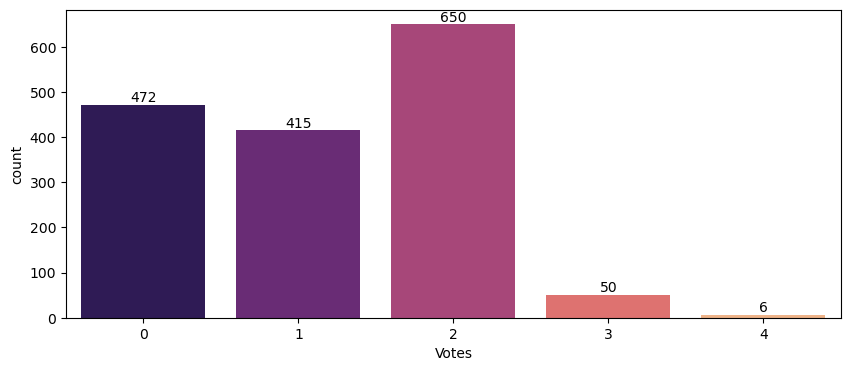

In [860]:
# Checking the count of feature 'Votes' 

plt.figure(figsize=(10,4))
ct = sns.countplot(data = imdb_new2, x = y_3, palette='magma')

for i in ct.containers:
    ct.bar_label(i,fontsize=10)

In [861]:
# Importing SMOTE from imblearn

from imblearn.over_sampling import SMOTE

In [862]:
# Applying SMOTE technique 

smt = SMOTE()

x4,y4 = smt.fit_resample(x3, y_3)

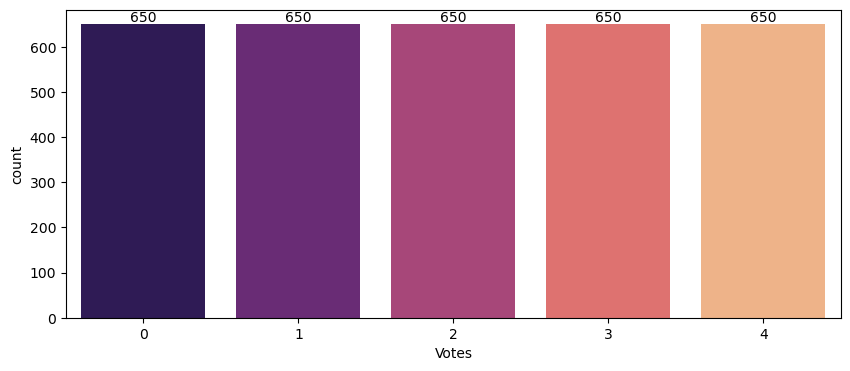

In [863]:
# Checking the count of feature 'Votes' 

plt.figure(figsize=(10,4))
ct = sns.countplot(data = imdb_new2, x = y4, palette='magma')

for i in ct.containers:
    ct.bar_label(i,fontsize=10)

### Observations

Applied SMOTE technique to balance the classess in the target variable, as the classes were imbalanced 

## Model Evaluation

In [864]:
# Checking the dimension of the data

x4.shape

(3250, 26)

In [865]:
# Checking the dimension of the data

y4.shape

(3250,)

## Finding Random State

In [866]:
maxAcc = 0
maxRS = 0

for i in range(1,200):
    x4_train,x4_test,y4_train,y4_test = train_test_split(x4,y4,test_size=.30,random_state=i)
    rf = RandomForestClassifier()
    rf.fit(x4_train,y4_train)
    predrf = rf.predict(x4_test)
    acc = accuracy_score(y4_test,predrf)
    if acc > maxAcc:
        maxAcc = acc
        maxRS = i
print("Max Accuracy Score is",maxAcc*100,"on Random State",maxRS)

Max Accuracy Score is 97.94871794871794 on Random State 45


## Train_Test Split

In [867]:
# Training the Model with .30 as test size and random state at 45

x4_train,x4_test,y4_train,y4_test = train_test_split(x4,y4,test_size=.30, random_state = 45)

## GaussianNB

In [868]:
GB_2 = GaussianNB()
GB_2.fit(x4_train,y4_train)
print(GB_2.score(x4_train,y4_train))
GB_2_predict = GB_2.predict(x4_test)
cross_val_34 = cross_val_score(GB_2,x4,y4,cv=5)

    
print('Accuracy Score:',accuracy_score(y4_test,GB_2_predict)*100)
print('CV score of GaussianNB:',cross_val_34.mean()*100)
print(confusion_matrix(y4_test,GB_2_predict))
print(classification_report(y4_test,GB_2_predict))

0.8628571428571429
Accuracy Score: 86.76923076923076
CV score of GaussianNB: 85.23076923076924
[[175  33   1   0   0]
 [ 28 158  14   0   0]
 [  0  36 129  13   0]
 [  0   0   3 191   1]
 [  0   0   0   0 193]]
              precision    recall  f1-score   support

           0       0.86      0.84      0.85       209
           1       0.70      0.79      0.74       200
           2       0.88      0.72      0.79       178
           3       0.94      0.98      0.96       195
           4       0.99      1.00      1.00       193

    accuracy                           0.87       975
   macro avg       0.87      0.87      0.87       975
weighted avg       0.87      0.87      0.87       975



## Logistic Regression

In [869]:
LR_2 = LogisticRegression()
LR_2.fit(x4_train,y4_train)
print(LR_2.score(x4_train,y4_train))
LR_2_predict = LR_2.predict(x4_test)
cross_val_35 = cross_val_score(LR_2,x4,y4,cv=5)

    
print('Accuracy Score:',accuracy_score(y4_test,LR_2_predict)*100)
print('CV score of Logistic Regression:',cross_val_35.mean()*100)
print(confusion_matrix(y4_test,LR_2_predict))
print(classification_report(y4_test,LR_2_predict))

0.7494505494505495
Accuracy Score: 75.38461538461539
CV score of Logistic Regression: 70.43076923076923
[[172  33   4   0   0]
 [ 41 124  35   0   0]
 [  1  45 100  28   4]
 [  0   0  24 146  25]
 [  0   0   0   0 193]]
              precision    recall  f1-score   support

           0       0.80      0.82      0.81       209
           1       0.61      0.62      0.62       200
           2       0.61      0.56      0.59       178
           3       0.84      0.75      0.79       195
           4       0.87      1.00      0.93       193

    accuracy                           0.75       975
   macro avg       0.75      0.75      0.75       975
weighted avg       0.75      0.75      0.75       975



## Support Vector Classifier

In [870]:
svc_2 = SVC(probability = True)

svc_2.fit(x4_train,y4_train)
print(svc_2.score(x4_train,y4_train))
svc_2_predict = svc_2.predict(x4_test)
cross_val_36 = cross_val_score(svc_2,x4,y4,cv=5)

    
print('Accuracy Score:',accuracy_score(y4_test,svc_2_predict)*100)
print('CV score of Support Vector Classifier:',cross_val_36.mean()*100)
print(confusion_matrix(y4_test,svc_2_predict))
print(classification_report(y4_test,svc_2_predict))

0.46065934065934067
Accuracy Score: 42.769230769230774
CV score of Support Vector Classifier: 43.63076923076923
[[ 30  27  50  66  36]
 [ 27  27  56  55  35]
 [ 21  11  56  62  28]
 [  8  17  20 120  30]
 [  0   0   0   9 184]]
              precision    recall  f1-score   support

           0       0.35      0.14      0.20       209
           1       0.33      0.14      0.19       200
           2       0.31      0.31      0.31       178
           3       0.38      0.62      0.47       195
           4       0.59      0.95      0.73       193

    accuracy                           0.43       975
   macro avg       0.39      0.43      0.38       975
weighted avg       0.39      0.43      0.38       975



## KNeighbors Classifier

In [871]:
KNC_2 = KNeighborsClassifier()

KNC_2.fit(x4_train,y4_train)
print(KNC_2.score(x4_train,y4_train))
KNC_2_predict = KNC_2.predict(x4_test)
cross_val_37 = cross_val_score(KNC_2,x4,y4,cv=5)

    
print('Accuracy Score:',accuracy_score(y4_test,KNC_2_predict)*100)
print('CV score of KNeighbors Classifier:',cross_val_37.mean()*100)
print(confusion_matrix(y4_test,KNC_2_predict))
print(classification_report(y4_test,KNC_2_predict))

0.7503296703296704
Accuracy Score: 59.897435897435905
CV score of KNeighbors Classifier: 62.70769230769231
[[ 92  47  37  25   8]
 [ 56  81  23  26  14]
 [ 55  39  41  29  14]
 [  2   7   4 177   5]
 [  0   0   0   0 193]]
              precision    recall  f1-score   support

           0       0.45      0.44      0.44       209
           1       0.47      0.41      0.43       200
           2       0.39      0.23      0.29       178
           3       0.69      0.91      0.78       195
           4       0.82      1.00      0.90       193

    accuracy                           0.60       975
   macro avg       0.56      0.60      0.57       975
weighted avg       0.56      0.60      0.57       975



## Decision Tree Classifier

In [872]:
DTC_2 = DecisionTreeClassifier()

DTC_2.fit(x4_train,y4_train)
print(DTC_2.score(x4_train,y4_train))
DTC_2_predict = DTC_2.predict(x4_test)
cross_val_38 = cross_val_score(DTC_2,x4,y4,cv=5)

    
print('Accuracy Score:',accuracy_score(y4_test,DTC_2_predict)*100)
print('CV score of Decision Tree Classifier:',cross_val_38.mean()*100)
print(confusion_matrix(y4_test,DTC_2_predict))
print(classification_report(y4_test,DTC_2_predict))

1.0
Accuracy Score: 94.15384615384616
CV score of Decision Tree Classifier: 93.50769230769231
[[199  10   0   0   0]
 [  5 183  12   0   0]
 [  2   9 160   7   0]
 [  0   0  12 183   0]
 [  0   0   0   0 193]]
              precision    recall  f1-score   support

           0       0.97      0.95      0.96       209
           1       0.91      0.92      0.91       200
           2       0.87      0.90      0.88       178
           3       0.96      0.94      0.95       195
           4       1.00      1.00      1.00       193

    accuracy                           0.94       975
   macro avg       0.94      0.94      0.94       975
weighted avg       0.94      0.94      0.94       975



## Random Forest Classifier

In [873]:
RFC_2 = RandomForestClassifier()

RFC_2.fit(x4_train,y4_train)
print(RFC_2.score(x4_train,y4_train))
RFC_2_predict = RFC_2.predict(x4_test)
cross_val_39 = cross_val_score(RFC_2,x4,y4,cv=5)

    
print('Accuracy Score:',accuracy_score(y4_test,RFC_2_predict)*100)
print('CV score of Random Forest Classifier:',cross_val_39.mean()*100)
print(confusion_matrix(y4_test,RFC_2_predict))
print(classification_report(y4_test,RFC_2_predict))

1.0
Accuracy Score: 97.74358974358974
CV score of Random Forest Classifier: 96.55384615384615
[[206   3   0   0   0]
 [  2 193   5   0   0]
 [  0   8 166   4   0]
 [  0   0   0 195   0]
 [  0   0   0   0 193]]
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       209
           1       0.95      0.96      0.96       200
           2       0.97      0.93      0.95       178
           3       0.98      1.00      0.99       195
           4       1.00      1.00      1.00       193

    accuracy                           0.98       975
   macro avg       0.98      0.98      0.98       975
weighted avg       0.98      0.98      0.98       975



## ExtraTreeClassifier

In [874]:
ET_2 = ExtraTreeClassifier()

ET_2.fit(x4_train,y4_train)
print(ET_2.score(x4_train,y4_train))
ET_2_predict = ET_2.predict(x4_test)
cross_val_40 = cross_val_score(ET_2,x4,y4,cv=5)

    
print('Accuracy Score:',accuracy_score(y4_test,ET_2_predict)*100)
print('CV score of Extra Tree Classifier:',cross_val_40.mean()*100)
print(confusion_matrix(y4_test,ET_2_predict))
print(classification_report(y4_test,ET_2_predict))

1.0
Accuracy Score: 84.92307692307692
CV score of Extra Tree Classifier: 86.06153846153845
[[167  36   6   0   0]
 [ 24 152  24   0   0]
 [  4  25 133  16   0]
 [  0   0  10 185   0]
 [  0   0   0   2 191]]
              precision    recall  f1-score   support

           0       0.86      0.80      0.83       209
           1       0.71      0.76      0.74       200
           2       0.77      0.75      0.76       178
           3       0.91      0.95      0.93       195
           4       1.00      0.99      0.99       193

    accuracy                           0.85       975
   macro avg       0.85      0.85      0.85       975
weighted avg       0.85      0.85      0.85       975



## Gradient Boosting Classifier

In [875]:
GBC_2 = GradientBoostingClassifier()

GBC_2.fit(x4_train,y4_train)
print(GBC_2.score(x4_train,y4_train))
GBC_2_predict = GBC_2.predict(x4_test)
cross_val_41 = cross_val_score(GBC_2,x4,y4,cv=5)

    
print('Accuracy Score:',accuracy_score(y4_test,GBC_2_predict)*100)
print('CV score of Gradient Boosting Classifier:',cross_val_41.mean()*100)
print(confusion_matrix(y4_test,GBC_2_predict))
print(classification_report(y4_test,GBC_2_predict))

1.0
Accuracy Score: 96.82051282051282
CV score of Gradient Boosting Classifier: 96.03076923076924
[[203   6   0   0   0]
 [  3 191   6   0   0]
 [  0   8 162   8   0]
 [  0   0   0 195   0]
 [  0   0   0   0 193]]
              precision    recall  f1-score   support

           0       0.99      0.97      0.98       209
           1       0.93      0.95      0.94       200
           2       0.96      0.91      0.94       178
           3       0.96      1.00      0.98       195
           4       1.00      1.00      1.00       193

    accuracy                           0.97       975
   macro avg       0.97      0.97      0.97       975
weighted avg       0.97      0.97      0.97       975



## Ada Boost Classifier

In [876]:
ABC_2 = AdaBoostClassifier()

ABC_2.fit(x4_train,y4_train)
print(ABC_2.score(x4_train,y4_train))
ABC_2_predict = ABC_2.predict(x4_test)
cross_val_42 = cross_val_score(ABC_2,x4,y4,cv=5)

    
print('Accuracy Score:',accuracy_score(y4_test,ABC_2_predict)*100)
print('CV score of Gradient Boosting Classifier:',cross_val_42.mean()*100)
print(confusion_matrix(y4_test,ABC_2_predict))
print(classification_report(y4_test,ABC_2_predict))

0.7960439560439561
Accuracy Score: 80.82051282051282
CV score of Gradient Boosting Classifier: 77.5076923076923
[[205   2   2   0   0]
 [ 76  46  78   0   0]
 [  0   5 152  21   0]
 [  0   0   3 192   0]
 [  0   0   0   0 193]]
              precision    recall  f1-score   support

           0       0.73      0.98      0.84       209
           1       0.87      0.23      0.36       200
           2       0.65      0.85      0.74       178
           3       0.90      0.98      0.94       195
           4       1.00      1.00      1.00       193

    accuracy                           0.81       975
   macro avg       0.83      0.81      0.78       975
weighted avg       0.83      0.81      0.77       975



## Bagging Classifier

In [877]:
BC_2 = BaggingClassifier()

BC_2.fit(x4_train,y4_train)
print(BC_2.score(x4_train,y4_train))
BC_2_predict = BC_2.predict(x4_test)
cross_val_43 = cross_val_score(BC_2,x4,y4,cv=5)

    
print('Accuracy Score:',accuracy_score(y4_test,BC_2_predict)*100)
print('CV score of Bagging Classifier:',cross_val_43.mean()*100)
print(confusion_matrix(y4_test,BC_2_predict))
print(classification_report(y4_test,BC_2_predict))

0.9982417582417582
Accuracy Score: 95.6923076923077
CV score of Bagging Classifier: 95.38461538461537
[[205   4   0   0   0]
 [  6 189   5   0   0]
 [  0  10 159   9   0]
 [  0   0   8 187   0]
 [  0   0   0   0 193]]
              precision    recall  f1-score   support

           0       0.97      0.98      0.98       209
           1       0.93      0.94      0.94       200
           2       0.92      0.89      0.91       178
           3       0.95      0.96      0.96       195
           4       1.00      1.00      1.00       193

    accuracy                           0.96       975
   macro avg       0.96      0.96      0.96       975
weighted avg       0.96      0.96      0.96       975



## AUC_ROC_CURVE - Area under the Curve Receiver Operating Characteristic

GaussianNB() 0.9763818820754147
LogisticRegression() 0.9363282503761328
SVC(probability=True) 0.7392941283236699
KNeighborsClassifier() 0.8349461101004433
DecisionTreeClassifier() 0.9630613816254708
RandomForestClassifier() 0.9988939215599106
ExtraTreeClassifier() 0.9055736659817928
GradientBoostingClassifier() 0.9984801509844384
AdaBoostClassifier() 0.9260632371226251
BaggingClassifier() 0.9960633575992546


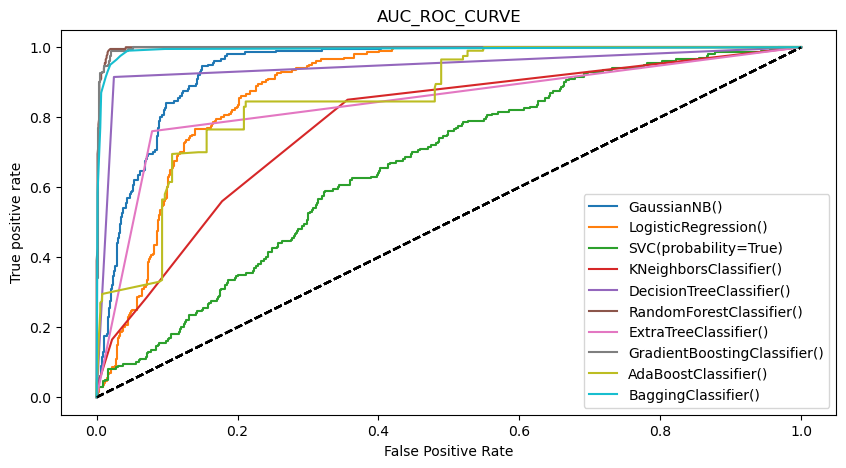

In [878]:
models = [GB_2, LR_2, svc_2, KNC_2, DTC_2, RFC_2, ET_2, GBC_2, ABC_2, BC_2]
auc=[]


plt.figure(figsize=(10,5))
for i in models:
    y_pred_prob = i.predict_proba(x4_test)[:,1]
    fpr,tpr,thresholds = roc_curve(y4_test,y_pred_prob,pos_label=True)
    plt.plot(fpr,tpr,label=i )
    plt.plot([0,1],[0,1],'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True positive rate')
    plt.title('AUC_ROC_CURVE')
    plt.legend()


    auc_score = roc_auc_score(y4_test,i.predict_proba(x4_test),multi_class= 'ovo')
    auc.append(auc_score)
    print(i,auc_score)
plt.show()

### Observations

Model evaluation was done with 30% test size and random state at 45

Based on evaluation Random Forest Classifier, Gradient Boosting Classifier and Bagging Classifier are performing well, hence proceeding these models for Hyper Parameter Tuning

## Hyper Parameter Tuning

### Hyper Parameter Tuning for Random Forest Classifier

In [879]:
# Grid SearchCV for Random Forest Classifier

grid_params_8 = {'n_estimators':[50,100,150,200],'criterion':['gini','entropy','log_loss'],
            'max_depth':[5,10,20,50],'min_samples_split':[2,4,5],'max_features':['sqrt','log2']}
             
        
gs_8 = GridSearchCV(RandomForestClassifier(), param_grid = grid_params_8)

g_res_8 = gs_8.fit(x4_train,y4_train)

print('Best Score',g_res_8.best_score_)
print('Best Params',g_res_8.best_params_)

Best Score 0.963076923076923
Best Params {'criterion': 'log_loss', 'max_depth': 20, 'max_features': 'log2', 'min_samples_split': 2, 'n_estimators': 150}


In [885]:
# Applying parameters to Random Forest Classifier

Final_Model_8 = RandomForestClassifier(criterion ='log_loss',max_depth = 20,max_features ='log2',
                                      min_samples_split=2, n_estimators=150)
                                    
Final_Model_8.fit(x4_train,y4_train)
model_prediction_8 = Final_Model_8.predict(x4_test)
print(Final_Model_8.score(x4_train,y4_train))
cross_val_final_8 = cross_val_score(Final_Model_8,x4,y4,cv=5)

print('Accuracy_score',accuracy_score(y4_test,model_prediction_8)*100)
print('CV score of Random Forest Classifier:',cross_val_final_8.mean()*100)
print(confusion_matrix(y4_test,model_prediction_8))
print(classification_report(y4_test,model_prediction_8))

1.0
Accuracy_score 98.15384615384616
CV score of Random Forest Classifier: 96.30769230769232
[[206   2   1   0   0]
 [  0 195   5   0   0]
 [  0   5 168   5   0]
 [  0   0   0 195   0]
 [  0   0   0   0 193]]
              precision    recall  f1-score   support

           0       1.00      0.99      0.99       209
           1       0.97      0.97      0.97       200
           2       0.97      0.94      0.95       178
           3       0.97      1.00      0.99       195
           4       1.00      1.00      1.00       193

    accuracy                           0.98       975
   macro avg       0.98      0.98      0.98       975
weighted avg       0.98      0.98      0.98       975



### Hyper Parameter Tuning for Gradient Boosting Classifier

In [886]:
# Grid SearchCV for Gradient Boosting Classifier

grid_params_9 = {'loss': ['log_loss', 'deviance', 'exponential'],
              "n_estimators": [50,100,150,200],'criterion': ['friedman_mse', 'squared_error'],
              'min_samples_leaf': [1, 2],
              "min_samples_split" : [2,4,5,6]}
            
            
gs_9 = GridSearchCV(GradientBoostingClassifier(), param_grid = grid_params_9)

g_res_9 = gs_9.fit(x4_train,y4_train)

print('Best Score',g_res_9.best_score_)
print('Best Params',g_res_9.best_params_)

Best Score 0.9586813186813187
Best Params {'criterion': 'friedman_mse', 'loss': 'log_loss', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}


In [887]:
# Applying parameters to Gradient Boosting Classifier

Final_Model_9 = GradientBoostingClassifier(criterion ='friedman_mse',loss = 'log_loss',min_samples_leaf = 1,
                                           min_samples_split = 2, n_estimators=100)


Final_Model_9.fit(x4_train,y4_train)
model_prediction_9 = Final_Model_9.predict(x4_test)
print(Final_Model_9.score(x4_train,y4_train))
cross_val_final_9 = cross_val_score(Final_Model_9,x4,y4,cv=5)

print('Accuracy_score',accuracy_score(y4_test,model_prediction_9)*100)
print('CV score of Gradient Boosting Classifier:',cross_val_final_9.mean()*100)
print(confusion_matrix(y4_test,model_prediction_9))
print(classification_report(y4_test,model_prediction_9))

1.0
Accuracy_score 96.82051282051282
CV score of Gradient Boosting Classifier: 96.03076923076924
[[203   6   0   0   0]
 [  3 191   6   0   0]
 [  0   8 162   8   0]
 [  0   0   0 195   0]
 [  0   0   0   0 193]]
              precision    recall  f1-score   support

           0       0.99      0.97      0.98       209
           1       0.93      0.95      0.94       200
           2       0.96      0.91      0.94       178
           3       0.96      1.00      0.98       195
           4       1.00      1.00      1.00       193

    accuracy                           0.97       975
   macro avg       0.97      0.97      0.97       975
weighted avg       0.97      0.97      0.97       975



### Hyper Parameter Tuning for Bagging Classifier

In [888]:
# Grid SearchCV for Bagging Classifier

grid_params_10 = {'n_estimators':[50,100,150,200],'bootstrap':[True,bool],'max_samples':[1.0,2.0,3.0],
                 'max_features':[1.0,2.0,3.0]}
            
            
gs_10 = GridSearchCV(BaggingClassifier(), param_grid = grid_params_10)

g_res_10 = gs_10.fit(x4_train,y4_train)

print('Best Score',g_res_10.best_score_)
print('Best Params',g_res_10.best_params_)

Best Score 0.9525274725274725
Best Params {'bootstrap': True, 'max_features': 1.0, 'max_samples': 1.0, 'n_estimators': 50}


In [889]:
# Applying parameters to BaggingClassifier

Final_Model_10 = BaggingClassifier(bootstrap = True, max_features = 1.0, max_samples = 1.0, n_estimators = 50)
                                      

Final_Model_10.fit(x4_train,y4_train)
model_prediction_10 = Final_Model_10.predict(x4_test)
print(Final_Model_10.score(x4_train,y4_train))
cross_val_final_10 = cross_val_score(Final_Model_10,x4,y4,cv=5)

print('Accuracy_score',accuracy_score(y4_test,model_prediction_10)*100)
print('CV score of Bagging Classifier:',cross_val_final_10.mean()*100)
print(confusion_matrix(y4_test,model_prediction_10))
print(classification_report(y4_test,model_prediction_10))

1.0
Accuracy_score 96.3076923076923
CV score of Bagging Classifier: 95.56923076923077
[[206   3   0   0   0]
 [  7 185   8   0   0]
 [  0   9 163   6   0]
 [  0   0   3 192   0]
 [  0   0   0   0 193]]
              precision    recall  f1-score   support

           0       0.97      0.99      0.98       209
           1       0.94      0.93      0.93       200
           2       0.94      0.92      0.93       178
           3       0.97      0.98      0.98       195
           4       1.00      1.00      1.00       193

    accuracy                           0.96       975
   macro avg       0.96      0.96      0.96       975
weighted avg       0.96      0.96      0.96       975



## AUC_ROC_CURVE Random Forest Classifier

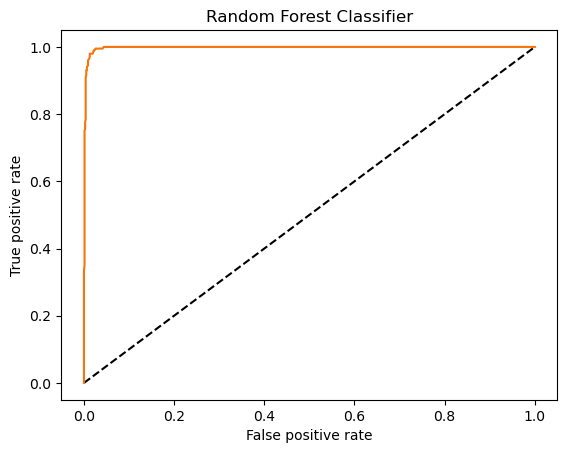

0.9988752729381793

In [893]:
# Checking roc_auc_score for Random Forest Classifier - Final Model_3

y_pred_prob_ = Final_Model_8.predict_proba(x4_test)[:,1]

fpr,tpr,thresholds = roc_curve(y4_test,y_pred_prob_,pos_label=True)
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr,label='Random Forest Classifier',color='#f97306')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('Random Forest Classifier')
plt.show()

auc_score = roc_auc_score(y4_test,Final_Model_8.predict_proba(x4_test),multi_class ='ovo')
auc_score

### Observations

Based on Hyper Parameter Tuning, Random Forest Classifier is performing well and finalizing as the best fit Model for
Classification in predicting Votes

## Saving the Model Random Forest Classifier

In [895]:
# Saving the Final Model_8 - Random Forest Classifier

joblib.dump(Final_Model_8,"IMDB_Votes_Pred_Classification_Model.pkl")

['IMDB_Votes_Pred_Classification_Model.pkl']

## Classification Model Prediction: Votes

In [898]:
# Loading the saved model

Votes_Classification = joblib.load("IMDB_Votes_Pred_Classification_Model.pkl")

prediction_4 = Votes_Classification.predict(x4_test)
prediction_4

array([4, 4, 3, 4, 0, 3, 2, 4, 1, 0, 0, 4, 4, 0, 0, 1, 1, 0, 4, 0, 0, 3,
       3, 2, 4, 3, 3, 1, 4, 3, 2, 3, 2, 3, 2, 1, 2, 1, 2, 4, 1, 4, 3, 1,
       3, 4, 4, 4, 4, 0, 0, 1, 3, 2, 0, 3, 0, 3, 4, 3, 3, 1, 3, 0, 3, 2,
       0, 3, 1, 2, 4, 2, 1, 2, 3, 3, 1, 0, 3, 0, 2, 3, 4, 1, 1, 0, 0, 0,
       0, 4, 2, 2, 3, 1, 1, 4, 3, 0, 0, 2, 4, 1, 0, 1, 0, 1, 0, 2, 2, 3,
       0, 1, 2, 4, 3, 2, 0, 2, 2, 4, 1, 0, 0, 1, 2, 3, 2, 3, 3, 4, 1, 4,
       0, 3, 4, 2, 0, 4, 1, 4, 1, 4, 4, 3, 3, 3, 0, 1, 4, 4, 2, 0, 0, 2,
       0, 2, 4, 0, 1, 4, 2, 3, 3, 1, 3, 1, 1, 1, 1, 3, 0, 4, 0, 4, 1, 1,
       4, 2, 2, 0, 1, 2, 0, 0, 2, 0, 2, 1, 2, 3, 1, 1, 3, 2, 2, 4, 4, 4,
       3, 4, 0, 2, 3, 3, 3, 3, 2, 1, 1, 4, 0, 1, 1, 2, 0, 4, 2, 3, 4, 1,
       2, 4, 1, 0, 1, 4, 2, 2, 3, 2, 1, 1, 4, 1, 4, 4, 4, 3, 0, 2, 2, 0,
       0, 3, 4, 2, 0, 0, 1, 1, 4, 2, 0, 4, 0, 4, 0, 0, 1, 3, 3, 3, 4, 2,
       4, 0, 1, 0, 4, 0, 3, 3, 0, 4, 2, 4, 2, 0, 0, 0, 3, 2, 0, 3, 4, 1,
       0, 1, 4, 1, 1, 1, 0, 4, 2, 1, 1, 1, 4, 4, 1,

In [899]:
pd.set_option("display.max_rows",None)
pd.DataFrame([Votes_Classification.predict(x4_test)[:],(y4_test)[:]], index = ["Predicted","Original"]).T

,Predicted,Original
0,4,4
1,4,4
2,3,3
3,4,4
4,0,0
5,3,3
6,2,2
7,4,4
8,1,1
9,0,0


## Conclusion for Classification Model Prediction: Votes

Concluding Random Forest Classifier as the best fit Model based on below scores after Hyper Parameter Tuning

Accuracy_score 98.15%

CV score of Random Forest Classifier: 96.30%
    
AUC_Score: 99%

                precision    recall  f1-score   support

            0       1.00      0.99      0.99       209
            1       0.97      0.97      0.97       200
            2       0.97      0.94      0.95       178
            3       0.97      1.00      0.99       195
            4       1.00      1.00      1.00       193

    _accuracy                           0.98       975
    macro avg       0.98      0.98      0.98       975
_weighted avg       0.98      0.98      0.98       975

Performance of the Model is better than other Models and the Predicted Vs Original results are excellent based on the Model scores 

# Final Conclusion

## Summary: Data Analysis

IMDB dataset was web scraped from IMDB site and the dataset contains 1750 rows and 22 columns

Dataset contains movie's from the year 1924 to 2023 which is almost 100 years

Most of the movies release years are in between 2000 to 2022 and 2016 recorded maximum releases with 78 count

Duration of the movies are mostly between 90 mins to 135 mins 

Ratings of the movies are mostly between 5.6 to 7.6 

Metascore of the movies are mostly ranges between 35 to 75 

Based on Gross_Collection we can observe, almost 75% of the data contains movies which have Gross_Collection below 
100 Million Dollars and remaining are above 100 Million Dollars 

PG-13 and R rated movies count are high and 75% of the movies are falling under these two categories 

Action, Crime, Drama 
Action, Adventure, Comedy 137
Action, Adventure

Movie Genres 'Action, Adventure, Sci-Fi', 'Action, Adventure, Fantasy', 'Action, Crime, Drama' Tops the list with 
Total Number of Votes

Movie Genres 'Action, Fantasy', 'Action, Comedy, Mystery', 'Action, Adventure' Tops the list for maximum Average Votes 

Based on Gross Collection 'Action, Adventure, Sci-Fi', 'Action, Adventure, Fantasy', 'Action, Adventure, Comedy' have the
highest Gross_Collection

'Action, Adventure', 'Action, Fantasy', 'Action, Adventure, Sci-Fi' Tops the list for maximum Average Gross_Collection

The average number of votes for movies tends to be higher when the movies have higher ratings 

Average number of votes for movies tends to be higher when the movies have higher Metascores and mostly between 
the range 80 to 98

Based on Gross_Collection Vs Total and Average Votes, we can observe
Most of the movies with higher Votes tends to have higher Gross_Collection which is above $200M

For Certification Vs Total Gross_Collection and Average Gross_Collection, PG-13 have the highest Gross Collection

For Year Vs Total Gross Collection, movies which released between the year 2000 to 2022 have highest 
Total Gross_Collection,
For Year Vs Average Gross Collection, movies which released in the year 2022 and 1977 have the highest 
Average Gross_Collection

For Ratings Vs Total Gross Collection, movie ratings between 6 to 8 have the highest Total Gross_Collection,
For Ratings Vs Average Gross Collection, movies which have high ratings tends to have higher Gross Collection and 
ratings above 8.5 have the highest Gross_Collection

For Metascore Vs Total Gross Collection, movie ratings between 40 to 80 have the highest Total Gross_Collection,
For Ratings Vs Average Gross Collection, movies which have high metascore tends to have higher Gross Collection and 
metascores above 80 have the highest Gross_Collection

## Summary: Data Pre-Processing, Feature Selection and Engineering

Original dataset contains 1750 rows and 22 columns

Data types present in the dataset are float64 – 3, int64 – 4 and object -15

#### Target Variables: 
Votes and Gross_Collection are the two target variables for Prediction
Regression and Classification algorithm were implemented for both the Target Variables, for classification the feature was
categorized into multi-class based on 'Gross_Collection' and 'Votes'

#### Null Values:
Null values were present in the dataset and it was treated with Simple Imputer by Mean(Normal Distribution), 
Median(Skewed) and Most_frequent(Categorical)

#### New features:
Dropped Features 'S.No', 'Popularity','Director_1','Director_2','Movie_Name','Stars','Genre_1','Genre_2','Genre_3 
for below reasons

'Director_1','Director_2' - As we have Director Name(combined) and moreover Director_2 have 93% null values

'S.No', 'Popularity', 'Movie_Name' - As we have 1750 unique values it wont be much relevant for Model Prediction

'Stars' - Dropped stars as it was already bifurcated into 4 categories

'Genre_1','Genre_2','Genre_3' - Dropped the categories and proceeded with combined Genre's for better Model Prediction

Created new features from Director_Name, Star_1, Star_2, Star_3 and Star_4 by calculating the average of Ratings, 
Metascore, Votes and Gross_Collection_$M for better Model performance

When tried with the original dataset the performance was very poor and the Cross validation scores were in negative

By creating new features helped the model to perform overall well in terms of all the metrics in both Regression and 
Classification Models

#### Label Encoding:
Encoded categorical features to numerical by Label Encoder 

When I applied One Hot Encoding to Genre_1, Genre_2, and Genre_3, the results were not as good as when I used
Label Encoding on the combined Genres, hence proceeded with Label Encoding

#### Correlation and Relationship with Target Variables
Features which was created additionally by the average of Ratings, Metascore, Votes and Gross_Collection are highly 
positively correlated with each other

All the categorical features Star_1, Star_2, Star_3, Star_4, Genre and Certification are having negative 
correlation with the other features

Year is having strong negative correlation with Ratings, Metascore and their average features which was created additionally

Regression Line for Year is flat, which indicates no relationship with the target Variable Gross_Collection_$M and Votes

#### Outliers Treatment
Data Loss was high when applying Zscore method, hence applied IQR method for both the target variables and the data loss
was below the threshold(10%)

#### Skewness
Applied SQRT method to reduce skewness and to further reduce it below the threshold(+/- 0.5) applied 
power transform(yeo-johnson) method

For Year skewness was not reduced and further applying other method is converting the value to NaN,
hence kept the threshold to +/- 1.4

#### VIF
Applied Standard Scaler method to standardize the features and VIF have significantly reduced

Applied PCA to reduce the VIF, but the performance of the Model was not good

Hence dropped few features to maintain the threshold(below 10) across all the features

#### Class Imbalance - SMOTE
To apply classification algorithm to predict Gross_Collection_$M and Votes, the target variable was bifurcated into
categories

Applied SMOTE technique to balance the classess in the target variable, as the classes were imbalanced

## Summary: Model Evaluation
    
As mentioned earlier Votes and Gross_Collection are the two target variables for
Prediction

Regression and Classification algorithm were implemented for both the Target Variables, 


#### Regression Model -- Prediction: 'Gross_Collection_$M'

Dimension of the dataset was 1627 rows and 24 columns

Model evaluation was done with 30% test size and random state at 199 

Based on evaluation and Hyper Parameter Tuning Extra Trees Regressor performance was very good with the following scores

MSE: 180.98
    
MAE: 6.81
    
RMSE: 13.45
    
r2_score: 94.28%
    
CV score of Extra Trees Regressor: 86.52%
    

#### Classification Model -- Prediction: 'Gross_Collection_$M'

Dimension of the dataset was 6050 rows and 24 columns(Applied SMOTE)

Model Evaluation was done with 30% test size and random state at 26

Based on evaluation and Hyper Parameter Tuning Random Forest Classifier performance was excellent with the following scores

Accuracy_score 98.45%

CV score of RandomForestClassifier: 97.65%

AUC_Score : 99%
    
    
#### Regression Model -- Prediction: 'Votes'

Dimension of the dataset was 1593 rows and 26 columns

Model evaluation was done with 30% test size and random state at 191

Based on evaluation and Hyper Parameter Tuning Extra Trees Regressor performance was very good with the following scores

MSE: 972620138.55
    
MAE: 15515.04
    
RMSE: 31186.85
    
r2_score: 95.34%
    
CV score of Extra Trees Regressor: 78.04%
    

#### Classification Model -- Prediction: 'Votes'

Dimension of the dataset was 3250 rows and 26 columns(Applied SMOTE)

Model evaluation was done with 30% test size and random state at 45

Based on evaluation and Hyper Parameter Tuning Random Forest Classifier performance was excellent with the following scores

Accuracy_score 98.15%

CV score of Random Forest Classifier: 96.30%

AUC_Score : 99%
    

#### Conclusion
Each time, different combinations of techniques were tried, which includes different methods of transformations, 
scaling, encoding, outlier treatment, and creating new features

The results were initially poor with the original dataset, but after creating new features, there was a 
significant improvement in performance across all metrics in both the Regression and Classification models

Moreover, if we include features such as Movie Budget, Starcast Salary, and Release Month, we can potentially 
enhance the accuracy of the model predictions. Additionally, by calculating the profit or loss and considering the month, 
we can predict the ideal season for a movie to maximize profitability

In conclusion, the models that have been developed are prepared for deployment to predict Votes and Gross_Collection, 
providing results for both Regression and Classification tasks.

*****Thank you for providing the opportunity to work on the IMDB Capstone Project*****